# Development notebook for processing sexual dimorphism data - Non neuronal version

In [1]:
# Isaac Berez
# 17.01.23
import sys
from scipy.io import mmread
import os
import glob
import pandas as pd
import numpy as np
#from pandas_ods_reader import read_ods
from copy import deepcopy
import pprint
import json
import re
from datetime import datetime
import logging
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import HuberRegressor
from sklearn import preprocessing
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform
from sklearn.manifold import TSNE
from sklearn import metrics
from sklearn.cluster import DBSCAN
import seaborn as sns
from sklearn.neighbors import NearestNeighbors
from collections import Counter
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage
import harmonypy as hm
from matplotlib.cm import ScalarMappable
from datetime import date
from itertools import compress
import mpld3
import matplotlib as mpl 

import dimorph_processing as dp

today = str(date.today())

%matplotlib notebook
%load_ext autoreload
%autoreload 2

#change matplotlib font type to make compatibile with illustrator
#mpl.rcParams['pdf.fonttype'] = 42
#mpl.rcParams['ps.fonttype'] = 42

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Table of Contents
1. [Introduction](#introduction)
2. [Data Loading](#data_loading)
3. [Filtering](#filtering)
    1. [Cell Exclusion](#cell_exclusion_l1)
    2. [Male vs. Female Gene Expression](#avg_bool_mf_df_sorted_l2)
    3. [Gene Exclusion](#gene_exclusion_l1)
4. [Feature Selection](feat_selection) 
    1. [CV analysis](#get_top_cv_genes)
5. [Preprocessing](#preprocessing) 
    1. [Log and Standerdize](#log_and_standerdize)
6. [Dimensionality Reduction and Integration](#dim_reduction)
    1. [PCA](#analyze_pca)
    2. [Harmony](#harmony)
    2. [t-SNE](#tsne)
        1. [Computing Perplexity](#get_perplexity)
        2. [Visualization](#do_tsne)
        3. [Marker Gene Overlay](#tsne_marker)
7. [Clustering](#clustering)
    1. [DBSCAN](#dbscan)
        1. [Computing Epsilon](#get_epsilon)
        2. [Visualization](#do_dbscan)
8. [Sorting](#cluster_sort)
    1. [Inter Cluster Sorting](#inter_cluster_sort)
    2. [Intra Cluster Sorting](#intra_cluster_sort)
9. [Marker Genes](#markergenes)
    1. [Compute Markers](#compute_marker_genes)
    2. [Heatmap](marker_heatmap)
10. [Cluster/Cell Labeling](#labeling)
    1. [Initialization](#classinit)
    2. [Mean Expression Calculation](#classmean)
    3. [Visualization](#classviz)

## Introduction <a name="introduction"></a>

Analysis notebook for processing sexual dimorphism data. Each processing step calls a function from dimorph_processing.py

## Data Loading <a name="data_loading"></a>

Intialize metadata (meta_data_df), gene expression data (df), boolean gene expression data (df_bool), and status tracking (status_df)

In [3]:
meta_data_df, df_orig, df_bool, status_df = dp.load_data(metadata_file = '/bigdata/isaac/meta_data_dict_040224.json', 
                                                         bigdata_file = '/bigdata/isaac/dimorph_df.feather')

In [4]:
df_orig.shape

(27933, 79613)

In [4]:
#df_orig.to_feather('/bigdata/isaac/df_orig.feather')

In [5]:
df_orig.head()

,AAACCCAAGAGCATAT-1_10X51_2,AAACCCAAGCCTCAGC-1_10X51_2,AAACCCAAGTACTGTC-1_10X51_2,AAACCCACACAACGTT-1_10X51_2,AAACCCAGTAACATAG-1_10X51_2,AAACCCATCACTAGCA-1_10X51_2,AAACGAACACTCCGAG-1_10X51_2,AAACGAACAGCGCGTT-1_10X51_2,AAACGAACAGGACTTT-1_10X51_2,AAACGAAGTGAATAAC-1_10X51_2,...,TTTGGTTTCCACGAAT-1_10X37_2,TTTGGTTTCTTTCTAG-1_10X37_2,TTTGTTGAGAAATTCG-1_10X37_2,TTTGTTGAGTGCTCGC-1_10X37_2,TTTGTTGCAAGGTCAG-1_10X37_2,TTTGTTGCACCGCTGA-1_10X37_2,TTTGTTGGTCCATAGT-1_10X37_2,TTTGTTGGTTGCGAAG-1_10X37_2,TTTGTTGTCGAAGGAC-1_10X37_2,TTTGTTGTCTCTGCTG-1_10X37_2
gene,,,,,,,,,,,,,,,,,,,,,
0610007P14Rik,0,2,0,2,0,0,1,3,2,0,...,1,0,1,0,2,1,1,0,0,0
0610009B22Rik,0,0,0,1,0,2,2,0,1,0,...,0,0,0,0,2,0,0,0,0,0
0610009L18Rik,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,1,0,1,0,0,0
0610009O20Rik,1,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0610010F05Rik,0,0,1,0,0,0,2,1,1,0,...,1,0,2,0,1,0,1,0,0,0


In [6]:
meta_data_df.shape

(27, 79613)

In [7]:
meta_data_df.head()

,AAACCCAAGAGCATAT-1_10X51_2,AAACCCAAGCCTCAGC-1_10X51_2,AAACCCAAGTACTGTC-1_10X51_2,AAACCCACACAACGTT-1_10X51_2,AAACCCAGTAACATAG-1_10X51_2,AAACCCATCACTAGCA-1_10X51_2,AAACGAACACTCCGAG-1_10X51_2,AAACGAACAGCGCGTT-1_10X51_2,AAACGAACAGGACTTT-1_10X51_2,AAACGAAGTGAATAAC-1_10X51_2,...,TTTGGTTTCCACGAAT-1_10X37_2,TTTGGTTTCTTTCTAG-1_10X37_2,TTTGTTGAGAAATTCG-1_10X37_2,TTTGTTGAGTGCTCGC-1_10X37_2,TTTGTTGCAAGGTCAG-1_10X37_2,TTTGTTGCACCGCTGA-1_10X37_2,TTTGTTGGTCCATAGT-1_10X37_2,TTTGTTGGTTGCGAAG-1_10X37_2,TTTGTTGTCGAAGGAC-1_10X37_2,TTTGTTGTCTCTGCTG-1_10X37_2
Serial_Number,98.0,98.0,98.0,98.0,98.0,98.0,98.0,98.0,98.0,98.0,...,68.0,68.0,68.0,68.0,68.0,68.0,68.0,68.0,68.0,68.0
Date_Captured,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,...,2019-11-25,2019-11-25,2019-11-25,2019-11-25,2019-11-25,2019-11-25,2019-11-25,2019-11-25,2019-11-25,2019-11-25
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,...,,,,,,,,,,


Histogram of total counts per cell

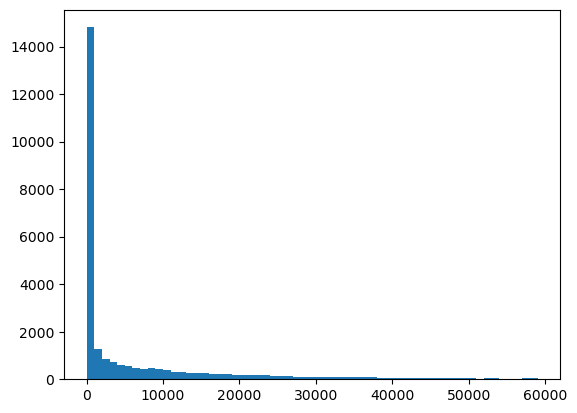

In [8]:
%matplotlib inline
plt.figure()
plt.hist(np.array(df_orig.sum(axis = 1)),bins = np.arange(0,60000, 1000))
plt.show()

In [9]:
status_df

,completion_status
cell_exclusion (l1),NaN
gene_exclusion (l1),NaN
get_top_cv_genes,NaN
log_and_standerdize,NaN
analyze_pca,NaN
get_perplexity,NaN
do_tsne,NaN
compute_eps,NaN
do_dbscan,NaN


## Filtering <a name="filtering"></a>

### Cell Exclusion <a name="cell_exclusion_l1"></a>

Use NN specific thresholds from FC paper

In [6]:
df, df_bool, meta_data_df, status_df = dp.cell_exclusion(threshold_m = 2000, 
                                                      threshold_g = 1000,
                                                      meta_data_df = meta_data_df,
                                                      df_bool = df_bool,
                                                      df = df_orig,
                                                      status_df = status_df)


Total cells reduced from 79613 to 60256


In [11]:
df.head()

,AAACCCAAGAGCATAT-1_10X51_2,AAACCCAAGCCTCAGC-1_10X51_2,AAACCCAAGTACTGTC-1_10X51_2,AAACCCACACAACGTT-1_10X51_2,AAACCCAGTAACATAG-1_10X51_2,AAACCCATCACTAGCA-1_10X51_2,AAACGAACACTCCGAG-1_10X51_2,AAACGAACAGCGCGTT-1_10X51_2,AAACGAACAGGACTTT-1_10X51_2,AAACGAAGTGAATAAC-1_10X51_2,...,TTTGGAGTCTCGCTTG-1_10X37_2,TTTGGTTTCCAATCTT-1_10X37_2,TTTGGTTTCCACGAAT-1_10X37_2,TTTGGTTTCTTTCTAG-1_10X37_2,TTTGTTGAGAAATTCG-1_10X37_2,TTTGTTGCAAGGTCAG-1_10X37_2,TTTGTTGCACCGCTGA-1_10X37_2,TTTGTTGGTCCATAGT-1_10X37_2,TTTGTTGGTTGCGAAG-1_10X37_2,TTTGTTGTCGAAGGAC-1_10X37_2
gene,,,,,,,,,,,,,,,,,,,,,
0610007P14Rik,0,2,0,2,0,0,1,3,2,0,...,1,1,1,0,1,2,1,1,0,0
0610009B22Rik,0,0,0,1,0,2,2,0,1,0,...,0,0,0,0,0,2,0,0,0,0
0610009L18Rik,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,1,0,1,0,0
0610009O20Rik,1,0,0,0,0,1,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0
0610010F05Rik,0,0,1,0,0,0,2,1,1,0,...,0,0,1,0,2,1,0,1,0,0


In [12]:
df.shape #rerun

(27933, 60256)

In [13]:
status_df

,completion_status
cell_exclusion (l1),True
gene_exclusion (l1),NaN
get_top_cv_genes,NaN
log_and_standerdize,NaN
analyze_pca,NaN
get_perplexity,NaN
do_tsne,NaN
compute_eps,NaN
do_dbscan,NaN


Sanity Check of known specific sex genes

In [14]:
print ('Xist' in df.index)
print ('Tsix' in df.index)
print ('Ddx3y' in df.index)
print ('Eif2s3y' in df.index)
print ('Kdm5d' in df.index)
print ('Uty' in df.index)

True
True
True
True
True
True


### Male vs. Female Gene Expression <a name="avg_bool_mf_df_sorted_l2"></a>

In [7]:
%matplotlib notebook
avg_bool_mf_df_sorted_l2 = dp.avg_bool_gene_expression_by_sex(df_bool = df_bool,
                                                              meta_data_df=meta_data_df,
                                                             num_top_genes=10,
                                                             plot_flag=1)

num m cells: 27252 num f cells: 33004


<IPython.core.display.Javascript object>

### Gene Exclusion <a name="gene_exclusion_l1"></a> 

Keep only genes expressed in >10 cells, <50% of all cells

In [8]:
df_ge, df_bool, meta_data_df, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                      percent_cell_upper_bound=50,
                                                     df_bool=df_bool,
                                                     df = df,
                                                     meta_data_df = meta_data_df,
                                                     status_df = status_df)
df_ge.head()

Total genes reduced from 27933 to 18131


,AAACCCAAGAGCATAT-1_10X51_2,AAACCCAAGCCTCAGC-1_10X51_2,AAACCCAAGTACTGTC-1_10X51_2,AAACCCACACAACGTT-1_10X51_2,AAACCCAGTAACATAG-1_10X51_2,AAACCCATCACTAGCA-1_10X51_2,AAACGAACACTCCGAG-1_10X51_2,AAACGAACAGCGCGTT-1_10X51_2,AAACGAACAGGACTTT-1_10X51_2,AAACGAAGTGAATAAC-1_10X51_2,...,TTTGGAGTCTCGCTTG-1_10X37_2,TTTGGTTTCCAATCTT-1_10X37_2,TTTGGTTTCCACGAAT-1_10X37_2,TTTGGTTTCTTTCTAG-1_10X37_2,TTTGTTGAGAAATTCG-1_10X37_2,TTTGTTGCAAGGTCAG-1_10X37_2,TTTGTTGCACCGCTGA-1_10X37_2,TTTGTTGGTCCATAGT-1_10X37_2,TTTGTTGGTTGCGAAG-1_10X37_2,TTTGTTGTCGAAGGAC-1_10X37_2
gene,,,,,,,,,,,,,,,,,,,,,
0610007P14Rik,0,2,0,2,0,0,1,3,2,0,...,1,1,1,0,1,2,1,1,0,0
0610009B22Rik,0,0,0,1,0,2,2,0,1,0,...,0,0,0,0,0,2,0,0,0,0
0610009L18Rik,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,1,0,1,0,0
0610009O20Rik,1,0,0,0,0,1,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0
0610010F05Rik,0,0,1,0,0,0,2,1,1,0,...,0,0,1,0,2,1,0,1,0,0


In [17]:
meta_data_df.shape

(27, 60256)

In [18]:
df_ge.shape

(18131, 60256)

In [19]:
status_df

,completion_status
cell_exclusion (l1),True
gene_exclusion (l1),True
get_top_cv_genes,NaN
log_and_standerdize,NaN
analyze_pca,NaN
get_perplexity,NaN
do_tsne,NaN
compute_eps,NaN
do_dbscan,NaN


#### Sanity Check of known specific sex genes

In [20]:
print ('Xist' in df.index)
print ('Tsix' in df.index)
print ('Ddx3y' in df.index)
print ('Eif2s3y' in df.index)
print ('Kdm5d' in df.index)
print ('Uty' in df.index)

True
True
True
True
True
True


## Feature Selection <a name="feat_selection"></a> 

### CV Analysis <a name="get_top_cv_genes"></a> 

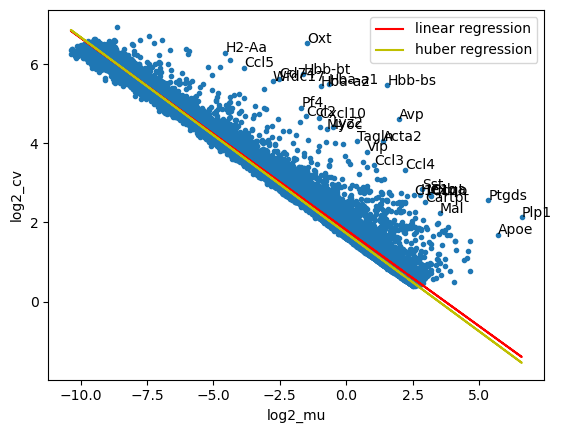

In [9]:
%matplotlib inline
cv_df,df_n = dp.analyze_cv(df = df_ge,
                      norm_scale_factor=20000,
                      num_top_genes=30,
                      plot_flag=1,
                     use_huber = True)

In [22]:
np.all(df_ge.columns == df_n.columns)

True

In [23]:
cv_df.head()

,log2mu,log2cv,delta_cv
gene,,,
Hbb-bs,1.554900,5.471924,4.513548
Oxt,-1.479266,6.535101,4.071732
Avp,1.974839,4.613566,3.863486
Plp1,6.610402,2.129998,3.679226
Ptgds,5.351465,2.563495,3.488271


In [24]:
cv_df.shape

(18131, 3)

Use highest variation CV genes to get top genes

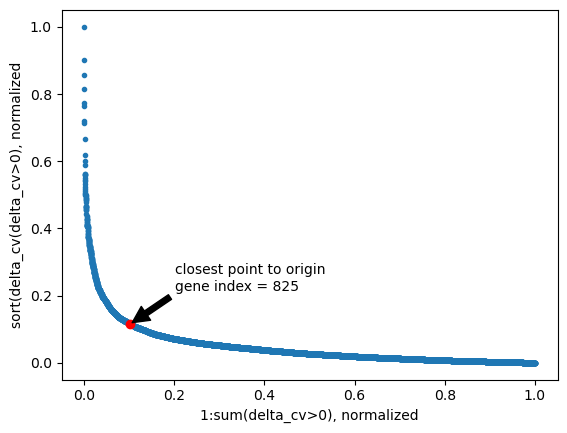

In [10]:
gene_index, df, status_df = dp.get_top_cv_genes(df = df_ge, cv_df=cv_df, plot_flag=1, status_df=status_df)

In [11]:
df.shape

(825, 60256)

In [27]:
gene_index

825

In [28]:
status_df

,completion_status
cell_exclusion (l1),True
gene_exclusion (l1),True
get_top_cv_genes,True
log_and_standerdize,NaN
analyze_pca,NaN
get_perplexity,NaN
do_tsne,NaN
compute_eps,NaN
do_dbscan,NaN


utilize mean-variance relationship (PCA). Why this as opposed t mean-dropout relationship? see 'feature selection' section in :
https://www.nature.com/articles/s41467-019-13056-x

## Preprocessing <a name="preprocessing"></a> 

### Log and Standerdize <a name="#log_and_standerdize"></a> 

In [29]:
df.head()

,AAACCCAAGAGCATAT-1_10X51_2,AAACCCAAGCCTCAGC-1_10X51_2,AAACCCAAGTACTGTC-1_10X51_2,AAACCCACACAACGTT-1_10X51_2,AAACCCAGTAACATAG-1_10X51_2,AAACCCATCACTAGCA-1_10X51_2,AAACGAACACTCCGAG-1_10X51_2,AAACGAACAGCGCGTT-1_10X51_2,AAACGAACAGGACTTT-1_10X51_2,AAACGAAGTGAATAAC-1_10X51_2,...,TTTGGAGTCTCGCTTG-1_10X37_2,TTTGGTTTCCAATCTT-1_10X37_2,TTTGGTTTCCACGAAT-1_10X37_2,TTTGGTTTCTTTCTAG-1_10X37_2,TTTGTTGAGAAATTCG-1_10X37_2,TTTGTTGCAAGGTCAG-1_10X37_2,TTTGTTGCACCGCTGA-1_10X37_2,TTTGTTGGTCCATAGT-1_10X37_2,TTTGTTGGTTGCGAAG-1_10X37_2,TTTGTTGTCGAAGGAC-1_10X37_2
gene,,,,,,,,,,,,,,,,,,,,,
Hbb-bs,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Oxt,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Avp,0,0,1,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
Plp1,0,0,0,2,0,0,0,0,1,0,...,0,0,1,0,71,0,0,0,1,0
Ptgds,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,9,0,0,0,0,0


In [30]:
df.shape

(825, 60256)

In [12]:
log_std_arr,status_df = dp.log_and_standerdize_df(df,status_df)

column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


In [32]:
log_std_arr.shape

(60256, 825)

In [33]:
status_df

,completion_status
cell_exclusion (l1),True
gene_exclusion (l1),True
get_top_cv_genes,True
log_and_standerdize,True
analyze_pca,NaN
get_perplexity,NaN
do_tsne,NaN
compute_eps,NaN
do_dbscan,NaN


Create log/standerdized version of df to use in inter cluster sorting alg later

In [13]:
df_ls = pd.DataFrame(data = log_std_arr.T, index = df.index, columns=df.columns)

## Dimensionality Reduction <a name="dim_reduction"></a> 

### PCA <a name="analyze_pca"></a> 

Do PCA intially with num components = all genes, use normalized explained variance to select highest variation PCs and reduce gene expression to this dimension 

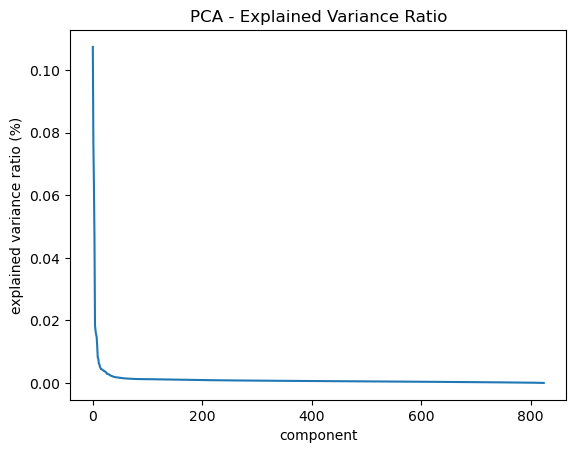

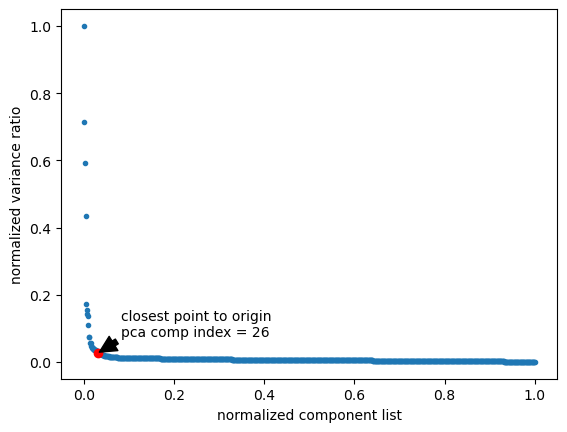

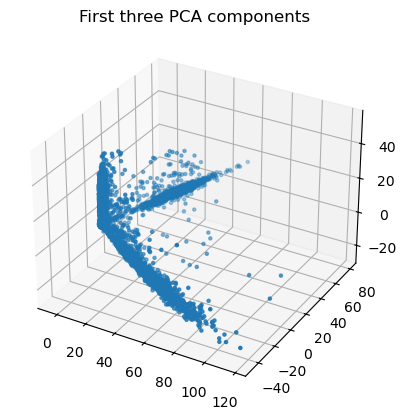

In [14]:
pca_index, arr_pca, status_df = dp.analyze_pca(arr = log_std_arr, #log_std_arr
                                               n_components=log_std_arr.shape[1], #log_std_arr.shape[1]
                                               optimize_n=True,
                                               plot_flag=1, 
                                               status_df=status_df)

In [36]:
arr_pca.shape

(60256, 26)

In [37]:
pca_index

26

In [38]:
status_df

,completion_status
cell_exclusion (l1),True
gene_exclusion (l1),True
get_top_cv_genes,True
log_and_standerdize,True
analyze_pca,True
get_perplexity,NaN
do_tsne,NaN
compute_eps,NaN
do_dbscan,NaN


In [39]:
'Apoe' in df.index

True

Create copy of meta data to use for Harmony

In [40]:
meta_data_df.shape

(27, 60256)

In [41]:
meta_data_df.index

Index(['Serial_Number', 'Date_Captured', 'Species', 'Transcriptome', 'Strain',
       'Project', 'Group', 'ChipID', 'SampleID', 'DonorID', 'Age',
       'Num_Pooled_Animals', 'Sex', 'Tissue', 'Cell_Conc', 'Target_Num_Cells',
       'PCR_Cycles', 'Comments', 'cDNA_Lib_Ok', 'ngperul_cDNA',
       'Avesizebp_cDNAlib', 'Date', 'cDNAul', 'LIbConstructionComment',
       'ngperul_seqlib', 'lengthbp_seqlib', 'Sample_Index'],
      dtype='object')

### Harmony Cell Integration <a name="harmony"></a> 

In [43]:
arr_pca.shape

(60256, 26)

In [44]:
meta_data_df_pca.shape

(60256, 27)

In [45]:
meta_data_df_pca.columns

Index(['Serial_Number', 'Date_Captured', 'Species', 'Transcriptome', 'Strain',
       'Project', 'Group', 'ChipID', 'SampleID', 'DonorID', 'Age',
       'Num_Pooled_Animals', 'Sex', 'Tissue', 'Cell_Conc', 'Target_Num_Cells',
       'PCR_Cycles', 'Comments', 'cDNA_Lib_Ok', 'ngperul_cDNA',
       'Avesizebp_cDNAlib', 'Date', 'cDNAul', 'LIbConstructionComment',
       'ngperul_seqlib', 'lengthbp_seqlib', 'Sample_Index'],
      dtype='object')

In [18]:
meta_data_df_pca = meta_data_df.T.copy()
vars_use = ['SampleID']
ho = hm.run_harmony(arr_pca,meta_data_df_pca,vars_use)

2025-04-11 17:09:06,342 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-04-11 17:09:10,447 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-04-11 17:09:10,829 - harmonypy - INFO - Iteration 1 of 10
2025-04-11 17:09:34,584 - harmonypy - INFO - Iteration 2 of 10
2025-04-11 17:09:56,347 - harmonypy - INFO - Iteration 3 of 10
2025-04-11 17:10:15,534 - harmonypy - INFO - Iteration 4 of 10
2025-04-11 17:10:35,543 - harmonypy - INFO - Iteration 5 of 10
2025-04-11 17:10:54,220 - harmonypy - INFO - Iteration 6 of 10
2025-04-11 17:11:12,352 - harmonypy - INFO - Iteration 7 of 10
2025-04-11 17:11:30,456 - harmonypy - INFO - Iteration 8 of 10
2025-04-11 17:11:48,645 - harmonypy - INFO - Iteration 9 of 10
2025-04-11 17:12:07,511 - harmonypy - INFO - Converged after 9 iterations


In [49]:
ho.Z_corr.T.shape

(60256, 26)

In [20]:
hm_arr = ho.Z_corr.T

### t-SNE <a name="tsne"></a> 

#### Computing Perplexity <a name="get_perplexity"></a> 

Amit's method for determining perplexity param - 
1) compute pairwise distance matrix (n_cells x n_cells) from PCA reduced matrix.
2) sort columns by ascending values
3) compute angle from first point to last point of column values from index 1-500
4) use rotation matrix to rotate column values by this angle
5) take argmax for each rotated set of column values and store in list
6) take median of list created in step 5, this is perplexity value



Updated 7 Apr 2024 - use harmonized array (hm_arr) instead of pca array (pca_arr) as input, perplexity param adjusted from 57 to 56

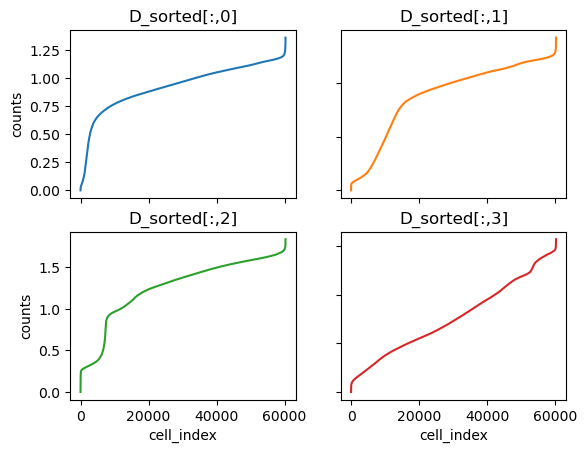

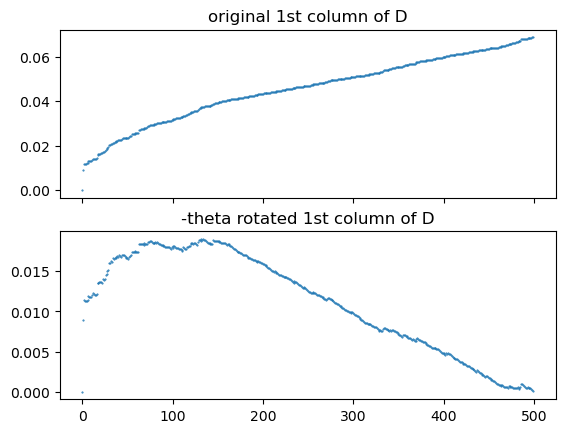

In [21]:
perplexity,status_df = dp.get_perplexity(pca_arr = hm_arr, cutoff=500, plot_flag=1, status_df = status_df)

In [52]:
perplexity

57.0

In [53]:
status_df

,completion_status
cell_exclusion (l1),True
gene_exclusion (l1),True
get_top_cv_genes,True
log_and_standerdize,True
analyze_pca,True
get_perplexity,True
do_tsne,NaN
compute_eps,NaN
do_dbscan,NaN


#### Visualize with t-SNE<a name="do_tsne"></a> 

In [54]:
arr_pca.shape

(60256, 26)

In [55]:
hm_arr.shape

(60256, 26)

Update 7 Apr 2024 - use harmonized array

Do TSNE on pca reduced, harmonized matrix using calculated perplexity. See https://www.nature.com/articles/s41467-019-13056-x for more details on parameter selection.

Note sklearn's learning rate is defined factor of 4 smaller than other implementations, see sklearn doc: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html

Create a t-SNE object

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 57.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


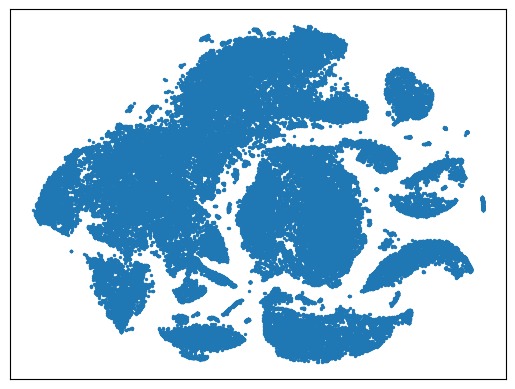

In [56]:
arr_tsne,status_df = dp.do_tsne(arr = hm_arr, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=50,
                               early_exaggeration=12,
                               init='pca', 
                               perplexity = perplexity,
                               status_df = status_df)

In [60]:
hm_arr.shape[0]//12

5021

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 5021
early_exaggeration: 20
init: pca
perplexity: 57.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


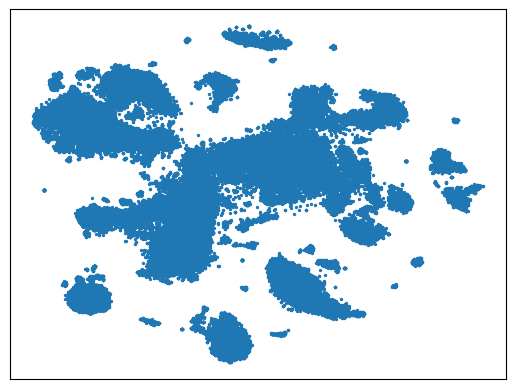

In [22]:
#use parameters from FC paper/art of tsne paper
arr_tsne,status_df = dp.do_tsne(arr = hm_arr, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=hm_arr.shape[0]//12,
                               early_exaggeration=20,
                               init='pca', 
                               perplexity = perplexity,
                               metric='correlation',
                               status_df = status_df)

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 57.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


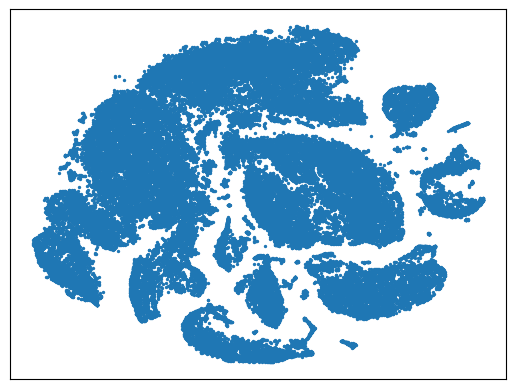

In [57]:
arr_tsne_no_hm,status_df = dp.do_tsne(arr = arr_pca, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=50,
                               early_exaggeration=12,
                               init='pca', 
                               perplexity = perplexity,
                               status_df = status_df)

In [58]:
arr_tsne.shape

(43492, 2)

In [59]:
status_df

,completion_status
cell_exclusion (l1),True
gene_exclusion (l1),True
get_top_cv_genes,True
log_and_standerdize,True
analyze_pca,True
get_perplexity,True
do_tsne,True
compute_eps,NaN
do_dbscan,NaN


#### Overlay tSNE with known marker genes <a name="tsne_marker"></a> 

As a sanity check, plot a positively expressed known marker gene on top of tSNE plot.
Known marker genes from: 
https://www.science.org/doi/full/10.1126/science.aaa1934)

gene in df?  True
gene index:  [2684]


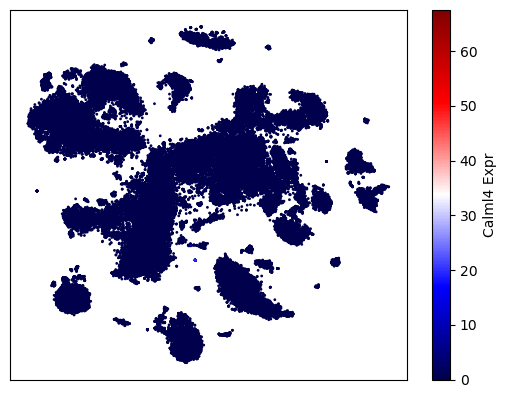

In [130]:
#check astrocyte marker Aldoc
gene = 'Calml4'
print('gene in df? ', gene in df_n.index)
print ('gene index: ', np.where(df_n.index == gene)[0])

x = arr_tsne[:, 0]
y = arr_tsne[:, 1]
z = np.array(df_n.loc[gene,:])

#visualise tsne
fig, ax = plt.subplots()
scatter = ax.scatter(x, y, c = z , cmap = 'seismic' , s = 1)

# Create colorbar
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label(gene + ' Expr')

plt.xticks([])
plt.yticks([])

plt.show()

gene in df?  True
gene index:  [28]


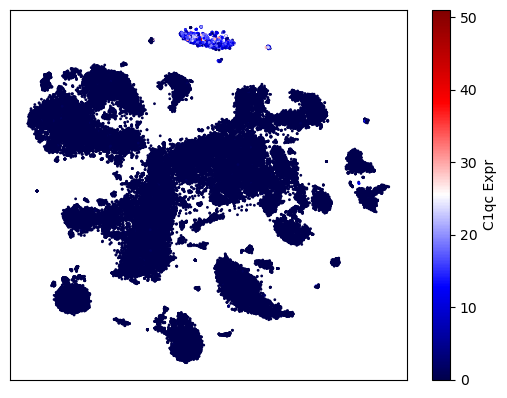

In [31]:
#check immune marker C1qc
gene = 'C1qc'
print('gene in df? ', gene in df.index)
print ('gene index: ', np.where(df.index == gene)[0])

x = arr_tsne[:, 0]
y = arr_tsne[:, 1]
z = np.array(df.loc[gene,:])

#visualise tsne
fig, ax = plt.subplots()
scatter = ax.scatter(x, y, c = z , cmap = 'seismic' , s = 1)

# Create colorbar
sm = ScalarMappable(cmap='seismic')
sm.set_array(z)
# Create colorbar
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label(gene + ' Expr')

plt.xticks([])
plt.yticks([])

plt.show()

gene in df?  True
gene index:  [130]


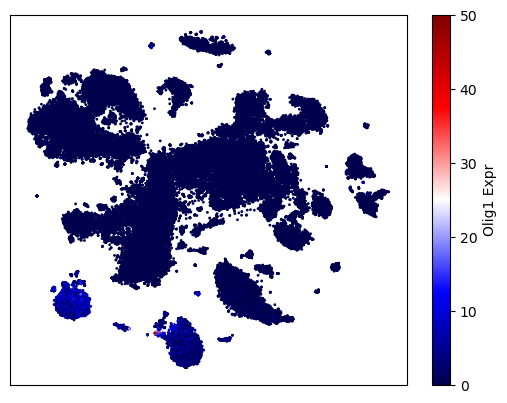

In [32]:
#check oligodendroctye marker Olig1
gene = 'Olig1'
print('gene in df? ', gene in df.index)
print ('gene index: ', np.where(df.index == gene)[0])

x = arr_tsne[:, 0]
y = arr_tsne[:, 1]
z = np.array(df.loc[gene,:])

#visualise tsne
fig, ax = plt.subplots()
scatter = ax.scatter(x, y, c = z , cmap = 'seismic' , s = 1)

# Create colorbar
sm = ScalarMappable(cmap='seismic')
sm.set_array(z)
# Create colorbar
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label(gene + ' Expr')

plt.xticks([])
plt.yticks([])

plt.show()

gene in df?  True
gene index:  [70]


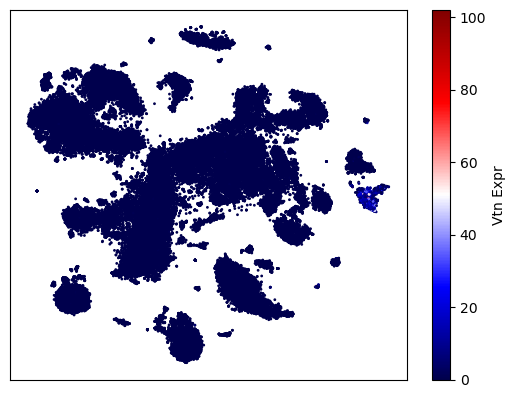

In [33]:
#check vascular marker Vtn
gene = 'Vtn'
print('gene in df? ', gene in df.index)
print ('gene index: ', np.where(df.index == gene)[0])

x = arr_tsne[:, 0]
y = arr_tsne[:, 1]
z = np.array(df.loc[gene,:])

#visualise tsne
fig, ax = plt.subplots()
scatter = ax.scatter(x, y, c = z , cmap = 'seismic' , s = 1)

# Create colorbar
sm = ScalarMappable(cmap='seismic')
sm.set_array(z)
# Create colorbar
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label(gene + ' Expr')

plt.xticks([])
plt.yticks([])

plt.show()

gene in df?  True
gene index:  [5888]


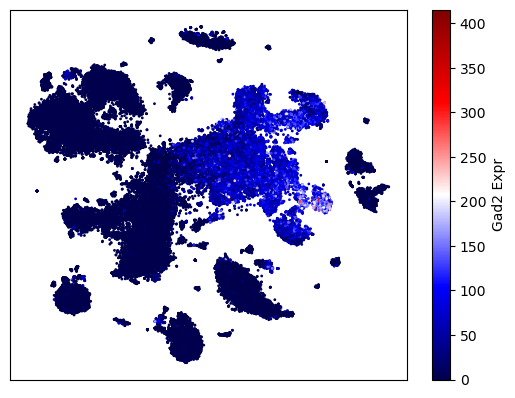

In [34]:
#check vascular marker Vtn
gene = 'Gad2'
print('gene in df? ', gene in df_n.index)
print ('gene index: ', np.where(df_n.index == gene)[0])

x = arr_tsne[:, 0]
y = arr_tsne[:, 1]
z = np.array(df_n.loc[gene,:])

#visualise tsne
fig, ax = plt.subplots()
scatter = ax.scatter(x, y, c = z , cmap = 'seismic' , s = 1)

# Create colorbar
sm = ScalarMappable(cmap='seismic')
sm.set_array(z)
# Create colorbar
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label(gene + ' Expr')

plt.xticks([])
plt.yticks([])

plt.show()

In [68]:
x

array([-23.22056  ,  22.03786  ,   3.4800775, ..., -18.810694 ,
       -29.739891 ,   1.0598068], dtype=float32)

In [69]:
status_df

,completion_status
cell_exclusion (l1),True
gene_exclusion (l1),True
get_top_cv_genes,True
log_and_standerdize,True
analyze_pca,True
get_perplexity,True
do_tsne,True
compute_eps,NaN
do_dbscan,NaN


## Clustering <a name="clustering"></a>

### DBSCAN <a name="dbscan"></a>

#### Computing Epsilon <a name="get_epsilon"></a> 

In [79]:
#epsilon, minpts, status_df = dp.compute_eps(minpts = 35, eps_prc=90, arr= arr_tsne, status_df = status_df)

Alternative method for finding epsilon- calculate avg distance between each point and its n_neighbors (equal to min_pts), plot, and select point of max curvature 

In [61]:
arr_tsne.shape

(60256, 2)

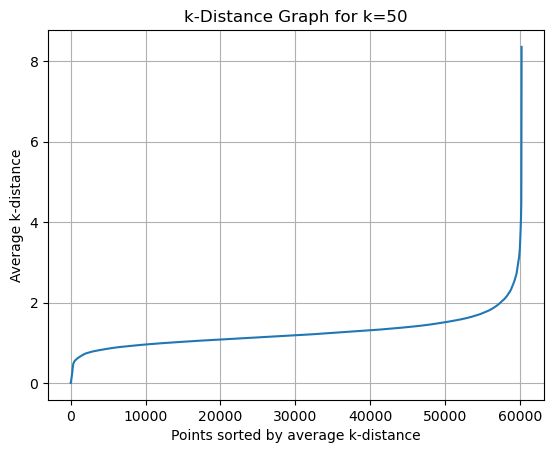

The knee is at x = 58294, y = 2.1610161226472764


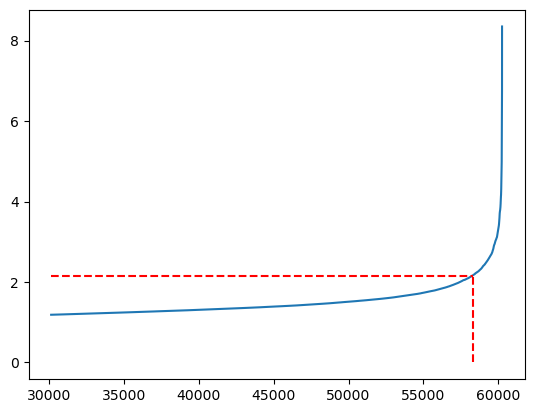

2.1610161226472764

In [35]:
min_pts = 50
eps = dp.optimal_eps(arr_tsne, min_pts)
eps

#### Visualize DBScan Clusters <a name="do_dbscan"></a> 

Use scikit-learn implementaton: https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html

Uncomment code below to perform dbscan clustering on range of minpts values: 10,15,20,25,30,35, with epsiolon computed for each. corresponding epsilon values for each

In [78]:
arr_tsne.shape

(43492, 2)

params for dbscan
minpts:  10
epsilon percentile 90
epsilon:  1.1297209753021509

running dbscan with epsilon: 1.1297209753021509  and minpts: 10
Estimated number of clusters: 131
Estimated number of noise points: 1618


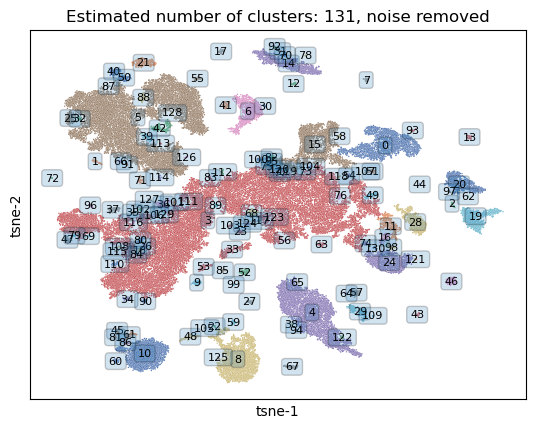

params for dbscan
minpts:  15
epsilon percentile 90
epsilon:  1.3723504970266167

running dbscan with epsilon: 1.3723504970266167  and minpts: 15
Estimated number of clusters: 91
Estimated number of noise points: 1552


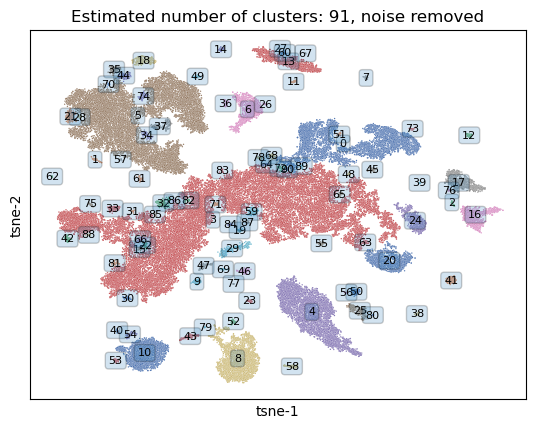

params for dbscan
minpts:  20
epsilon percentile 90
epsilon:  1.5814070964251439

running dbscan with epsilon: 1.5814070964251439  and minpts: 20
Estimated number of clusters: 74
Estimated number of noise points: 1510


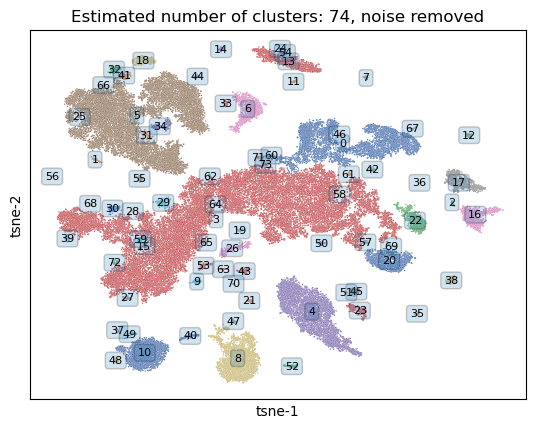

params for dbscan
minpts:  25
epsilon percentile 90
epsilon:  1.7661841481076082

running dbscan with epsilon: 1.7661841481076082  and minpts: 25
Estimated number of clusters: 62
Estimated number of noise points: 1419


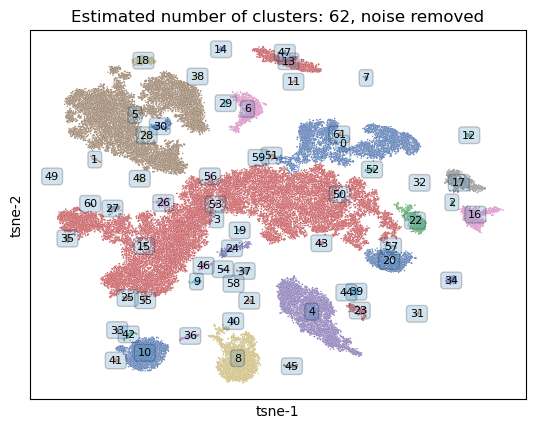

params for dbscan
minpts:  30
epsilon percentile 90
epsilon:  1.9324225670790154

running dbscan with epsilon: 1.9324225670790154  and minpts: 30
Estimated number of clusters: 52
Estimated number of noise points: 1435


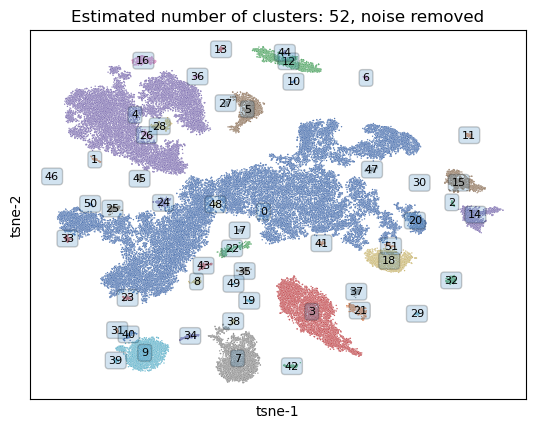

params for dbscan
minpts:  35
epsilon percentile 90
epsilon:  2.089244789359582

running dbscan with epsilon: 2.089244789359582  and minpts: 35
Estimated number of clusters: 52
Estimated number of noise points: 1303


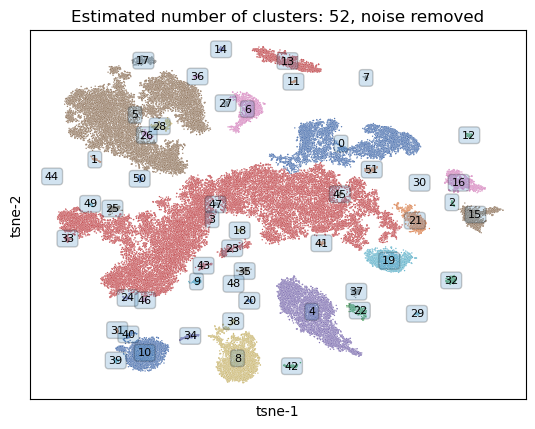

params for dbscan
minpts:  40
epsilon percentile 90
epsilon:  2.2342815765522674

running dbscan with epsilon: 2.2342815765522674  and minpts: 40
Estimated number of clusters: 48
Estimated number of noise points: 1247


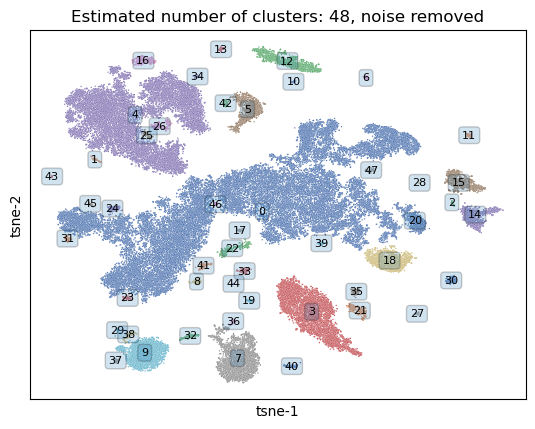

params for dbscan
minpts:  45
epsilon percentile 90
epsilon:  2.3852815003813594

running dbscan with epsilon: 2.3852815003813594  and minpts: 45
Estimated number of clusters: 40
Estimated number of noise points: 1292


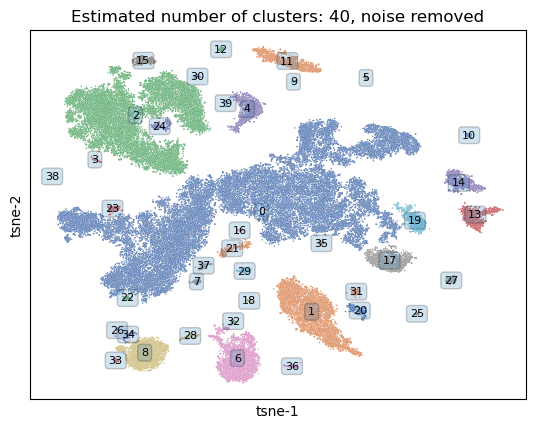

params for dbscan
minpts:  50
epsilon percentile 90
epsilon:  2.520384969800172

running dbscan with epsilon: 2.520384969800172  and minpts: 50
Estimated number of clusters: 35
Estimated number of noise points: 1348


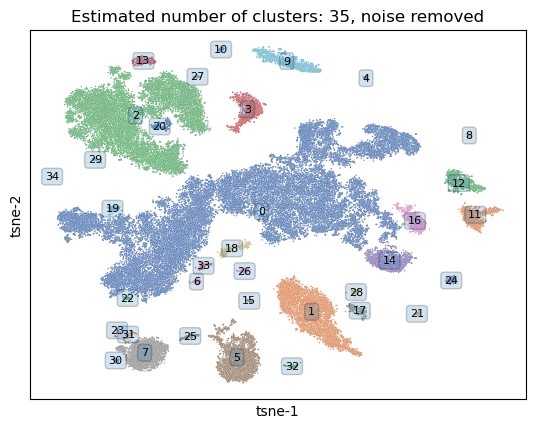

In [80]:
for m in range(10,55,5):
    epsilon, minpts, status_df = dp.compute_eps(minpts = m, eps_prc=90, arr= arr_tsne, status_df = status_df)
    labels,n_clusters, arr, status_df = dp.do_dbscan(epsilon = epsilon, minpts = minpts, arr = arr_tsne, status_df = status_df)

Based on close inspection of 4x4 marker grid plot, noticed Gad2 and Aqpb4,Gjg1 both expressed in different areas of same cluster (#7 with min pts = 35, eps_prc = 90) . To resolve this, we can break up cluster by dropping eps prc. After trying a few different eps prc,we use eps_prc = 70 as this seems to break up the cluster without creating excessive number of clusters. 

params for dbscan
minpts:  50
epsilon percentile 90
epsilon:  2.5321842195420707

running dbscan with epsilon: 2.5321842195420707  and minpts: 50
Estimated number of clusters: 37
Estimated number of noise points: 1348


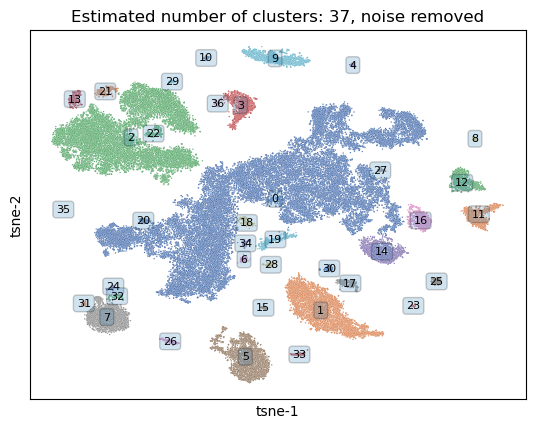

In [36]:
epsilon, minpts, status_df = dp.compute_eps(minpts = 50, eps_prc=90, arr= arr_tsne, status_df = status_df)
labels, n_clusters_, arr_df, status_df = dp.do_dbscan(epsilon = epsilon, minpts = minpts, arr = arr_tsne, status_df = status_df)

In [81]:
#numpy method to get cluster and pts per cluster
#c,p = np.unique(labels,return_counts=True)

View histogram showing number of pts per cluster

In [88]:
labels

array([ 0,  0,  1, ...,  0,  0, 25])

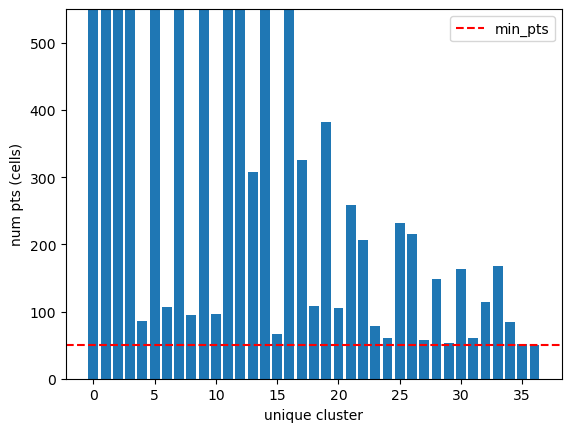

In [103]:
cluster_pts = dp.histogram_pts_per_cluster(labels, minpts=minpts)

In [104]:
cluster_pts

[(0, 27733),
 (1, 4400),
 (2, 10955),
 (3, 1242),
 (4, 86),
 (5, 2968),
 (6, 106),
 (7, 2092),
 (8, 95),
 (9, 1491),
 (10, 96),
 (11, 1058),
 (12, 1045),
 (13, 308),
 (14, 1407),
 (15, 66),
 (16, 838),
 (17, 326),
 (18, 108),
 (19, 382),
 (20, 105),
 (21, 259),
 (22, 207),
 (23, 78),
 (24, 61),
 (25, 231),
 (26, 216),
 (27, 57),
 (28, 149),
 (29, 53),
 (30, 164),
 (31, 60),
 (32, 114),
 (33, 167),
 (34, 84),
 (35, 51),
 (36, 50)]

In [ ]:
sorted(cluster_ptsa

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36]

Reshuffle gene expression matrix, meta data using cluster labels

In [83]:
#df_pre_linkage, meta_data_df, unique_labels = dp.sort_by_cluster_label(df,meta_data_df,arr_df,labels)

In [84]:
#df_pre_linkage.head()

In [85]:
#meta_data_df

In [87]:
arr_df.shape

(40241, 2)

In [107]:
df_ls.shape

(825, 60256)

In [87]:
#if 'cluster_label' in meta_data_df.index:
#    meta_data_df = meta_data_df.drop(['cluster_label'])

In [40]:
df_pre_linkage_ls, meta_data_df_pre_linkage, unique_labels = dp.sort_by_cluster_label(df_ls,meta_data_df,arr_df,labels)

In [41]:
today

'2025-04-11'

In [109]:
outfile_name = 'df_pre_linkage_ls_' + today
df_pre_linkage_ls.to_feather('/bigdata/isaac/'+outfile_name+'.feather')
outfile_name = 'meta_data_df_pre_linkage_' + today
meta_data_df_pre_linkage.to_json('/bigdata/isaac/'+outfile_name+'.json')

#df_pre_linkage_ls = pd.read_feather('/bigdata/isaac/df_pre_linkage.feather')
#meta_data_df_pre_linkage = pd.read_json('/bigdata/isaac/meta_data_df_pre_linkage_ls_2024-05-08.json')

In [110]:
df_pre_linkage_ls.head()

gene,Hbb-bs,Oxt,Avp,Plp1,Ptgds,Hba-a1,Hba-a2,Hbb-bt,Acta2,Apoe,...,Mgll,Cplx3,Clec12a,Ikzf1,Mir143hg,Brinp2,Npas1,Car14,Rac2,Prom1
ACACGCGAGGCTTAAA-1_10X51_4,-0.060159,-0.093178,-0.168002,0.177828,-0.291642,-0.034807,-0.044672,-0.027479,-0.087546,-0.545659,...,-0.555809,-0.141899,-0.035319,-0.10361,-0.089166,-0.770622,-0.15158,-0.182942,-0.090199,-0.1635
GAAATGAGTTGAGAGC-1_10X38_2,-0.060159,-0.093178,-0.168002,-0.417999,-0.291642,-0.034807,-0.044672,-0.027479,-0.087546,-0.545659,...,1.060691,-0.141899,-0.035319,-0.10361,-0.089166,0.887971,-0.15158,-0.182942,-0.090199,-0.1635
GAAATGACACTTCAGA-1_10X38_2,-0.060159,-0.093178,-0.168002,-0.417999,-0.291642,-0.034807,-0.044672,-0.027479,-0.087546,0.100374,...,1.060691,-0.141899,-0.035319,-0.10361,-0.089166,-0.770622,-0.15158,-0.182942,-0.090199,-0.1635
CTGTGAAAGCGCCTTG-1_10X38_2,-0.060159,-0.093178,-0.168002,-0.417999,-0.291642,-0.034807,-0.044672,-0.027479,-0.087546,-0.545659,...,-0.555809,-0.141899,-0.035319,-0.10361,-0.089166,1.322290,-0.15158,-0.182942,-0.090199,-0.1635
CTGTCGTTCTATCCAT-1_10X38_2,-0.060159,-0.093178,-0.168002,0.177828,-0.291642,-0.034807,-0.044672,-0.027479,-0.087546,0.100374,...,-0.555809,-0.141899,-0.035319,-0.10361,-0.089166,-0.770622,-0.15158,-0.182942,-0.090199,-0.1635


In [111]:
df_pre_linkage_ls.shape

(58908, 825)

In [112]:
meta_data_df_pre_linkage.head()

,ACACGCGAGGCTTAAA-1_10X51_4,GAAATGAGTTGAGAGC-1_10X38_2,GAAATGACACTTCAGA-1_10X38_2,CTGTGAAAGCGCCTTG-1_10X38_2,CTGTCGTTCTATCCAT-1_10X38_2,CTGTCGTTCGACACTA-1_10X38_2,CTGTCGTGTTATAGCC-1_10X38_2,CTGTCGTGTGGTGATG-1_10X38_2,CTTAGGAAGCCACTCG-1_10X38_2,CTTACCGGTACGACTT-1_10X38_2,...,CTCAAGAGTATCGTTG-1_10X52_4,TCATTGTTCGGTGAAG-1_10X52_2,GCAGCCATCTGGCCAG-1_10X51_2,GATAGAAAGGAGCAAA-1_10X35_1,GCCAGGTGTCCAGTTA-1_10X52_3,TAAGCCAGTAGTCTTG-1_10X37_2,AGGTTACTCCCTCTCC-1_10X51_1,ACCTACCTCTGTTGGA-1_10X51_1,GGGATCCTCTCAACCC-1_10X37_1,TTCCTCTAGCTCCGAC-1_10X51_2
Serial_Number,100.0,70.0,70.0,70.0,70.0,70.0,70.0,70.0,70.0,70.0,...,104.0,102.0,98.0,63.0,103.0,68.0,97.0,97.0,67.0,98.0
Date_Captured,05/31/20,2019-12-01,2019-12-01,2019-12-01,2019-12-01,2019-12-01,2019-12-01,2019-12-01,2019-12-01,2019-12-01,...,05/31/20,05/31/20,05/31/20,2019-11-20,05/31/20,2019-11-25,05/31/20,05/31/20,2019-11-25,05/31/20
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,C57Bl/6,,,,,,,,,,...,C57Bl/6,C57Bl/6,C57Bl/6,,C57Bl/6,,C57Bl/6,C57Bl/6,,C57Bl/6


In [113]:
meta_data_df_pre_linkage.shape

(28, 58908)

In [114]:
df_pre_linkage_ls.index

Index(['ACACGCGAGGCTTAAA-1_10X51_4', 'GAAATGAGTTGAGAGC-1_10X38_2',
       'GAAATGACACTTCAGA-1_10X38_2', 'CTGTGAAAGCGCCTTG-1_10X38_2',
       'CTGTCGTTCTATCCAT-1_10X38_2', 'CTGTCGTTCGACACTA-1_10X38_2',
       'CTGTCGTGTTATAGCC-1_10X38_2', 'CTGTCGTGTGGTGATG-1_10X38_2',
       'CTTAGGAAGCCACTCG-1_10X38_2', 'CTTACCGGTACGACTT-1_10X38_2',
       ...
       'CTCAAGAGTATCGTTG-1_10X52_4', 'TCATTGTTCGGTGAAG-1_10X52_2',
       'GCAGCCATCTGGCCAG-1_10X51_2', 'GATAGAAAGGAGCAAA-1_10X35_1',
       'GCCAGGTGTCCAGTTA-1_10X52_3', 'TAAGCCAGTAGTCTTG-1_10X37_2',
       'AGGTTACTCCCTCTCC-1_10X51_1', 'ACCTACCTCTGTTGGA-1_10X51_1',
       'GGGATCCTCTCAACCC-1_10X37_1', 'TTCCTCTAGCTCCGAC-1_10X51_2'],
      dtype='object', length=58908)

## Sorting <a name="cluster_sort"></a>

### Inter Cluster sorting <a name="inter_cluster_sort"></a>

Inter cluster Order determined as follows:
1) compute mean per gene per cluster(n_genes x n_clusters)
2) PCA reduce genes to n_components (10)
3) Compute distance matrix on PCA reduced array using 'correlation' as distance metric
4) Compute linkage on distance matrix using 'ward' linkage alg to determine cluster order

In [42]:
linkage_alg = 'ward'
dist_metric = 'euclidean'

In [119]:
unique_labels

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38])

In [45]:
df_pre_linkage_ls = df_pre_linkage_ls.T
df_pre_linkage_ls.head()

,TTGTTGTTCTCGTTTA-1_10X37_2,AAAGGGCAGCAGATAT-1_10X51_2,AAAGGGCAGGTAAAGG-1_10X51_2,AAAGGGCCAAAGAGTT-1_10X51_2,AAAGGGCGTCTTCGAA-1_10X51_2,AAAGGTACACAGAGCA-1_10X51_2,AAAGAACCAGTAGATA-1_10X51_2,AAAGAACGTGGATGAC-1_10X51_2,CATGCTCTCTGGTTGA-1_10X52_4,CATGGATAGCGACAGT-1_10X52_4,...,CTAACCCAGGTGGTTG-1_10X38_1,TGTAACGAGATTAGTG-1_10X52_1,TATCGCCCATCGATGT-1_10X38_1,CATCCACCAGACAAGC-1_10X52_2,TCATCATGTGACTCTA-1_10X52_1,AGGTGTTTCTCAGAAC-1_10X36_1,ATCGGCGTCACCCTTG-1_10X52_1,TAGACTGGTCAGTCTA-1_10X37_2,ATGGAGGTCATCACAG-1_10X52_2,CCTCAACCACGACGTC-1_10X52_1
gene,,,,,,,,,,,,,,,,,,,,,
Hbb-bs,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,...,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159
Oxt,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,...,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,6.641863,-0.093178,-0.093178,-0.093178
Avp,-0.168002,-0.168002,2.096820,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,...,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002
Plp1,-0.417999,-0.417999,-0.417999,-0.417999,-0.417999,0.177828,-0.417999,-0.417999,0.177828,0.177828,...,-0.417999,0.177828,-0.417999,0.177828,-0.417999,0.177828,0.177828,-0.417999,-0.417999,-0.417999
Ptgds,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,0.486988,-0.291642,-0.291642,-0.291642,-0.291642,...,-0.291642,-0.291642,-0.291642,0.486988,-0.291642,0.942457,-0.291642,-0.291642,-0.291642,-0.291642


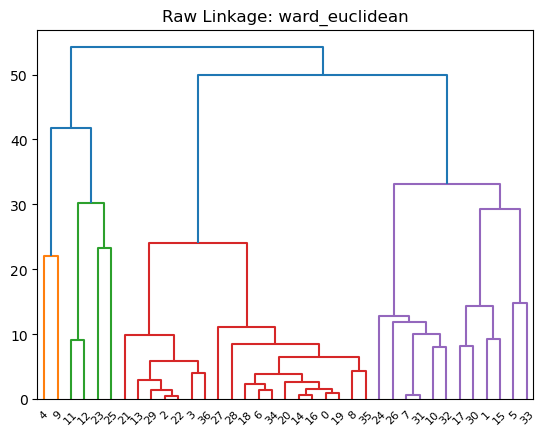

[ 9  4 25 23 12 11 27 35  8 18  6 34 19  0 16 14 20 28 29  2 22 13  3 36
 21 24 32 10  7 31 26  5 33 15  1 17 30]


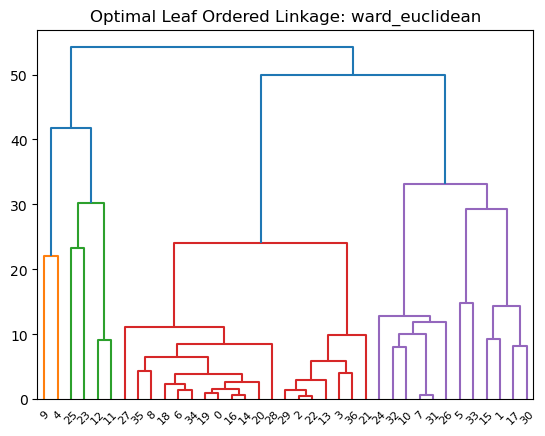

metadata df shape post inter cluster sort
(28, 58908)


In [46]:
df_post_linkage, meta_data_df_post_linkage, linkage_cluster_order, Z_ordered, mpg_pca, linkage_cluster_order_po = dp.inter_cluster_sort(df_pre_linkage_ls,
                                                 meta_data_df_pre_linkage, 
                                                 unique_labels,
                                                 n_components = 10, 
                                                 linkage_alg = linkage_alg,
                                                 dist_metric = dist_metric)

In [47]:
#linkage_cluster_order_po

In [48]:
linkage_cluster_order

array([ 9,  4, 25, 23, 12, 11, 27, 35,  8, 18,  6, 34, 19,  0, 16, 14, 20,
       28, 29,  2, 22, 13,  3, 36, 21, 24, 32, 10,  7, 31, 26,  5, 33, 15,
        1, 17, 30], dtype=int32)

In [49]:
df_post_linkage.head()

,TACTGCCTCGACGTCG-1_10X52_3,TTACAGGAGCGTTCAT-1_10X38_1,TTGGGTACACCAAATC-1_10X36_1,GTATTGGTCCTGTAAG-1_10X52_3,TTTCAGTCAGACAAGC-1_10X36_1,TTTAGTCGTGCATTTG-1_10X36_1,TTATTGCTCCTCGATC-1_10X38_1,GCTTTCGAGTTTGCTG-1_10X36_1,CTCCATGTCACCTGTC-1_10X51_2,GACTATGAGACGGATC-1_10X37_2,...,TTGAGTGCATTGAAAG-1_10X35_1,TTCGATTTCGAACCAT-1_10X38_2,CGAAGTTGTCGTTTCC-1_10X52_4,GAACGTTTCGACGACC-1_10X38_2,TCGACGGCAGATACTC-1_10X37_1,ATCTCTAGTCGCCACA-1_10X51_1,GGGTGAATCAATGCAC-1_10X52_4,CAACGGCAGCTGTGCC-1_10X52_4,TTCACCGCAGGCGAAT-1_10X36_1,CCACGAGGTTGGCCTG-1_10X37_2
gene,,,,,,,,,,,,,,,,,,,,,
Hbb-bs,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,...,-0.060159,-0.060159,-0.060159,-0.060159,3.597462,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159
Oxt,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,...,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178
Avp,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,2.096820,-0.168002,...,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002
Plp1,0.177828,-0.417999,-0.417999,-0.417999,0.177828,-0.417999,-0.417999,-0.417999,0.177828,-0.417999,...,-0.417999,-0.417999,0.177828,-0.417999,-0.417999,-0.417999,-0.417999,-0.417999,0.526365,-0.417999
Ptgds,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,...,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,0.486988,-0.291642,-0.291642


In [50]:
meta_data_df_post_linkage.tail()

,TACTGCCTCGACGTCG-1_10X52_3,TTACAGGAGCGTTCAT-1_10X38_1,TTGGGTACACCAAATC-1_10X36_1,GTATTGGTCCTGTAAG-1_10X52_3,TTTCAGTCAGACAAGC-1_10X36_1,TTTAGTCGTGCATTTG-1_10X36_1,TTATTGCTCCTCGATC-1_10X38_1,GCTTTCGAGTTTGCTG-1_10X36_1,CTCCATGTCACCTGTC-1_10X51_2,GACTATGAGACGGATC-1_10X37_2,...,TTGAGTGCATTGAAAG-1_10X35_1,TTCGATTTCGAACCAT-1_10X38_2,CGAAGTTGTCGTTTCC-1_10X52_4,GAACGTTTCGACGACC-1_10X38_2,TCGACGGCAGATACTC-1_10X37_1,ATCTCTAGTCGCCACA-1_10X51_1,GGGTGAATCAATGCAC-1_10X52_4,CAACGGCAGCTGTGCC-1_10X52_4,TTCACCGCAGGCGAAT-1_10X36_1,CCACGAGGTTGGCCTG-1_10X37_2
LIbConstructionComment,,,,,,,,,,,...,,,,,,,,,,
ngperul_seqlib,20.4(second prep),15.0,11.4,20.4(second prep),11.4,11.4,15.0,11.4,22.2,16.0,...,13.6,18.7,8.94 (second prep),18.7,15.9,19.2,8.94 (second prep),8.94 (second prep),11.4,16.0
lengthbp_seqlib,507.0,420.0,476.0,507.0,476.0,476.0,420.0,476.0,474.0,460.0,...,416.0,415.0,535.0,415.0,440.0,478.0,535.0,535.0,476.0,460.0
Sample_Index,F12,B9,H8,F12,H8,H8,B9,H8,A2,F9,...,D9,C9,G12,C9,E9,G1,G12,G12,H8,F9
cluster_label,9,9,9,9,9,9,9,9,9,9,...,30,30,30,30,30,30,30,30,30,30


verify cluster labels in metadata match linkage_cluster_order

In [51]:
l, idx = np.unique(np.array(meta_data_df_post_linkage.loc['cluster_label',:]), return_index=True)
l_ordered = l[np.argsort(idx)]
l_ordered

array([9, 4, 25, 23, 12, 11, 27, 35, 8, 18, 6, 34, 19, 0, 16, 14, 20, 28,
       29, 2, 22, 13, 3, 36, 21, 24, 32, 10, 7, 31, 26, 5, 33, 15, 1, 17,
       30], dtype=object)

In [52]:
df_post_linkage.shape

(825, 58908)

Compare Correlation matrix of mean per gene per cluster before/after inter cluster sort

In [53]:
mpg_pca_df = pd.DataFrame(data = mpg_pca)

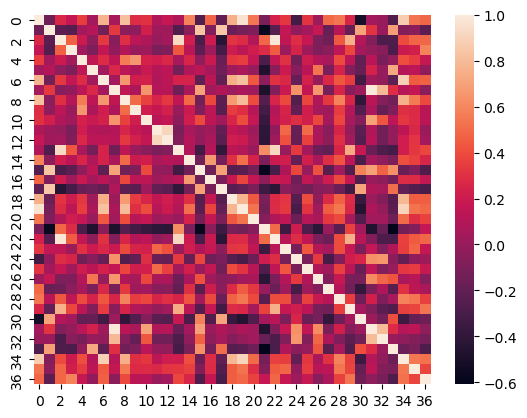

In [54]:
plt.figure()
ax = sns.heatmap(mpg_pca_df.corr(method='pearson'))
plt.show()

After inter cluster sort (use columns = linkage_cluster_order for optimized leaf order, columns = linkage_cluster_order_po for pre-optimized leaf order)

In [55]:
mpg_pca_pl_df = mpg_pca_df.reindex(columns = linkage_cluster_order)

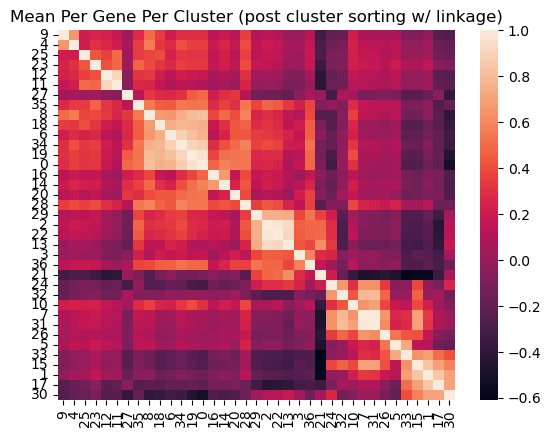

In [56]:
plt.figure()
ax = sns.heatmap(mpg_pca_pl_df.corr(method='pearson'), yticklabels=True, xticklabels=True)
plt.title('Mean Per Gene Per Cluster (post cluster sorting w/ linkage)')
#plt.savefig('mpg_pca_corr_post_linkage')
plt.show()

In [57]:
df_pre_linkage_ls.head()

,TTGTTGTTCTCGTTTA-1_10X37_2,AAAGGGCAGCAGATAT-1_10X51_2,AAAGGGCAGGTAAAGG-1_10X51_2,AAAGGGCCAAAGAGTT-1_10X51_2,AAAGGGCGTCTTCGAA-1_10X51_2,AAAGGTACACAGAGCA-1_10X51_2,AAAGAACCAGTAGATA-1_10X51_2,AAAGAACGTGGATGAC-1_10X51_2,CATGCTCTCTGGTTGA-1_10X52_4,CATGGATAGCGACAGT-1_10X52_4,...,CTAACCCAGGTGGTTG-1_10X38_1,TGTAACGAGATTAGTG-1_10X52_1,TATCGCCCATCGATGT-1_10X38_1,CATCCACCAGACAAGC-1_10X52_2,TCATCATGTGACTCTA-1_10X52_1,AGGTGTTTCTCAGAAC-1_10X36_1,ATCGGCGTCACCCTTG-1_10X52_1,TAGACTGGTCAGTCTA-1_10X37_2,ATGGAGGTCATCACAG-1_10X52_2,CCTCAACCACGACGTC-1_10X52_1
gene,,,,,,,,,,,,,,,,,,,,,
Hbb-bs,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,...,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159
Oxt,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,...,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,6.641863,-0.093178,-0.093178,-0.093178
Avp,-0.168002,-0.168002,2.096820,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,...,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002
Plp1,-0.417999,-0.417999,-0.417999,-0.417999,-0.417999,0.177828,-0.417999,-0.417999,0.177828,0.177828,...,-0.417999,0.177828,-0.417999,0.177828,-0.417999,0.177828,0.177828,-0.417999,-0.417999,-0.417999
Ptgds,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,0.486988,-0.291642,-0.291642,-0.291642,-0.291642,...,-0.291642,-0.291642,-0.291642,0.486988,-0.291642,0.942457,-0.291642,-0.291642,-0.291642,-0.291642


In [58]:
df_post_linkage.head()

,TACTGCCTCGACGTCG-1_10X52_3,TTACAGGAGCGTTCAT-1_10X38_1,TTGGGTACACCAAATC-1_10X36_1,GTATTGGTCCTGTAAG-1_10X52_3,TTTCAGTCAGACAAGC-1_10X36_1,TTTAGTCGTGCATTTG-1_10X36_1,TTATTGCTCCTCGATC-1_10X38_1,GCTTTCGAGTTTGCTG-1_10X36_1,CTCCATGTCACCTGTC-1_10X51_2,GACTATGAGACGGATC-1_10X37_2,...,TTGAGTGCATTGAAAG-1_10X35_1,TTCGATTTCGAACCAT-1_10X38_2,CGAAGTTGTCGTTTCC-1_10X52_4,GAACGTTTCGACGACC-1_10X38_2,TCGACGGCAGATACTC-1_10X37_1,ATCTCTAGTCGCCACA-1_10X51_1,GGGTGAATCAATGCAC-1_10X52_4,CAACGGCAGCTGTGCC-1_10X52_4,TTCACCGCAGGCGAAT-1_10X36_1,CCACGAGGTTGGCCTG-1_10X37_2
gene,,,,,,,,,,,,,,,,,,,,,
Hbb-bs,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159,...,-0.060159,-0.060159,-0.060159,-0.060159,3.597462,-0.060159,-0.060159,-0.060159,-0.060159,-0.060159
Oxt,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,...,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178,-0.093178
Avp,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,2.096820,-0.168002,...,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002,-0.168002
Plp1,0.177828,-0.417999,-0.417999,-0.417999,0.177828,-0.417999,-0.417999,-0.417999,0.177828,-0.417999,...,-0.417999,-0.417999,0.177828,-0.417999,-0.417999,-0.417999,-0.417999,-0.417999,0.526365,-0.417999
Ptgds,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,...,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,-0.291642,0.486988,-0.291642,-0.291642


Use linkage order determined from inter cluster sorting with _ls (log and standerdized) input to reshuffle df, and use this going forward

In [59]:
df_s = df.reindex(columns = df_post_linkage.columns)

In [60]:
df_s

,TACTGCCTCGACGTCG-1_10X52_3,TTACAGGAGCGTTCAT-1_10X38_1,TTGGGTACACCAAATC-1_10X36_1,GTATTGGTCCTGTAAG-1_10X52_3,TTTCAGTCAGACAAGC-1_10X36_1,TTTAGTCGTGCATTTG-1_10X36_1,TTATTGCTCCTCGATC-1_10X38_1,GCTTTCGAGTTTGCTG-1_10X36_1,CTCCATGTCACCTGTC-1_10X51_2,GACTATGAGACGGATC-1_10X37_2,...,TTGAGTGCATTGAAAG-1_10X35_1,TTCGATTTCGAACCAT-1_10X38_2,CGAAGTTGTCGTTTCC-1_10X52_4,GAACGTTTCGACGACC-1_10X38_2,TCGACGGCAGATACTC-1_10X37_1,ATCTCTAGTCGCCACA-1_10X51_1,GGGTGAATCAATGCAC-1_10X52_4,CAACGGCAGCTGTGCC-1_10X52_4,TTCACCGCAGGCGAAT-1_10X36_1,CCACGAGGTTGGCCTG-1_10X37_2
gene,,,,,,,,,,,,,,,,,,,,,
Hbb-bs,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
Oxt,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Avp,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
Plp1,1,0,0,0,1,0,0,0,1,0,...,0,0,1,0,0,0,0,0,2,0
Ptgds,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Brinp2,0,0,0,0,0,0,0,0,1,0,...,2,2,11,0,7,2,5,0,1,3
Npas1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Car14,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Intra Cluster sorting <a name="intra_cluster_sort"></a>

Intra cluster sorting  - For every unique cluster, perform 1D tsne, then use ascending TSNE values reshuffle within cluster.
Note - after rerunning with harmony and n_clusters = 26, changed perplexity to 15 from 30 (was getting perplexity must be less than n_samples error)

In [61]:
df_post_linkage_intra_sorted, meta_data_df_post_linkage_intra_sorted, cluster_indices = dp.intra_cluster_sort(df_s, meta_data_df_post_linkage, linkage_cluster_order)

In [62]:
df_post_linkage_intra_sorted.head()

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,CACGGGTGTGCTATTG-1_10X52_3,TCACATTTCGAATGCT-1_10X36_2,AGAAGCGCATATACCG-1_10X51_3,CGCGTGAGTTACTCAG-1_10X36_2,ATCCTATGTGTGAGCA-1_10X37_2,ACTTCCGGTGTTACAC-1_10X35_1,GACCCAGTCCCTATTA-1_10X52_1,...,GATAGCTAGGTTCACT-1_10X38_2,TTGGGATTCGTTCCTG-1_10X38_1,CTTGAGAGTGGCTACC-1_10X51_1,TACTTCAAGCAATTAG-1_10X38_1,GCAGCCACACACAGCC-1_10X51_2,TCGAACAAGGAGCTGT-1_10X52_1,TCTAACTAGGGTATAT-1_10X52_2,TTCGCTGGTACTGACT-1_10X37_2,CCCGGAATCGTAGGGA-1_10X51_2,CCACACTTCGTCTACC-1_10X37_2
gene,,,,,,,,,,,,,,,,,,,,,
Hbb-bs,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
Oxt,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Avp,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Plp1,0,0,0,0,0,0,2,1,0,1,...,0,0,2,0,1,2,2,0,1,0
Ptgds,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [63]:
meta_data_df_post_linkage_intra_sorted.tail()

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,CACGGGTGTGCTATTG-1_10X52_3,TCACATTTCGAATGCT-1_10X36_2,AGAAGCGCATATACCG-1_10X51_3,CGCGTGAGTTACTCAG-1_10X36_2,ATCCTATGTGTGAGCA-1_10X37_2,ACTTCCGGTGTTACAC-1_10X35_1,GACCCAGTCCCTATTA-1_10X52_1,...,GATAGCTAGGTTCACT-1_10X38_2,TTGGGATTCGTTCCTG-1_10X38_1,CTTGAGAGTGGCTACC-1_10X51_1,TACTTCAAGCAATTAG-1_10X38_1,GCAGCCACACACAGCC-1_10X51_2,TCGAACAAGGAGCTGT-1_10X52_1,TCTAACTAGGGTATAT-1_10X52_2,TTCGCTGGTACTGACT-1_10X37_2,CCCGGAATCGTAGGGA-1_10X51_2,CCACACTTCGTCTACC-1_10X37_2
LIbConstructionComment,,,,,,,,,,,...,,,,,,,,,,
ngperul_seqlib,16.0,16.0,16.0,20.4(second prep),12.1,22.0,12.1,16.0,13.6,15.7,...,18.7,15.0,19.2,15.0,22.2,15.7,17.5,16.0,22.2,16.0
lengthbp_seqlib,460.0,460.0,460.0,507.0,486.0,487.0,486.0,460.0,416.0,466.0,...,415.0,420.0,478.0,420.0,474.0,466.0,440.0,460.0,474.0,460.0
Sample_Index,F9,F9,F9,F12,A9,B2,A9,F9,D9,D12,...,C9,B9,G1,B9,A2,D12,E12,F9,A2,F9
cluster_label,9,9,9,9,9,9,9,9,9,9,...,30,30,30,30,30,30,30,30,30,30


Verify cluster_label in meta data are still in same order (inter cluster order remains the same)

In [64]:
l, idx = np.unique(np.array(meta_data_df_post_linkage_intra_sorted.loc['cluster_label',:]), return_index=True)
l_ordered = l[np.argsort(idx)]
l_ordered

array([9, 4, 25, 23, 12, 11, 27, 35, 8, 18, 6, 34, 19, 0, 16, 14, 20, 28,
       29, 2, 22, 13, 3, 36, 21, 24, 32, 10, 7, 31, 26, 5, 33, 15, 1, 17,
       30], dtype=object)

In [65]:
df_post_linkage_intra_sorted.shape

(825, 58908)

## Marker Genes<a name="markergenes"></a>

In [66]:
unique_labels

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36])

In [67]:
for c, idx in zip(linkage_cluster_order,cluster_indices):
    print (f'cluster {c}, num_cells {len(idx)}')

cluster 9, num_cells 1491
cluster 4, num_cells 86
cluster 25, num_cells 231
cluster 23, num_cells 78
cluster 12, num_cells 1045
cluster 11, num_cells 1058
cluster 27, num_cells 57
cluster 35, num_cells 51
cluster 8, num_cells 95
cluster 18, num_cells 108
cluster 6, num_cells 106
cluster 34, num_cells 84
cluster 19, num_cells 382
cluster 0, num_cells 27733
cluster 16, num_cells 838
cluster 14, num_cells 1407
cluster 20, num_cells 105
cluster 28, num_cells 149
cluster 29, num_cells 53
cluster 2, num_cells 10955
cluster 22, num_cells 207
cluster 13, num_cells 308
cluster 3, num_cells 1242
cluster 36, num_cells 50
cluster 21, num_cells 259
cluster 24, num_cells 61
cluster 32, num_cells 114
cluster 10, num_cells 96
cluster 7, num_cells 2092
cluster 31, num_cells 60
cluster 26, num_cells 216
cluster 5, num_cells 2968
cluster 33, num_cells 167
cluster 15, num_cells 66
cluster 1, num_cells 4400
cluster 17, num_cells 326
cluster 30, num_cells 164


### Compute Markers <a name="compute_marker_genes"></a>

In [68]:
marker_genes_sorted, pos, ind, ind_s, mgs = dp.compute_marker_genes(df_post_linkage_intra_sorted,
                                                meta_data_df_post_linkage_intra_sorted,
                                                cluster_indices,
                                                linkage_cluster_order,
                                                '/bigdata/isaac/',
                                                n_markers=5,
                                                class_score_name='NN_level1')

len marker_Genes_sorted 187
len marker_genes_sorted_final 187


In [69]:
ind

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  2,  2,  2,  2,  2,  2,  3,  3,  3,  3,  3,  3,  3,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  6,  6,
        6,  3,  6,  6,  7,  7,  7,  7,  7,  8,  8,  8,  8,  1,  2,  9,  5,
        2,  2,  0, 10, 10, 16, 24, 23,  1, 21, 16, 27, 24,  6, 24, 24,  6,
        6,  6, 24, 14,  6, 14, 14, 14, 17, 14, 14, 15, 15, 15, 15, 15, 15,
       16, 17,  0, 16, 16, 17, 17, 17, 18, 23, 18, 18, 18, 24, 21, 21, 22,
        7, 24, 24, 24, 21, 22, 22, 22, 22, 22, 23, 23, 23, 29, 29, 29, 30,
       28, 30, 28, 29, 28, 27, 27, 27, 27, 27, 29, 30, 29, 30, 30, 30, 31,
       31, 31, 31, 31, 31, 31, 32, 31, 30, 31, 31, 31, 33, 33, 34, 34, 34,
       34, 34, 34, 34, 34, 32, 34, 34,  3, 32, 34, 34, 34, 34, 34, 33, 34])

In [70]:
ind_s

array([  0,   1,   2,   4,   7,  10,   9,   8,   3,   6,   5, 104,  70,
        76,  14,  19,  64,  11,  13,  12,  15,  18,  16,  17,  24,  25,
        65,  69,  20,  21,  22,  23,  68,  30,  31,  28,  27,  26,  29,
        52, 178,  32,  37,  38,  35,  34,  33,  36,  47,  46,  45,  44,
        43,  42,  41,  40,  39,  67,  48,  53,  54,  51,  81,  85,  86,
        84,  89,  50,  49,  55,  57, 119,  58,  56,  59,  62,  61,  60,
        63,  66,  71,  72,  92,  91,  90,  88,  95,  94, 100,  99, 101,
        98,  97,  96, 106,  73, 105, 102,  78, 103, 109, 107,  93, 108,
       114, 110, 112, 113, 117,  77, 123, 116, 125, 128, 127, 126, 124,
       118, 131, 130, 129,  75, 111, 122, 121,  87,  83, 120, 115,  74,
        82,  80, 142, 145, 141,  79, 143, 144, 136, 140, 138, 139, 134,
       146, 148, 133, 132, 135, 161, 151, 150, 147, 137, 149, 152, 163,
       164, 160, 162, 154, 155, 156, 153, 157, 158, 175, 159, 179, 165,
       185, 166, 180, 181, 186, 184, 183, 182, 169, 168, 170, 16

In [146]:
mgs

array(['Bcl2a1b', 'Ccl4', 'Tmem119', 'Rgs1', 'Siglech', 'Cx3cr1', 'Ctss',
       'Trem2', 'P2ry12', 'C1qb', 'C1qa', 'Cd209g', 'Clec4n', 'Ccl8',
       'Cd209f', 'Ms4a7', 'Mrc1', 'Pf4', 'Wfdc17', 'Clec10a', 'Tagln',
       'Acta2', 'Pln', 'Cnn1', 'Myh11', 'Tpm2', 'Slc22a6', 'Itih2',
       'Slc13a4', 'Fam180a', 'Slc6a13', 'Aldh1a2', 'Ctla2a', 'Hmcn1',
       'Slco1a4', 'Cldn5', 'Cd93', 'Ly6c1', 'Ly6a', 'Flt1', 'Kcnj8',
       'Abcc9', 'Vtn', 'Higd1b', 'Ifitm1', 'Ndufa4l2', 'Rgs5', 'Atp13a5',
       'Ndnf', 'Reln', 'Igf1', 'Ifi27l2a', 'Erbb4', 'Gad2', 'Gad1',
       'Cplx3', 'Hapln1', 'Kit', 'Lamp5', 'Vip', 'Htr3a', 'Tac2', 'Npas1',
       'Adra1b', 'Cnr1', 'Rgs12', 'Sst', 'Bmp4', 'Satb1', 'Pnoc',
       'Mpped1', 'Nxph1', 'Fosb', 'Fos', 'Btg2', 'Junb', 'Gm13889',
       'Fmod', 'Avp', 'Ebf1', 'Slc17a6', 'F13a1', 'Penk', 'Myh7', 'Nos1',
       'Ntng1', 'H2-Eb1', 'Otp', 'Tcf7l2', 'Lhx1', 'Lcp1', 'Meis2',
       'Cartpt', 'Tac1', 'Foxp2', 'Prlr', 'Tshz2', 'Slc32a1', 'Htr2c',
       'Pam', 

In [147]:
len(ind_s)

190

In [148]:
indy = np.sort(ind)

In [149]:
indy

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  2,  2,  2,  2,  2,  2,  2,  2,  2,  3,
        3,  3,  3,  3,  3,  3,  3,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  6,  6,  6,  6,  6,  7,  7,  7,  7,
        7,  7,  7,  7,  7,  8,  8,  8,  8,  8,  8,  8,  9,  9,  9, 11, 13,
       14, 14, 14, 14, 14, 17, 17, 17, 17, 17, 18, 18, 18, 18, 19, 19, 19,
       19, 19, 19, 20, 20, 20, 20, 20, 21, 21, 21, 21, 21, 21, 24, 24, 24,
       24, 25, 25, 25, 25, 26, 26, 26, 26, 26, 26, 26, 26, 26, 28, 28, 28,
       28, 28, 28, 29, 30, 30, 30, 30, 30, 30, 31, 31, 31, 32, 32, 32, 32,
       32, 32, 32, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 34, 34,
       35, 35, 35, 35, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36,
       36, 36, 36])

In [150]:
indy = np.sort(ind)

#get gene indices
g = []
for i in np.arange(0,len(np.unique(ind))):
    #print(i)
    x = ind_s[np.where(indy==i)]
    g.append(x)

#use full marker gene list to convert list of indices to gene names
tg = []
for i in g:
    gene = [mgs[x] for x in i]
    #print(gene)
    tg.append(gene)

In [71]:
tg, tgfs = dp.get_heatmap_labels(mgs, ind, ind_s)

[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 14, 15, 16, 17, 18, 21, 22, 23, 24, 27, 28, 29, 30, 31, 32, 33, 34]
27
[array([  0,   1,   2,   4,   7,  10,   9,   8,   3,   6,   5, 104,  70]), array([76, 14, 19, 64, 11, 13, 12, 15, 18, 16, 17]), array([24, 25, 65, 69, 20, 21, 22, 23, 68]), array([ 30,  31,  28,  27,  26,  29,  52, 178,  32]), array([37, 38, 35, 34, 33, 36, 47, 46, 45, 44, 43, 42, 41, 40, 39, 67, 48]), array([53, 54, 51, 81, 85, 86, 84, 89, 50, 49]), array([ 55,  57, 119,  58,  56,  59]), array([62, 61, 60, 63]), array([66]), array([71, 72]), array([92, 91, 90, 88, 95, 94]), array([100,  99, 101,  98,  97,  96]), array([106,  73, 105, 102,  78]), array([103, 109, 107,  93, 108]), array([114, 110, 112, 113]), array([117,  77, 123, 116]), array([125, 128, 127, 126, 124, 118]), array([131, 130, 129,  75, 111]), array([122, 121,  87,  83, 120, 115,  74,  82,  80]), array([142, 145, 141,  79, 143, 144]), array([136, 140, 138]), array([139, 134, 146, 148, 133, 132]), array([135, 161, 151, 1

In [72]:
tg

[['Bcl2a1b',
  'Tmem119',
  'Ccl4',
  'Siglech',
  'Trem2',
  'C1qa',
  'C1qb',
  'P2ry12',
  'Rgs1',
  'Ctss',
  'Cx3cr1',
  'Lcp1',
  'Junb'],
 ['F13a1',
  'Cd209f',
  'Clec10a',
  'Ifi27l2a',
  'Cd209g',
  'Ccl8',
  'Clec4n',
  'Ms4a7',
  'Wfdc17',
  'Mrc1',
  'Pf4'],
 ['Myh11', 'Tpm2', 'Nr4a2', 'Btg2', 'Tagln', 'Acta2', 'Pln', 'Cnn1', 'Fos'],
 ['Fmod',
  'Slc6a13',
  'Slc13a4',
  'Itih2',
  'Slc22a6',
  'Fam180a',
  'Zic1',
  'Slc7a11',
  'Aldh1a2'],
 ['Cd93',
  'Ly6c1',
  'Slco1a4',
  'Hmcn1',
  'Ctla2a',
  'Cldn5',
  'Rgs5',
  'Ndufa4l2',
  'Ifitm1',
  'Higd1b',
  'Vtn',
  'Abcc9',
  'Kcnj8',
  'Flt1',
  'Ly6a',
  'Gm26802',
  'Atp13a5'],
 ['Tac2',
  'Ecel1',
  'Isl1',
  'Tshz2',
  'Slc32a1',
  'Gad2',
  'Prlr',
  'Elavl2',
  'Gal',
  'Slc5a7'],
 ['Prg4', 'Slc26a7', 'Nov', 'Ogn', 'Slc47a1', 'Mgp'],
 ['H2-Ab1', 'Clec12a', 'Cd74', 'H2-Eb1'],
 ['Fosb'],
 ['Penk', 'Otp'],
 ['Kit', 'Hapln1', 'Cplx3', 'Pam', 'Lamp5', 'Igf1'],
 ['Cnr1', 'Adra1b', 'Rgs12', 'Npas1', 'Htr3a', 'Vip'],
 ['Nx

In [73]:
linkage_cluster_order

array([ 9,  4, 25, 23, 12, 11, 27, 35,  8, 18,  6, 34, 19,  0, 16, 14, 20,
       28, 29,  2, 22, 13,  3, 36, 21, 24, 32, 10,  7, 31, 26,  5, 33, 15,
        1, 17, 30], dtype=int32)

In [74]:
marker_genes_sorted

['Bcl2a1b',
 'Tmem119',
 'Ccl4',
 'Siglech',
 'Trem2',
 'C1qa',
 'C1qb',
 'P2ry12',
 'Rgs1',
 'Ctss',
 'Cx3cr1',
 'Lcp1',
 'Junb',
 'F13a1',
 'Cd209f',
 'Clec10a',
 'Ifi27l2a',
 'Cd209g',
 'Ccl8',
 'Clec4n',
 'Ms4a7',
 'Wfdc17',
 'Mrc1',
 'Pf4',
 'Myh11',
 'Tpm2',
 'Nr4a2',
 'Btg2',
 'Tagln',
 'Acta2',
 'Pln',
 'Cnn1',
 'Fos',
 'Fmod',
 'Slc6a13',
 'Slc13a4',
 'Itih2',
 'Slc22a6',
 'Fam180a',
 'Zic1',
 'Slc7a11',
 'Aldh1a2',
 'Cd93',
 'Ly6c1',
 'Slco1a4',
 'Hmcn1',
 'Ctla2a',
 'Cldn5',
 'Rgs5',
 'Ndufa4l2',
 'Ifitm1',
 'Higd1b',
 'Vtn',
 'Abcc9',
 'Kcnj8',
 'Flt1',
 'Ly6a',
 'Gm26802',
 'Atp13a5',
 'Tac2',
 'Ecel1',
 'Isl1',
 'Tshz2',
 'Slc32a1',
 'Gad2',
 'Prlr',
 'Elavl2',
 'Gal',
 'Slc5a7',
 'Prg4',
 'Slc26a7',
 'Nov',
 'Ogn',
 'Slc47a1',
 'Mgp',
 'H2-Ab1',
 'Clec12a',
 'Cd74',
 'H2-Eb1',
 'Fosb',
 'Penk',
 'Otp',
 'Kit',
 'Hapln1',
 'Cplx3',
 'Pam',
 'Lamp5',
 'Igf1',
 'Cnr1',
 'Adra1b',
 'Rgs12',
 'Npas1',
 'Htr3a',
 'Vip',
 'Nxph1',
 'Slc17a6',
 'Meis2',
 'Tcf7l2',
 'Calb2',
 'Lh

In [75]:
len(cluster_indices[0])

1491

In [76]:
df_marker = df_post_linkage_intra_sorted.loc[marker_genes_sorted,:]

In [77]:
df_marker.shape

(187, 58908)

In [78]:
df_marker.head()

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,CACGGGTGTGCTATTG-1_10X52_3,TCACATTTCGAATGCT-1_10X36_2,AGAAGCGCATATACCG-1_10X51_3,CGCGTGAGTTACTCAG-1_10X36_2,ATCCTATGTGTGAGCA-1_10X37_2,ACTTCCGGTGTTACAC-1_10X35_1,GACCCAGTCCCTATTA-1_10X52_1,...,GATAGCTAGGTTCACT-1_10X38_2,TTGGGATTCGTTCCTG-1_10X38_1,CTTGAGAGTGGCTACC-1_10X51_1,TACTTCAAGCAATTAG-1_10X38_1,GCAGCCACACACAGCC-1_10X51_2,TCGAACAAGGAGCTGT-1_10X52_1,TCTAACTAGGGTATAT-1_10X52_2,TTCGCTGGTACTGACT-1_10X37_2,CCCGGAATCGTAGGGA-1_10X51_2,CCACACTTCGTCTACC-1_10X37_2
gene,,,,,,,,,,,,,,,,,,,,,
Bcl2a1b,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tmem119,3,5,1,2,3,1,0,5,4,4,...,0,0,0,0,0,0,0,0,0,0
Ccl4,0,0,0,9,0,0,0,1,2,4,...,0,0,0,0,0,0,0,0,0,1
Siglech,2,0,0,1,4,3,2,1,2,2,...,0,0,0,0,0,0,0,0,0,0
Trem2,0,6,3,4,1,2,2,0,2,0,...,0,0,0,0,0,0,0,0,0,0


In [81]:
np.all(meta_data_df_post_linkage_intra_sorted.columns == df_marker.columns)

True

In [83]:
linkage_cluster_order

array([ 9,  4, 25, 23, 12, 11, 27, 35,  8, 18,  6, 34, 19,  0, 16, 14, 20,
       28, 29,  2, 22, 13,  3, 36, 21, 24, 32, 10,  7, 31, 26,  5, 33, 15,
        1, 17, 30], dtype=int32)

/tmp/ipykernel_3077216/3314557600.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(linkage_cluster_order, rotation = 90)


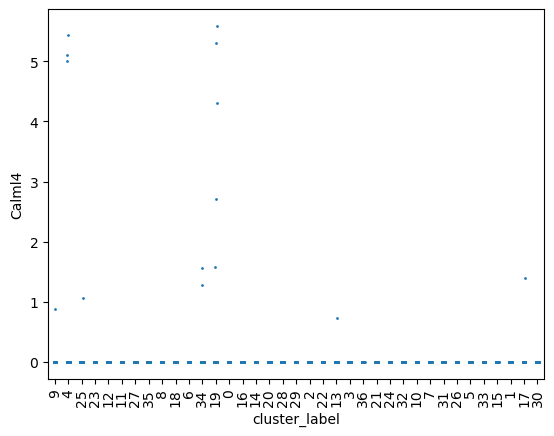

In [129]:
df_tmp_n = df_orig.reindex(columns = df_marker.columns)
_,df_tmp_n = dp.analyze_cv(df_tmp_n,20000,5,0)
#check some specific expression of genes
gene = 'Calml4'
%matplotlib inline
fig,ax = plt.subplots()
#sns.violinplot(x=NN_meta_data_df_plis.T['cluster_label'], y=NN_df_n.T[gene], inner = 'point')
#sns.objects.jitter(width = 0.5, x=NN_meta_data_df_plis.T['cluster_label'], y=NN_df_n.T[gene])
sns.stripplot(x=meta_data_df_post_linkage_intra_sorted.T['cluster_label'], y=df_tmp_n.T[gene], jitter = True, size = 2)
ax.set_xticklabels(linkage_cluster_order, rotation = 90)
plt.show()

### Heatmap <a name="marker_heatmap"></a>

First, standerdize the marker dataframe

In [131]:
marker_log_and_std_arr, status_df = dp.log_and_standerdize_df(df_marker,status_df, log = False)

column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00


In [132]:
marker_log_and_std_arr.T.shape

(187, 58908)

In [133]:
df_marker_log_and_std = pd.DataFrame(index = df_marker.index, columns=df_post_linkage_intra_sorted.columns, data = marker_log_and_std_arr.T)

In [134]:
meta_data_df_post_linkage_intra_sorted.shape

(28, 58908)

In [135]:
#df_marker_log_and_std = df_marker.copy()

In [136]:
df_marker.shape

(187, 58908)

In [137]:
df_marker_log_and_std.shape

(187, 58908)

In [138]:
df_marker_log_and_std.head()

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,CACGGGTGTGCTATTG-1_10X52_3,TCACATTTCGAATGCT-1_10X36_2,AGAAGCGCATATACCG-1_10X51_3,CGCGTGAGTTACTCAG-1_10X36_2,ATCCTATGTGTGAGCA-1_10X37_2,ACTTCCGGTGTTACAC-1_10X35_1,GACCCAGTCCCTATTA-1_10X52_1,...,GATAGCTAGGTTCACT-1_10X38_2,TTGGGATTCGTTCCTG-1_10X38_1,CTTGAGAGTGGCTACC-1_10X51_1,TACTTCAAGCAATTAG-1_10X38_1,GCAGCCACACACAGCC-1_10X51_2,TCGAACAAGGAGCTGT-1_10X52_1,TCTAACTAGGGTATAT-1_10X52_2,TTCGCTGGTACTGACT-1_10X37_2,CCCGGAATCGTAGGGA-1_10X51_2,CCACACTTCGTCTACC-1_10X37_2
gene,,,,,,,,,,,,,,,,,,,,,
Bcl2a1b,6.333556,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,...,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708
Tmem119,4.151100,7.007794,1.294406,2.722753,4.151100,1.294406,-0.133941,7.007794,5.579447,5.579447,...,-0.133941,-0.133941,-0.133941,-0.133941,-0.133941,-0.133941,-0.133941,-0.133941,-0.133941,-0.133941
Ccl4,-0.100105,-0.100105,-0.100105,2.579536,-0.100105,-0.100105,-0.100105,0.197633,0.495371,1.090846,...,-0.100105,-0.100105,-0.100105,-0.100105,-0.100105,-0.100105,-0.100105,-0.100105,-0.100105,0.197633
Siglech,3.779571,-0.132693,-0.132693,1.823439,7.691836,5.735704,3.779571,1.823439,3.779571,3.779571,...,-0.132693,-0.132693,-0.132693,-0.132693,-0.132693,-0.132693,-0.132693,-0.132693,-0.132693,-0.132693
Trem2,-0.147308,4.783629,2.318161,3.139983,0.674515,1.496338,1.496338,-0.147308,1.496338,-0.147308,...,-0.147308,-0.147308,-0.147308,-0.147308,-0.147308,-0.147308,-0.147308,-0.147308,-0.147308,-0.147308


Write to file

In [139]:
pwd

'/home/isaac/analysis/scRNA-seq'

In [140]:
today

'2025-04-11'

In [137]:
#outfile_name = 'df_marker_ls_' + today
#df_marker_log_and_std.to_feather('/bigdata/isaac/'+outfile_name+'.feather')
#outfile_name = 'metadata_df_marker_' + today
#meta_data_df.to_json('/bigdata/isaac/'+outfile_name+'.json')

In [138]:
#df_marker_log_and_std = pd.read_feather('/bigdata/isaac/df_marker_log_and_std.feather')
#metadata_df_marker_log_and_std = pd.read_json('/bigdata/isaac/metadata_df_marker_log_and_std.json')

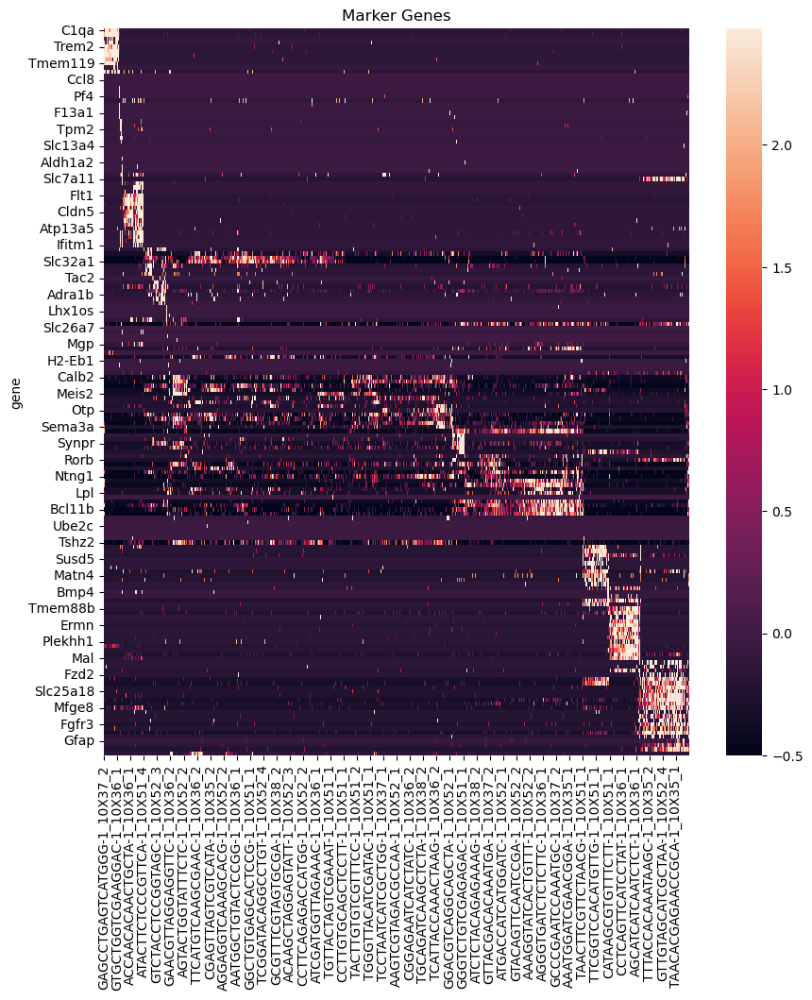

In [171]:

ax, fig = plt.subplots(figsize = (10,10))
#set robust to True causes Seaborn to set the bounds of the color scale at the 2nd and 98th percentile values
#to display all ticks, use: xticklabels=True, yticklabels=True
plt.title('Marker Genes')
sns.heatmap(df_marker_log_and_std, robust=True)
plt.show()

Update plot to show average cluster position

In [141]:
df_marker_log_and_std_col = pd.DataFrame(data = df_marker_log_and_std.to_numpy(), 
                                         index = df_marker_log_and_std.index,
                                        columns = list(meta_data_df_post_linkage_intra_sorted.loc['cluster_label',:]))

In [142]:
df_marker_log_and_std_col.head()

,9,9,9,9,9,9,9,9,9,9,...,30,30,30,30,30,30,30,30,30,30
gene,,,,,,,,,,,,,,,,,,,,,
Bcl2a1b,6.333556,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,...,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708,-0.099708
Tmem119,4.151100,7.007794,1.294406,2.722753,4.151100,1.294406,-0.133941,7.007794,5.579447,5.579447,...,-0.133941,-0.133941,-0.133941,-0.133941,-0.133941,-0.133941,-0.133941,-0.133941,-0.133941,-0.133941
Ccl4,-0.100105,-0.100105,-0.100105,2.579536,-0.100105,-0.100105,-0.100105,0.197633,0.495371,1.090846,...,-0.100105,-0.100105,-0.100105,-0.100105,-0.100105,-0.100105,-0.100105,-0.100105,-0.100105,0.197633
Siglech,3.779571,-0.132693,-0.132693,1.823439,7.691836,5.735704,3.779571,1.823439,3.779571,3.779571,...,-0.132693,-0.132693,-0.132693,-0.132693,-0.132693,-0.132693,-0.132693,-0.132693,-0.132693,-0.132693
Trem2,-0.147308,4.783629,2.318161,3.139983,0.674515,1.496338,1.496338,-0.147308,1.496338,-0.147308,...,-0.147308,-0.147308,-0.147308,-0.147308,-0.147308,-0.147308,-0.147308,-0.147308,-0.147308,-0.147308


In [143]:
change_indices = dp.get_heatmap_cluster_borders(meta_data_df_post_linkage_intra_sorted)

Indices where the value changes: [0, 1491, 1577, 1808, 1886, 2931, 3989, 4046, 4097, 4192, 4300, 4406, 4490, 4872, 32605, 33443, 34850, 34955, 35104, 35157, 46112, 46319, 46627, 47869, 47919, 48178, 48239, 48353, 48449, 50541, 50601, 50817, 53785, 53952, 54018, 58418, 58744, 58907]


In [144]:
marker_genes_sorted

['Bcl2a1b',
 'Tmem119',
 'Ccl4',
 'Siglech',
 'Trem2',
 'C1qa',
 'C1qb',
 'P2ry12',
 'Rgs1',
 'Ctss',
 'Cx3cr1',
 'Lcp1',
 'Junb',
 'F13a1',
 'Cd209f',
 'Clec10a',
 'Ifi27l2a',
 'Cd209g',
 'Ccl8',
 'Clec4n',
 'Ms4a7',
 'Wfdc17',
 'Mrc1',
 'Pf4',
 'Myh11',
 'Tpm2',
 'Nr4a2',
 'Btg2',
 'Tagln',
 'Acta2',
 'Pln',
 'Cnn1',
 'Fos',
 'Fmod',
 'Slc6a13',
 'Slc13a4',
 'Itih2',
 'Slc22a6',
 'Fam180a',
 'Zic1',
 'Slc7a11',
 'Aldh1a2',
 'Cd93',
 'Ly6c1',
 'Slco1a4',
 'Hmcn1',
 'Ctla2a',
 'Cldn5',
 'Rgs5',
 'Ndufa4l2',
 'Ifitm1',
 'Higd1b',
 'Vtn',
 'Abcc9',
 'Kcnj8',
 'Flt1',
 'Ly6a',
 'Gm26802',
 'Atp13a5',
 'Tac2',
 'Ecel1',
 'Isl1',
 'Tshz2',
 'Slc32a1',
 'Gad2',
 'Prlr',
 'Elavl2',
 'Gal',
 'Slc5a7',
 'Prg4',
 'Slc26a7',
 'Nov',
 'Ogn',
 'Slc47a1',
 'Mgp',
 'H2-Ab1',
 'Clec12a',
 'Cd74',
 'H2-Eb1',
 'Fosb',
 'Penk',
 'Otp',
 'Kit',
 'Hapln1',
 'Cplx3',
 'Pam',
 'Lamp5',
 'Igf1',
 'Cnr1',
 'Adra1b',
 'Rgs12',
 'Npas1',
 'Htr3a',
 'Vip',
 'Nxph1',
 'Slc17a6',
 'Meis2',
 'Tcf7l2',
 'Calb2',
 'Lh

In [145]:
fs_w = dp.compute_fs_waterfall(marker_genes_sorted)
fs_w

len marker gen sorted 187
fs 2.6


2.6

saving heatmap..


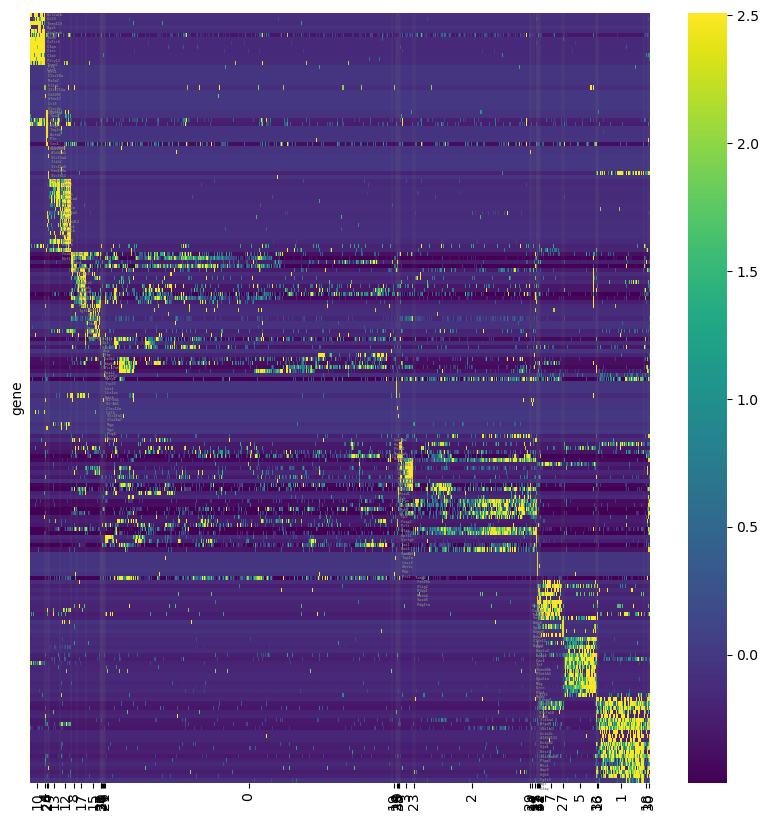

In [ ]:
dp.plot_marker_heatmap(df_marker_log_and_std_col, 
                       pos, 
                       linkage_cluster_order, 
                       change_indices, 
                       tg, 
                       tgfs, 
                       linkage_alg,
                       dist_metric,
                       folder = '/bigdata/isaac/',
                       fs_waterfall=fs_w,
                       cell_class = 'NN_L1',
                       savefig = True)

In [146]:
for c,g in zip(linkage_cluster_order,tg):
    print (c,g)

9 ['Bcl2a1b', 'Tmem119', 'Ccl4', 'Siglech', 'Trem2', 'C1qa', 'C1qb', 'P2ry12', 'Rgs1', 'Ctss', 'Cx3cr1', 'Lcp1', 'Junb']
4 ['F13a1', 'Cd209f', 'Clec10a', 'Ifi27l2a', 'Cd209g', 'Ccl8', 'Clec4n', 'Ms4a7', 'Wfdc17', 'Mrc1', 'Pf4']
25 ['Myh11', 'Tpm2', 'Nr4a2', 'Btg2', 'Tagln', 'Acta2', 'Pln', 'Cnn1', 'Fos']
23 ['Fmod', 'Slc6a13', 'Slc13a4', 'Itih2', 'Slc22a6', 'Fam180a', 'Zic1', 'Slc7a11', 'Aldh1a2']
12 ['Cd93', 'Ly6c1', 'Slco1a4', 'Hmcn1', 'Ctla2a', 'Cldn5', 'Rgs5', 'Ndufa4l2', 'Ifitm1', 'Higd1b', 'Vtn', 'Abcc9', 'Kcnj8', 'Flt1', 'Ly6a', 'Gm26802', 'Atp13a5']
11 ['Tac2', 'Ecel1', 'Isl1', 'Tshz2', 'Slc32a1', 'Gad2', 'Prlr', 'Elavl2', 'Gal', 'Slc5a7']
27 ['Prg4', 'Slc26a7', 'Nov', 'Ogn', 'Slc47a1', 'Mgp']
35 ['H2-Ab1', 'Clec12a', 'Cd74', 'H2-Eb1']
8 ['Fosb']
18 ['Penk', 'Otp']
6 ['Kit', 'Hapln1', 'Cplx3', 'Pam', 'Lamp5', 'Igf1']
34 ['Cnr1', 'Adra1b', 'Rgs12', 'Npas1', 'Htr3a', 'Vip']
19 ['Nxph1', 'Slc17a6', 'Meis2', 'Tcf7l2', 'Calb2']
0 ['Lhx1', 'Ramp1', 'Trp73', 'Ndnf', 'Lhx1os']
16 ['Adc

<IPython.core.display.Javascript object>


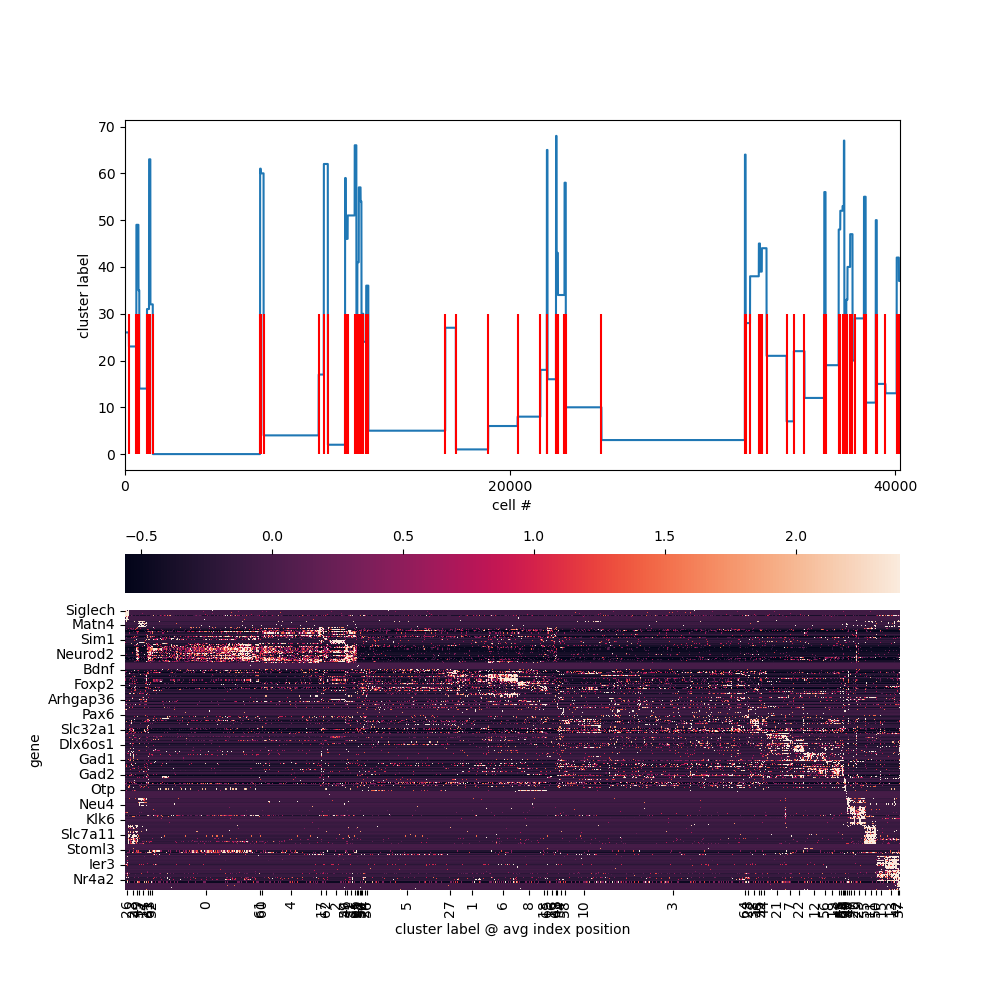

In [145]:
fig, (ax1,ax2) = plt.subplots(nrows=2, ncols=1, figsize = (10,10))
#set robust to True causes Seaborn to set the bounds of the color scale at the 2nd and 98th percentile values
#to display all ticks, use: xticklabels=True, yticklabels=True

ax1.plot(np.array(meta_data_df_post_linkage.loc['cluster_label',:]))
ax1.set_xticks(ticks = [0, 20000, 40000])
ax1.margins(x=0)
ax1.set_xlabel('cell #')
ax1.set_ylabel('cluster label')
ax1.vlines(change_indices, 0 ,30, colors='r')

#plt.title('Heatmap using  column major F style')
#to move colorbar to top, add code below to .heatmap call
#cbar_kws=dict(location = 'top')
ax2 = sns.heatmap(df_marker_log_and_std_col, robust=True,cbar_kws=dict(location = 'top'))
ax2.set_xticks(ticks = pos, labels = linkage_cluster_order)
ax2.set_xlabel('cluster label @ avg index position')

plt.show()

In [146]:
df_marker_log_and_std_col

,26,26,26,26,26,26,26,26,26,26,...,37,37,37,37,37,37,37,37,37,37
gene,,,,,,,,,,,,,,,,,,,,,
Siglech,8.872121,-0.060924,-0.060924,13.338644,8.872121,-0.060924,-0.060924,4.405599,-0.060924,-0.060924,...,-0.060924,-0.060924,-0.060924,-0.060924,-0.060924,-0.060924,-0.060924,-0.060924,-0.060924,-0.060924
C1qb,2.437021,1.810427,3.690208,2.437021,2.437021,2.437021,-0.069355,1.810427,2.437021,0.557239,...,-0.069355,-0.069355,-0.069355,-0.069355,-0.069355,-0.069355,-0.069355,-0.069355,-0.069355,-0.069355
Ctss,2.654878,1.292542,-0.069794,4.017214,2.654878,-0.069794,1.292542,-0.069794,-0.069794,-0.069794,...,-0.069794,-0.069794,-0.069794,-0.069794,-0.069794,-0.069794,-0.069794,-0.069794,-0.069794,-0.069794
C1qa,1.768909,0.546678,1.157794,6.046721,4.824489,1.768909,0.546678,0.546678,0.546678,-0.064438,...,-0.064438,-0.064438,-0.064438,-0.064438,-0.064438,-0.064438,-0.064438,-0.064438,-0.064438,-0.064438
C1qc,3.654192,3.654192,0.862781,7.376072,0.862781,0.862781,-0.067689,0.862781,1.793251,0.862781,...,-0.067689,-0.067689,-0.067689,-0.067689,-0.067689,-0.067689,-0.067689,-0.067689,-0.067689,-0.067689
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Myh11,-0.049911,-0.049911,-0.049911,-0.049911,-0.049911,-0.049911,-0.049911,-0.049911,-0.049911,-0.049911,...,30.051192,31.635461,55.399489,36.388266,68.073638,22.129849,53.815221,34.803998,25.298386,-0.049911
Olfml2a,-0.051894,-0.051894,-0.051894,-0.051894,-0.051894,-0.051894,-0.051894,-0.051894,-0.051894,-0.051894,...,-0.051894,-0.051894,17.500077,26.276062,52.604019,8.724091,8.724091,8.724091,8.724091,8.724091
Cnn1,-0.030120,-0.030120,-0.030120,-0.030120,-0.030120,-0.030120,-0.030120,-0.030120,-0.030120,-0.030120,...,-0.030120,13.291638,39.935153,26.613395,26.613395,13.291638,133.187455,26.613395,-0.030120,-0.030120


In [ ]:
for c in meta_data_df_post_linkage_intra_sorted.loc['cluster_label',:].unique()

array([9, 4, 25, 23, 12, 11, 27, 35, 8, 18, 6, 34, 19, 0, 16, 14, 20, 28,
       29, 2, 22, 13, 3, 36, 21, 24, 32, 10, 7, 31, 26, 5, 33, 15, 1, 17,
       30], dtype=object)

In [109]:
meta_data_df_post_linkage_intra_sorted.loc[:,meta_data_df_post_linkage_intra_sorted.loc['cluster_label',:] == 9]

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,CACGGGTGTGCTATTG-1_10X52_3,TCACATTTCGAATGCT-1_10X36_2,AGAAGCGCATATACCG-1_10X51_3,CGCGTGAGTTACTCAG-1_10X36_2,ATCCTATGTGTGAGCA-1_10X37_2,ACTTCCGGTGTTACAC-1_10X35_1,GACCCAGTCCCTATTA-1_10X52_1,...,TGTGGCGGTACCCACG-1_10X38_2,GGTTCTCCAGCCTTCT-1_10X37_1,TAGGGTTCACATGTTG-1_10X38_1,AGCTACAGTCAAGTTC-1_10X38_1,CCTGCATAGTCCCGGT-1_10X38_1,TGATGCACATGACACT-1_10X37_1,GTAACCACAAGTGCTT-1_10X37_1,ATCGTAGCATGGCTAT-1_10X38_1,GTTGAACGTAGTGGCA-1_10X35_2,TAGACTGTCGCTGTTC-1_10X51_1
Serial_Number,68.0,68.0,68.0,103.0,66.0,99.0,66.0,68.0,63.0,101.0,...,70.0,67.0,69.0,69.0,69.0,67.0,67.0,69.0,64.0,97.0
Date_Captured,2019-11-25,2019-11-25,2019-11-25,05/31/20,2019-11-24,05/31/20,2019-11-24,2019-11-25,2019-11-20,05/31/20,...,2019-12-01,2019-11-25,2019-12-01,2019-12-01,2019-12-01,2019-11-25,2019-11-25,2019-12-01,2019-11-20,05/31/20
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,,,,C57Bl/6,,C57Bl/6,,,,C57Bl/6,...,,,,,,,,,,C57Bl/6
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Naïve-M,Naïve-M,Naïve-M,Breeder-M,Naïve-M,Breeder-M,Naïve-M,Naïve-M,Naïve-F,Breeder-F,...,Naïve-F,Naïve-M,Naïve-F,Naïve-F,Naïve-F,Naïve-M,Naïve-M,Naïve-F,Naïve-F,Breeder-F
ChipID,10X37,10X37,10X37,10X52,10X36,10X51,10X36,10X37,10X35,10X52,...,10X38,10X37,10X38,10X38,10X38,10X37,10X37,10X38,10X35,10X51
SampleID,10X37_2,10X37_2,10X37_2,10X52_3,10X36_2,10X51_3,10X36_2,10X37_2,10X35_1,10X52_1,...,10X38_2,10X37_1,10X38_1,10X38_1,10X38_1,10X37_1,10X37_1,10X38_1,10X35_2,10X51_1
DonorID,"DI4,DI5","DI4,DI5","DI4,DI5",DI-B3-M,DI3,DI-B1-M,DI3,"DI4,DI5","DI1,DI2",DI-B3-F,...,DI6,"DI4,DI5",DI6,DI6,DI6,"DI4,DI5","DI4,DI5",DI6,"DI1,DI2",DI-B1-F


In [112]:
for c in linkage_cluster_order:
    #print (meta_data_df_post_linkage_intra_sorted.loc[:,meta_data_df_post_linkage_intra_sorted.loc['cluster_label',:] == c].shape[1])
    if meta_data_df_post_linkage_intra_sorted.loc[:,meta_data_df_post_linkage_intra_sorted.loc['cluster_label',:] == c].shape[1] == 149:
        print (c)

28


## Cluster/Cell Labeling <a name="labeling"></a>

### Initialization of relevant marker genes corresponding to class types <a name="classinit"></a>

4 Main Cell types of interest - Vglut1, Vglut2, GABA, and non-neuronal

In [113]:
Vglut1_marker = 'Slc17a7'

Vglut2_marker = 'Slc17a6'

GABA_marker = 'Gad2'

exclude_markers = ['C1qc','C1qa','C1qb','Gja1','Cx3cr1','Acta2','Ly6c1',
                   'Mfge8','Plxnb3','Cldn11','Aqp4','Vtn','Cldn5',
                   'Pdgfrb','Flt1','Slc25a18','Pdgfra','Foxj1',
                   'Olig1','Olig2','Sox10','Hbb-bs','Hbb-bt',
                   'Hba-a2','Ttr']





Sanity check that markers are in df_marker

In [114]:
Vglut1_marker in df_marker.index

True

In [115]:
Vglut2_marker in df_marker.index

True

In [116]:
GABA_marker in df_marker.index

True

Check non-neuronal, create new exclude_markers_updated list for exclude markers found in df_marker

In [117]:
exclude_markers_updated = []
for g in exclude_markers:
    print (g, g in df_marker.index)
    if g in df_marker.index:
        exclude_markers_updated.append(g)

C1qc False
C1qa True
C1qb True
Gja1 True
Cx3cr1 True
Acta2 True
Ly6c1 True
Mfge8 True
Plxnb3 False
Cldn11 True
Aqp4 True
Vtn True
Cldn5 True
Pdgfrb False
Flt1 True
Slc25a18 True
Pdgfra True
Foxj1 False
Olig1 False
Olig2 True
Sox10 True
Hbb-bs False
Hbb-bt False
Hba-a2 False
Ttr False


In [118]:
exclude_markers_updated

['C1qa',
 'C1qb',
 'Gja1',
 'Cx3cr1',
 'Acta2',
 'Ly6c1',
 'Mfge8',
 'Cldn11',
 'Aqp4',
 'Vtn',
 'Cldn5',
 'Flt1',
 'Slc25a18',
 'Pdgfra',
 'Olig2',
 'Sox10']

In [119]:
df_marker.shape

(187, 58908)

In [120]:
df_marker.head()

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,CACGGGTGTGCTATTG-1_10X52_3,TCACATTTCGAATGCT-1_10X36_2,AGAAGCGCATATACCG-1_10X51_3,CGCGTGAGTTACTCAG-1_10X36_2,ATCCTATGTGTGAGCA-1_10X37_2,ACTTCCGGTGTTACAC-1_10X35_1,GACCCAGTCCCTATTA-1_10X52_1,...,GATAGCTAGGTTCACT-1_10X38_2,TTGGGATTCGTTCCTG-1_10X38_1,CTTGAGAGTGGCTACC-1_10X51_1,TACTTCAAGCAATTAG-1_10X38_1,GCAGCCACACACAGCC-1_10X51_2,TCGAACAAGGAGCTGT-1_10X52_1,TCTAACTAGGGTATAT-1_10X52_2,TTCGCTGGTACTGACT-1_10X37_2,CCCGGAATCGTAGGGA-1_10X51_2,CCACACTTCGTCTACC-1_10X37_2
gene,,,,,,,,,,,,,,,,,,,,,
Bcl2a1b,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tmem119,3,5,1,2,3,1,0,5,4,4,...,0,0,0,0,0,0,0,0,0,0
Ccl4,0,0,0,9,0,0,0,1,2,4,...,0,0,0,0,0,0,0,0,0,1
Siglech,2,0,0,1,4,3,2,1,2,2,...,0,0,0,0,0,0,0,0,0,0
Trem2,0,6,3,4,1,2,2,0,2,0,...,0,0,0,0,0,0,0,0,0,0


In [121]:
meta_data_df_post_linkage_intra_sorted.tail()

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,CACGGGTGTGCTATTG-1_10X52_3,TCACATTTCGAATGCT-1_10X36_2,AGAAGCGCATATACCG-1_10X51_3,CGCGTGAGTTACTCAG-1_10X36_2,ATCCTATGTGTGAGCA-1_10X37_2,ACTTCCGGTGTTACAC-1_10X35_1,GACCCAGTCCCTATTA-1_10X52_1,...,GATAGCTAGGTTCACT-1_10X38_2,TTGGGATTCGTTCCTG-1_10X38_1,CTTGAGAGTGGCTACC-1_10X51_1,TACTTCAAGCAATTAG-1_10X38_1,GCAGCCACACACAGCC-1_10X51_2,TCGAACAAGGAGCTGT-1_10X52_1,TCTAACTAGGGTATAT-1_10X52_2,TTCGCTGGTACTGACT-1_10X37_2,CCCGGAATCGTAGGGA-1_10X51_2,CCACACTTCGTCTACC-1_10X37_2
LIbConstructionComment,,,,,,,,,,,...,,,,,,,,,,
ngperul_seqlib,16.0,16.0,16.0,20.4(second prep),12.1,22.0,12.1,16.0,13.6,15.7,...,18.7,15.0,19.2,15.0,22.2,15.7,17.5,16.0,22.2,16.0
lengthbp_seqlib,460.0,460.0,460.0,507.0,486.0,487.0,486.0,460.0,416.0,466.0,...,415.0,420.0,478.0,420.0,474.0,466.0,440.0,460.0,474.0,460.0
Sample_Index,F9,F9,F9,F12,A9,B2,A9,F9,D9,D12,...,C9,B9,G1,B9,A2,D12,E12,F9,A2,F9
cluster_label,9,9,9,9,9,9,9,9,9,9,...,30,30,30,30,30,30,30,30,30,30


In [123]:
# column sum of exclude marker, using log/standerdized dbscan clusterted dataframe 
df_ex_marker = df_pre_linkage_ls.loc[exclude_markers_updated,:]
nonneuro = df_ex_marker.sum(axis = 0)
nonneuro

TTGTTGTTCTCGTTTA-1_10X37_2   -3.571023
AAAGGGCAGCAGATAT-1_10X51_2   -1.219545
AAAGGGCAGGTAAAGG-1_10X51_2   -3.571023
AAAGGGCCAAAGAGTT-1_10X51_2   -3.571023
AAAGGGCGTCTTCGAA-1_10X51_2   -1.430912
                                ...   
AGGTGTTTCTCAGAAC-1_10X36_1   -0.985214
ATCGGCGTCACCCTTG-1_10X52_1   -3.571023
TAGACTGGTCAGTCTA-1_10X37_2   -3.571023
ATGGAGGTCATCACAG-1_10X52_2   -3.571023
CCTCAACCACGACGTC-1_10X52_1   -3.571023
Length: 58908, dtype: float64

### Marker Mean Expression Calculation <a name="classmean"></a>

In [124]:
linkage_cluster_order

array([ 9,  4, 25, 23, 12, 11, 27, 35,  8, 18,  6, 34, 19,  0, 16, 14, 20,
       28, 29,  2, 22, 13,  3, 36, 21, 24, 32, 10,  7, 31, 26,  5, 33, 15,
        1, 17, 30], dtype=int32)

In [125]:
m_factor = 2 #if the largest marker mean for a given cluster is not at least m_factor greater than the 2nd largest, classify as doublet
#higher values = more aggressive doublet filtering

In [126]:
mu_g, mu_vg1, mu_vg2, mu_nn, std_g, std_vg1,std_vg2,std_nn, labels_to_class_map, meta_data_df_mm = dp.compute_marker_means(
                     GABA_marker,
                     Vglut1_marker,
                     Vglut2_marker,
                     exclude_markers_updated,
                     df_marker,
                     meta_data_df_post_linkage_intra_sorted,
                     linkage_cluster_order,
                     m_factor)

In [127]:
unique_labels

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36])

In [128]:
labels_to_class_map

{9: 'Nonneuronal',
 4: 'Nonneuronal',
 25: 'Nonneuronal',
 23: 'Nonneuronal',
 12: 'Nonneuronal',
 11: 'Nonneuronal',
 27: 'GABA',
 35: 'Doublet',
 8: 'Doublet',
 18: 'Vglut2',
 6: 'Vglut2',
 34: 'Vglut2',
 19: 'GABA',
 0: 'GABA',
 16: 'GABA',
 14: 'GABA',
 20: 'Vglut2',
 28: 'Vglut2',
 29: 'Vglut1',
 2: 'Vglut1',
 22: 'Vglut1',
 13: 'Vglut1',
 3: 'Vglut1',
 36: 'Vglut1',
 21: 'Doublet',
 24: 'Doublet',
 32: 'Doublet',
 10: 'Nonneuronal',
 7: 'Nonneuronal',
 31: 'Nonneuronal',
 26: 'Nonneuronal',
 5: 'Nonneuronal',
 33: 'Nonneuronal',
 15: 'Nonneuronal',
 1: 'Nonneuronal',
 17: 'Doublet',
 30: 'Doublet'}

In [193]:
np.where(linkage_cluster_order==19)[0][0]

11

In [194]:
mu_g[np.where(linkage_cluster_order==19)[0][0]]

1.2781954887218046

In [195]:
#for debugging/rerunning compute_marker_means(), uncomment line below to remove inserted cell class row
#meta_data_df = meta_data_df.drop(['cell_class'])

In [196]:
meta_data_df_mm.tail()

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,CACGGGTGTGCTATTG-1_10X52_3,TCACATTTCGAATGCT-1_10X36_2,AGAAGCGCATATACCG-1_10X51_3,CGCGTGAGTTACTCAG-1_10X36_2,CTCAGTCAGGCGTTGA-1_10X52_3,ACTTCCGGTGTTACAC-1_10X35_1,ATCCTATGTGTGAGCA-1_10X37_2,...,CATGAGTTCAGTCTTT-1_10X36_2,TCGCACTTCCACTGAA-1_10X36_2,CTTGAGAGTGGCTACC-1_10X51_1,TTGGGATTCGTTCCTG-1_10X38_1,GATAGCTAGGTTCACT-1_10X38_2,TACTTCAAGCAATTAG-1_10X38_1,GCAGCCACACACAGCC-1_10X51_2,TTCGCTGGTACTGACT-1_10X37_2,CCCGGAATCGTAGGGA-1_10X51_2,CCACACTTCGTCTACC-1_10X37_2
ngperul_seqlib,16.0,16.0,16.0,20.4(second prep),12.1,22.0,12.1,20.4(second prep),13.6,16.0,...,12.1,12.1,19.2,15.0,18.7,15.0,22.2,16.0,22.2,16.0
lengthbp_seqlib,460.0,460.0,460.0,507.0,486.0,487.0,486.0,507.0,416.0,460.0,...,486.0,486.0,478.0,420.0,415.0,420.0,474.0,460.0,474.0,460.0
Sample_Index,F9,F9,F9,F12,A9,B2,A9,F12,D9,F9,...,A9,A9,G1,B9,C9,B9,A2,F9,A2,F9
cluster_label,9,9,9,9,9,9,9,9,9,9,...,28,28,28,28,28,28,28,28,28,28
cell_class,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,...,Doublet,Doublet,Doublet,Doublet,Doublet,Doublet,Doublet,Doublet,Doublet,Doublet


### Class visualization on heatmap, tSNE, and mean expr plots <a name="classviz"></a>

In [197]:
s_bool,bn_bool, gaba_bool, doublet_bool, vglut1_bool, vglut2_bool, nonneuronal_bool = dp.get_boolean_vecs(meta_data_df_mm)

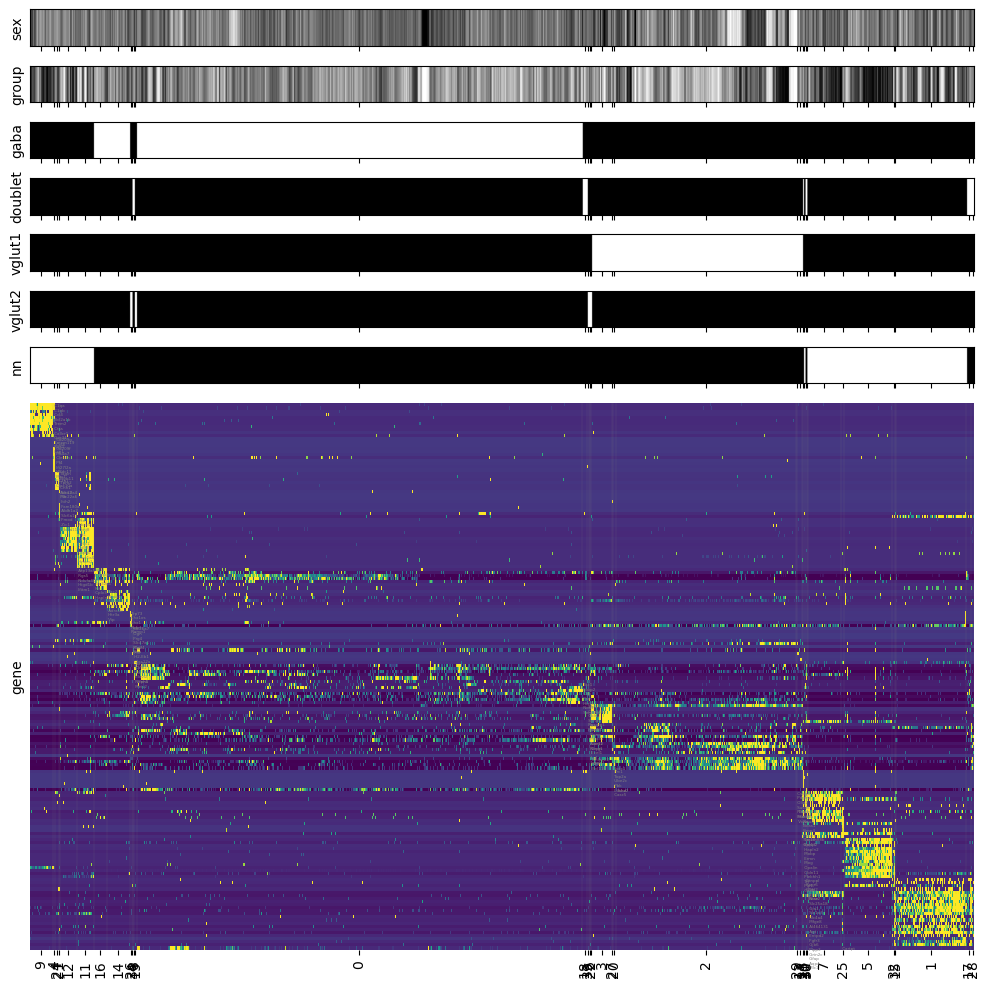

In [203]:
dp.plot_marker_heatmap_w_bool_bars(df_marker_log_and_std_col, 
                       pos, 
                       linkage_cluster_order, 
                       change_indices, 
                       tg, 
                       tgfs, 
                       linkage_alg,
                       dist_metric,
                       '/bigdata/isaac/',
                       s_bool,
                       bn_bool,
                       gaba_bool,
                       doublet_bool,
                       vglut1_bool,
                       vglut2_bool,
                       nonneuronal_bool,         
                       savefig = True,
                       cell_class = 'NN_L1')

Note: for visualization, cells are sorted in the same order as from the sort_by_cluster_order(), i.e. sorted by labels in ascending order (0,0...1,1,1...etc). The function returns the log/standerdized prelinkage dataframe, so we use this as the expr df for plotting, taking the transpose to have genes as rows, cells as columns. For plotting cluster labels, we use the unsorted arr_df and drop the 'labels' column.

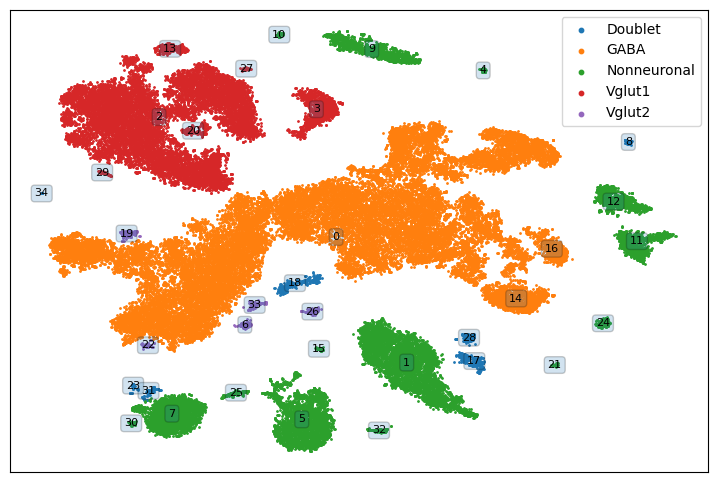

In [204]:
arr_df_class, arr_xy = dp.plot_cell_class(arr_df,labels_to_class_map,labels)

Previous plot (eps_prc = 90):

In [188]:
linkage_cluster_order[-10:-7]

array([47, 20, 29], dtype=int32)

<IPython.core.display.Javascript object>


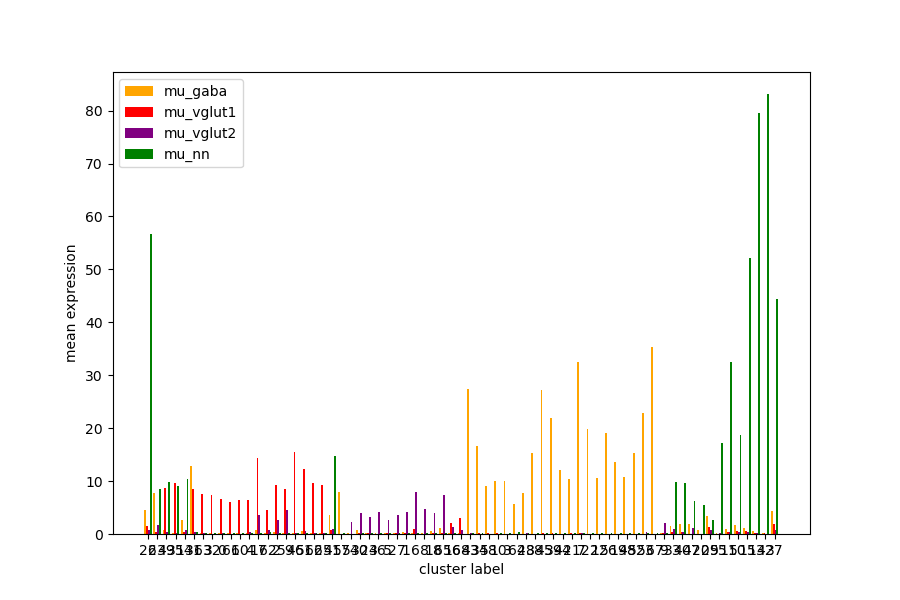

In [189]:
dp.plot_marker_means(mu_g,mu_vg1,mu_vg2,mu_nn,linkage_cluster_order)

<IPython.core.display.Javascript object>


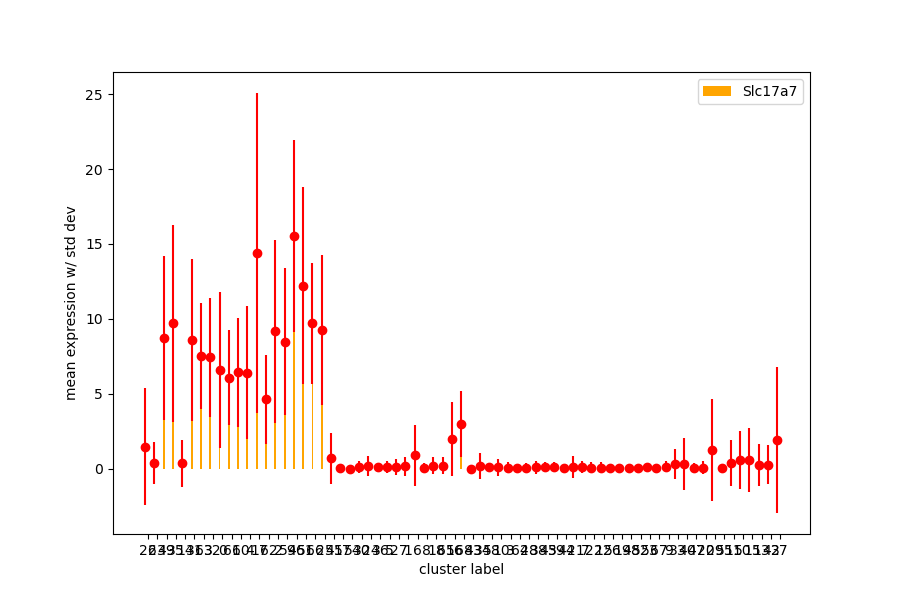

In [190]:
dp.plot_marker_mean_std(Vglut1_marker,mu_vg1,std_vg1,linkage_cluster_order)

In [205]:
dp.plot_marker_on_tsne(arr_df_class,df_pre_linkage_ls.T,GABA_marker)

TypeError: plot_marker_on_tsne() missing 2 required positional arguments: 'labels' and 'cluster_labels'

<IPython.core.display.Javascript object>


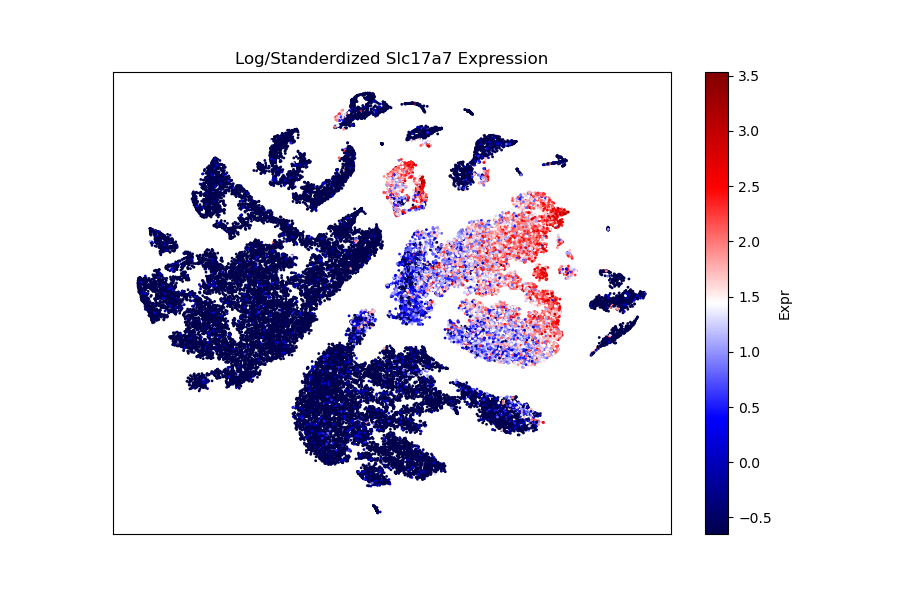

In [172]:
dp.plot_marker_on_tsne(arr_df_class,df_pre_linkage_ls.T,Vglut1_marker)

<IPython.core.display.Javascript object>


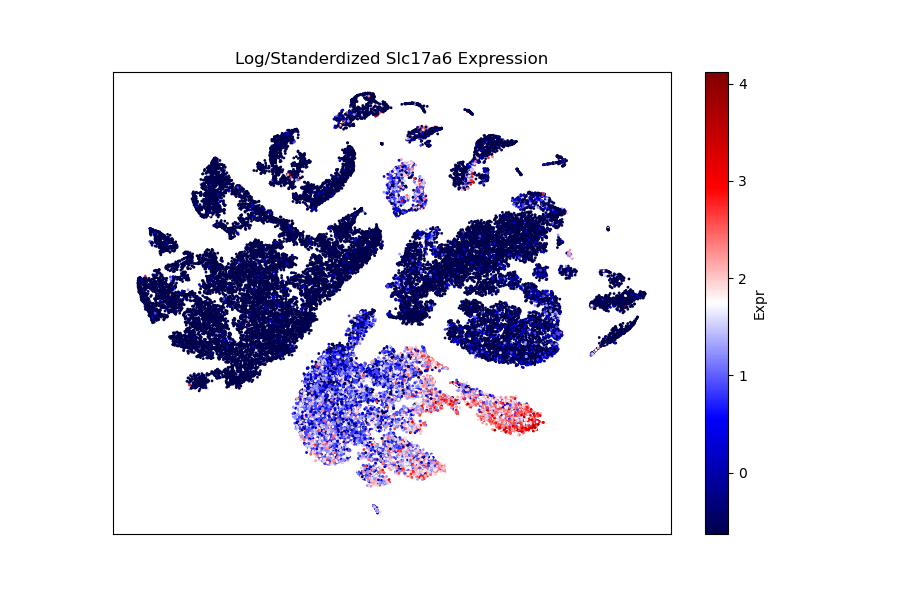

In [173]:
dp.plot_marker_on_tsne(arr_df_class,df_pre_linkage_ls.T,Vglut2_marker)

<IPython.core.display.Javascript object>


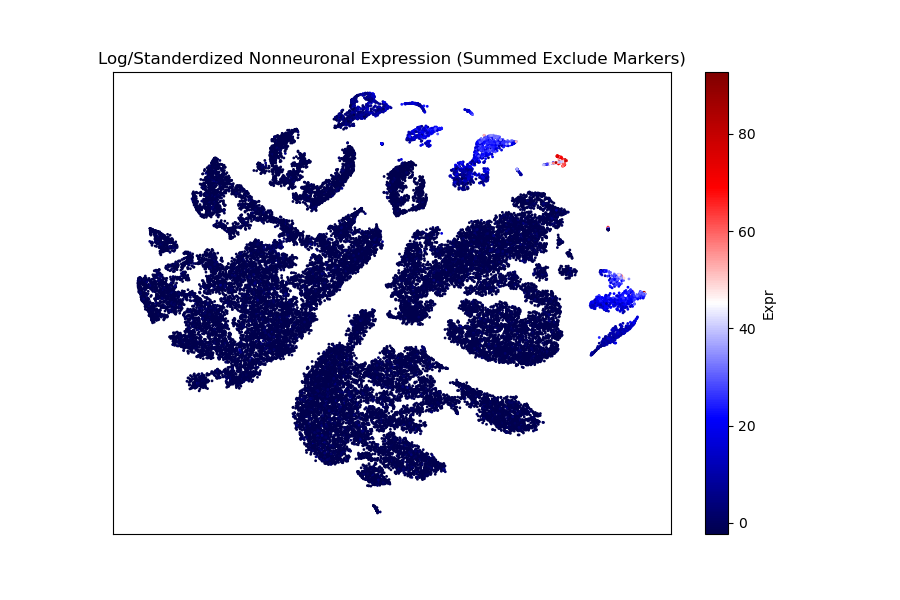

In [191]:
dp.plot_marker_on_tsne(arr_df_class,df_pre_linkage_ls.T,nonneuro, nn=True)

Put all on one plot

In [175]:
nonneuro

GCGGATCTCTCTATGT-1_10X52_4    1.485340
GCACGGTCACTCCACT-1_10X35_2   -2.269946
TTTGATCAGCGTTACT-1_10X51_1   -2.269946
CAGTGCGGTCGAGATG-1_10X36_2   -2.269946
GCACATATCCTATTTG-1_10X35_2   -2.269946
                                ...   
GTCACTCTCCGGCAAC-1_10X52_4   -2.269946
GCGAGAATCCTACCGT-1_10X38_1   -2.269946
AAGACTCCAGTGTACT-1_10X36_2   -2.269946
TCAAGTGCATCTCCCA-1_10X51_1   -2.269946
TAACGACGTCTAACTG-1_10X37_2   -2.269946
Length: 40249, dtype: float64

In [192]:
today

'2024-05-19'

In [193]:
pwd

'/home/isaac/analysis/scRNA-seq'

<IPython.core.display.Javascript object>


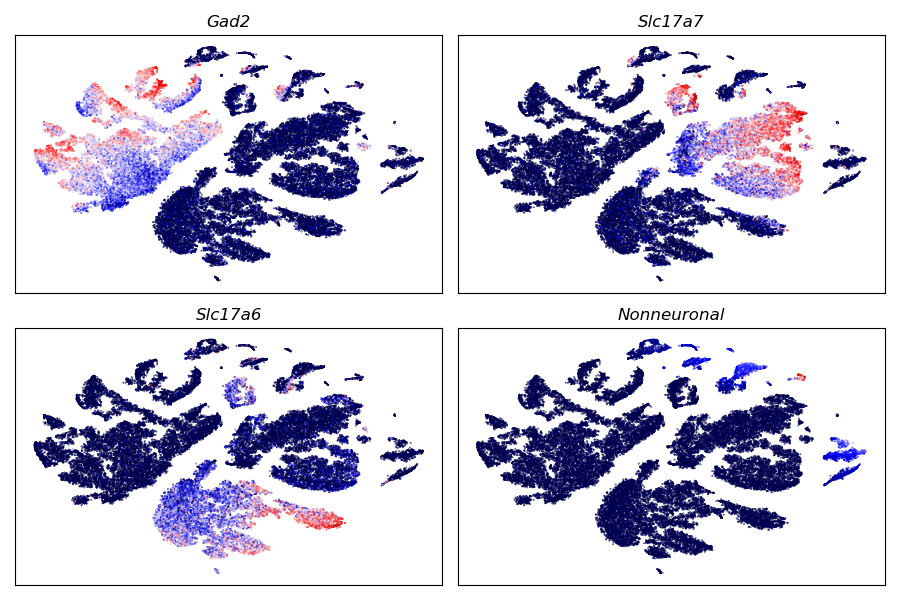

In [196]:

dp.plot_all_markers(arr_df_class,
                    arr_xy,
                    df_pre_linkage_ls.T,
                    GABA_marker,
                    Vglut1_marker,
                    Vglut2_marker,
                    nonneuro, 
                    labels, 
                    date = today,
                    label_clusters=False,
                    savefig = True)

<IPython.core.display.Javascript object>


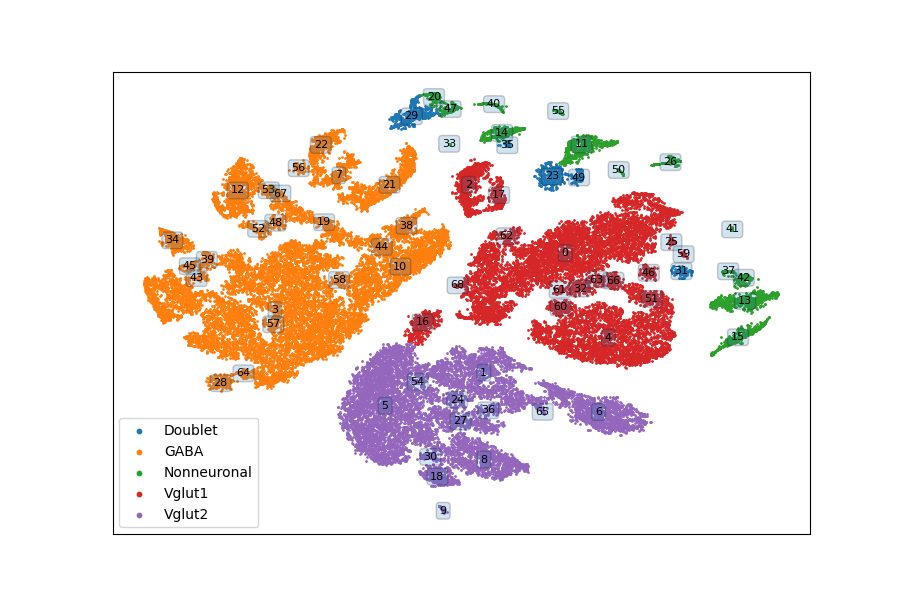

In [472]:
arr_df_class, arr_xy = dp.plot_cell_class(arr_df,labels_to_class_map,labels)

In [197]:
#Extended Expr Plot

In [198]:
len(exclude_markers_updated)

15

In [199]:
exclude_markers

['C1qc',
 'C1qa',
 'C1qb',
 'Gja1',
 'Cx3cr1',
 'Acta2',
 'Ly6c1',
 'Mfge8',
 'Plxnb3',
 'Cldn11',
 'Aqp4',
 'Vtn',
 'Cldn5',
 'Pdgfrb',
 'Flt1',
 'Slc25a18',
 'Pdgfra',
 'Foxj1',
 'Olig1',
 'Olig2',
 'Sox10',
 'Hbb-bs',
 'Hbb-bt',
 'Hba-a2',
 'Ttr']

In [200]:
exclude_markers_updated

['C1qc',
 'C1qa',
 'C1qb',
 'Gja1',
 'Cx3cr1',
 'Acta2',
 'Mfge8',
 'Aqp4',
 'Vtn',
 'Cldn5',
 'Flt1',
 'Slc25a18',
 'Pdgfra',
 'Olig2',
 'Sox10']

<IPython.core.display.Javascript object>


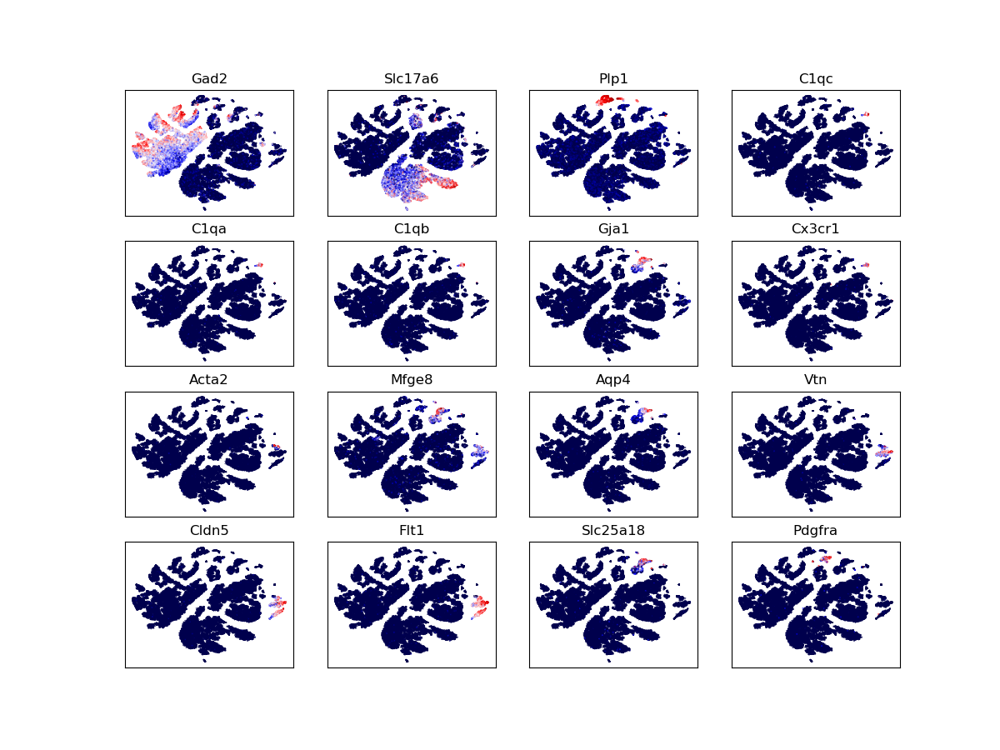

In [201]:
gene_list = ['Gad2','Slc17a6', 'Plp1'] + exclude_markers_updated[:13]
fig, ax = plt.subplots(4,4, figsize = (12,9))
x = np.array(arr_df_class['tsne-1'])
y = np.array(arr_df_class['tsne-2'])
    
for g, ax in zip(gene_list, ax.ravel()):
    z = np.array(df_pre_linkage_ls.T.loc[g,:])
    scatter = ax.scatter(x, y, c = z , cmap = 'seismic' , s = .1)
    ax.set_title(g)
    ax.set_xticks([])
    ax.set_yticks([])

In [202]:
labels_to_class_map

{26: 'Nonneuronal',
 23: 'Doublet',
 49: 'Doublet',
 35: 'Doublet',
 14: 'Nonneuronal',
 31: 'Doublet',
 63: 'Vglut1',
 32: 'Vglut1',
 0: 'Vglut1',
 61: 'Vglut1',
 60: 'Vglut1',
 4: 'Vglut1',
 17: 'Vglut1',
 62: 'Vglut1',
 2: 'Vglut1',
 59: 'Vglut1',
 46: 'Vglut1',
 51: 'Vglut1',
 66: 'Vglut1',
 25: 'Vglut1',
 41: 'Nonneuronal',
 57: 'GABA',
 54: 'Vglut2',
 30: 'Vglut2',
 24: 'Vglut2',
 36: 'Vglut2',
 5: 'Vglut2',
 27: 'Vglut2',
 1: 'Vglut2',
 6: 'Vglut2',
 8: 'Vglut2',
 18: 'Vglut2',
 65: 'Vglut2',
 16: 'Vglut1',
 68: 'Vglut1',
 43: 'GABA',
 34: 'GABA',
 58: 'GABA',
 10: 'GABA',
 3: 'GABA',
 64: 'GABA',
 28: 'GABA',
 38: 'GABA',
 45: 'GABA',
 39: 'GABA',
 44: 'GABA',
 21: 'GABA',
 7: 'GABA',
 22: 'GABA',
 12: 'GABA',
 56: 'GABA',
 19: 'GABA',
 48: 'GABA',
 52: 'GABA',
 53: 'GABA',
 67: 'GABA',
 9: 'Vglut2',
 33: 'Nonneuronal',
 40: 'Nonneuronal',
 47: 'Nonneuronal',
 20: 'Nonneuronal',
 29: 'Doublet',
 55: 'Nonneuronal',
 11: 'Nonneuronal',
 50: 'Nonneuronal',
 15: 'Nonneuronal',
 13:

In [203]:
meta_data_df_mm

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,TGAGGGATCCTTACCG-1_10X37_2,CTCATCGGTAGTGATA-1_10X35_1,GATCATGTCGCTGACG-1_10X52_3,GTTACAGGTCCCTGTT-1_10X51_1,TGATTCTTCTTAATCC-1_10X52_3,GACATCACATAGGTTC-1_10X52_2,GTGAGGATCCCGAATA-1_10X51_3,...,TGGGATTTCGAACTCA-1_10X36_1,TGCATCCCACCTGATA-1_10X35_2,GAGTGAGAGGCTCCCA-1_10X52_3,TGTGGCGAGCCTCTGG-1_10X35_2,AGATGCTCAAAGGTTA-1_10X51_2,TTGATGGGTCCAGAAG-1_10X35_2,ACCTGTCAGTATTCCG-1_10X52_3,GCTTTCGTCACACGAT-1_10X51_3,GCGGAAAAGGTAGACC-1_10X36_2,ACATTTCGTACGAAAT-1_10X52_2
Serial_Number,68.0,68.0,68.0,68.0,63.0,103.0,97.0,103.0,102.0,99.0,...,65.0,64.0,103.0,64.0,98.0,64.0,103.0,99.0,66.0,102.0
Date_Captured,2019-11-25,2019-11-25,2019-11-25,2019-11-25,2019-11-20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,...,2019-11-24,2019-11-20,05/31/20,2019-11-20,05/31/20,2019-11-20,05/31/20,05/31/20,2019-11-24,05/31/20
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,,,,,,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,...,,,C57Bl/6,,C57Bl/6,,C57Bl/6,C57Bl/6,,C57Bl/6
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Naïve-M,Naïve-M,Naïve-M,Naïve-M,Naïve-F,Breeder-M,Breeder-F,Breeder-M,Breeder-F,Breeder-M,...,Naïve-M,Naïve-F,Breeder-M,Naïve-F,Breeder-F,Naïve-F,Breeder-M,Breeder-M,Naïve-M,Breeder-F
ChipID,10X37,10X37,10X37,10X37,10X35,10X52,10X51,10X52,10X52,10X51,...,10X36,10X35,10X52,10X35,10X51,10X35,10X52,10X51,10X36,10X52
SampleID,10X37_2,10X37_2,10X37_2,10X37_2,10X35_1,10X52_3,10X51_1,10X52_3,10X52_2,10X51_3,...,10X36_1,10X35_2,10X52_3,10X35_2,10X51_2,10X35_2,10X52_3,10X51_3,10X36_2,10X52_2
DonorID,"DI4,DI5","DI4,DI5","DI4,DI5","DI4,DI5","DI1,DI2",DI-B3-M,DI-B1-F,DI-B3-M,DI-B3-F,DI-B1-M,...,DI3,"DI1,DI2",DI-B3-M,"DI1,DI2",DI-B1-F,"DI1,DI2",DI-B3-M,DI-B1-M,DI3,DI-B3-F


Write to file

In [206]:
today

'2025-04-09'

In [207]:
outfile_name = 'NN_l1_df_marker_' + today
df_marker.to_feather('/bigdata/isaac/'+outfile_name+'.feather')
outfile_name = 'NN_l1_meta_data_df_mm_' + today
meta_data_df_mm.to_json('/bigdata/isaac/'+outfile_name+'.json')

In [208]:
Counter(np.array(meta_data_df_mm.loc['cell_class',:]))

Counter({'GABA': 30040,
         'Nonneuronal': 14041,
         'Vglut1': 13149,
         'Doublet': 1128,
         'Vglut2': 550})

Look at some other markers from McKerrow et al

In [207]:
exclude_markers_updated[:6]

['C1qc', 'C1qa', 'C1qb', 'Gja1', 'Cx3cr1', 'Acta2']

In [208]:
h_genes = ['Gfap','Tmem119', 'Myrf', 'Rbfox3','Caspg4', 'Cldn5', 'Slc6a13','Slc6a1','C1ql2', 'Neurod6','Dkk3']

In [209]:
h_genes_updated= []
for g in h_genes:
    if g in df_pre_linkage_ls.T.index:
        h_genes_updated.append(g)

In [210]:
h_genes_updated

['Gfap', 'Tmem119', 'Myrf', 'Cldn5', 'Slc6a13', 'C1ql2', 'Neurod6']

<IPython.core.display.Javascript object>


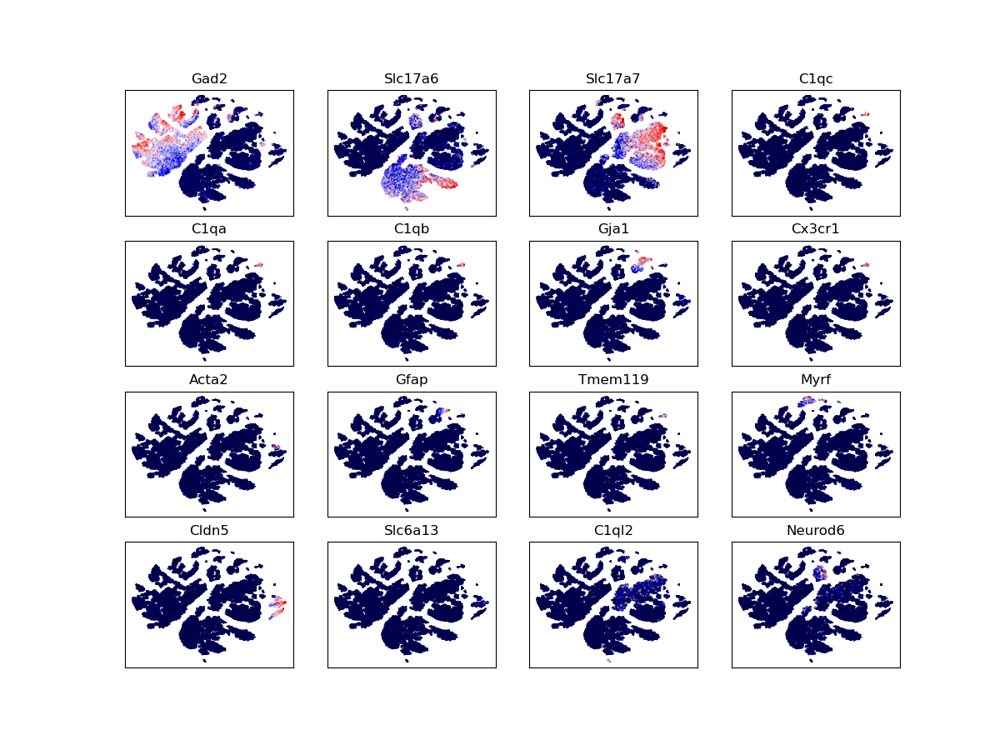

In [211]:
gene_list = ['Gad2','Slc17a6', 'Slc17a7'] + exclude_markers_updated[:6] + h_genes_updated
fig, ax = plt.subplots(4,4, figsize = (12,9))
x = np.array(arr_df_class['tsne-1'])
y = np.array(arr_df_class['tsne-2'])
    
for g, ax in zip(gene_list, ax.ravel()):
    z = np.array(df_pre_linkage_ls.T.loc[g,:])
    scatter = ax.scatter(x, y, c = z , cmap = 'seismic' , s = .1)
    ax.set_title(g)
    ax.set_xticks([])
    ax.set_yticks([])

In [ ]:
#from McKerrow et al - 
#mouse hippocampus markers
#Gfap - astrocytes
#Tmem119 - microglia
#Myrf - oligodenderocytes
#Rbfox3 - neurons
#Caspg4 - OPCs
#Cldn5 - ependymal 
#Slc6a13 - vascular
#Slc6a1 - interneurons
#C1ql2 - DG neurons
#Neurod6 & Dkk3- CA neurons

Further analysis

gene in df?  True
gene index:  [154]


<IPython.core.display.Javascript object>


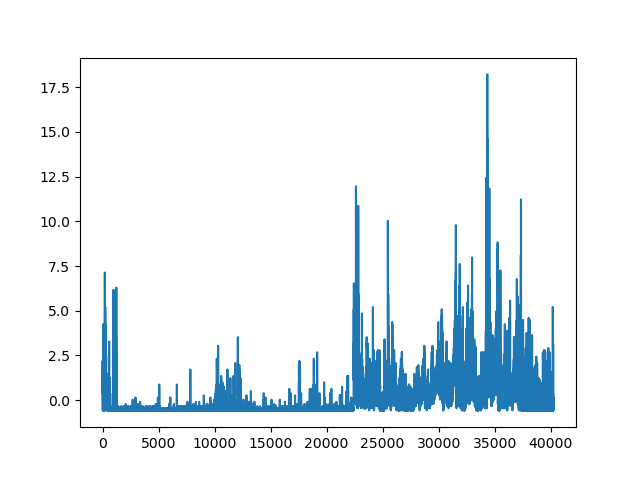

In [212]:
#gene across all cells
gene = 'Gad2'
print('gene in df? ', gene in df_marker_log_and_std.index)
gene_index = np.where(df_marker_log_and_std.index == gene)[0]
print ('gene index: ', gene_index)
#get row data
x = df_marker_log_and_std.iloc[gene_index,:]
fig,ax = plt.subplots()
plt.plot(np.array(x.iloc[0,:]))
plt.show()

inputed multiple genes, summing before plotting...


<IPython.core.display.Javascript object>


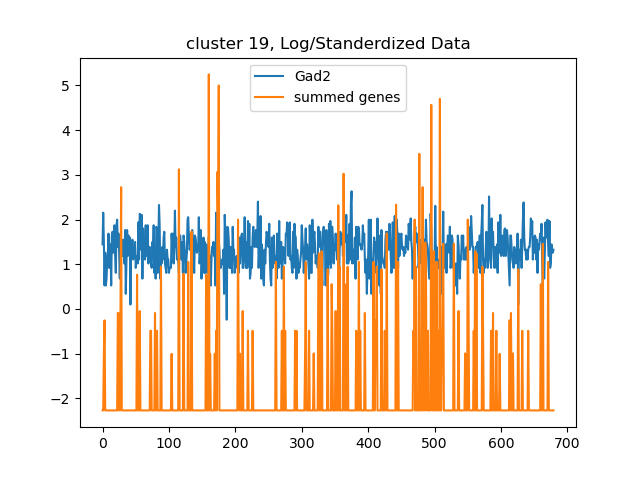

mean Gad2:  1.314203385328592
mean other:  -1.8038523415637144


In [213]:
#gene across selected cluster using log standerdized data (df_pre_linkage_ls/meta_data_df_pre_linkage)
gene = 'Gad2'
cluster = 19 #28,46,19

#check against other gene(s)
gene2 = exclude_markers_updated

#get gene row data
x = df_pre_linkage_ls.T.loc[gene,meta_data_df_pre_linkage.loc['cluster_label',:] == cluster]

if type(gene2) == str:
    q = df_pre_linkage_ls.T.loc[gene2,meta_data_df_pre_linkage.loc['cluster_label',:]==cluster]
    
    fig,ax = plt.subplots()
    plt.plot(np.array(x), label = gene)
    plt.plot(np.array(q), label = gene2)
    plt.legend()
    plt.title('cluster '+ str(cluster) + ', Log/Standerdized Data')
    plt.show()

else:
    print ('inputed multiple genes, summing before plotting...')
    q= df_pre_linkage_ls.T.loc[gene2,meta_data_df_pre_linkage.loc['cluster_label',:]==cluster].sum(axis = 0)
    
    fig,ax = plt.subplots()
    plt.plot(np.array(x), label = gene)
    plt.plot(np.array(q), label = 'summed genes')
    plt.legend()
    plt.title('cluster '+ str(cluster)+ ', Log/Standerdized Data')
    plt.show()

    
print ('mean ' + gene + ': ', np.mean(np.array(x)))
print ('mean other: ', np.mean(np.array(q)))


inputed multiple genes, summing before plotting...


<IPython.core.display.Javascript object>


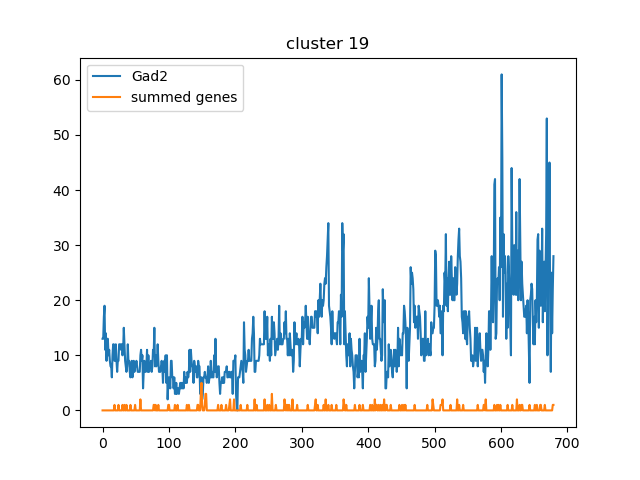

mean Gad2:  13.51764705882353
mean other:  0.2088235294117647


In [215]:
#gene across selected cluster using df_marker and meta_data_df
gene = 'Gad2'
cluster = 19 #28,46,19

#check against other gene(s)
gene2 = exclude_markers_updated

#get gene row data
x = df_marker.loc[gene,meta_data_df_post_linkage_intra_sorted.loc['cluster_label',:] == cluster]

if type(gene2) == str:
    q = df_marker.loc[gene2,meta_data_df_post_linkage_intra_sorted.loc['cluster_label',:]==cluster]
    
    fig,ax = plt.subplots()
    plt.plot(np.array(x), label = gene)
    plt.plot(np.array(q), label = gene2)
    plt.legend()
    plt.title('cluster '+ str(cluster))
    plt.show()

else:
    print ('inputed multiple genes, summing before plotting...')
    q= df_marker.loc[gene2,meta_data_df_post_linkage_intra_sorted.loc['cluster_label',:]==cluster].sum(axis = 0)
    
    fig,ax = plt.subplots()
    plt.plot(np.array(x), label = gene)
    plt.plot(np.array(q), label = 'summed genes')
    plt.legend()
    plt.title('cluster '+ str(cluster))
    plt.show()

print ('mean ' + gene + ': ', np.mean(np.array(x)))
print ('mean other: ', np.mean(np.array(q)))


In [216]:
#check with mu_g computed from compute_marker_means
print ('mean gad2: ', mu_g[np.where(linkage_cluster_order==19)[0][0]])
print ('mean nn: ', mu_nn[np.where(linkage_cluster_order==19)[0][0]])

mean gad2:  13.51764705882353
mean nn:  0.2088235294117647


In [217]:
type(exclude_markers_updated)

list

In [218]:
linkage_cluster_order

array([26, 23, 49, 35, 14, 31, 63, 32,  0, 61, 60,  4, 17, 62,  2, 59, 46,
       51, 66, 25, 41, 57, 54, 30, 24, 36,  5, 27,  1,  6,  8, 18, 65, 16,
       68, 43, 34, 58, 10,  3, 64, 28, 38, 45, 39, 44, 21,  7, 22, 12, 56,
       19, 48, 52, 53, 67,  9, 33, 40, 47, 20, 29, 55, 11, 50, 15, 13, 42,
       37], dtype=int32)

<IPython.core.display.Javascript object>


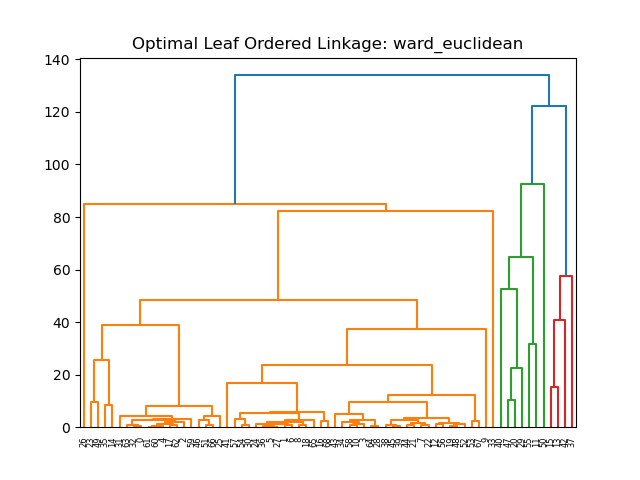

<IPython.core.display.Javascript object>


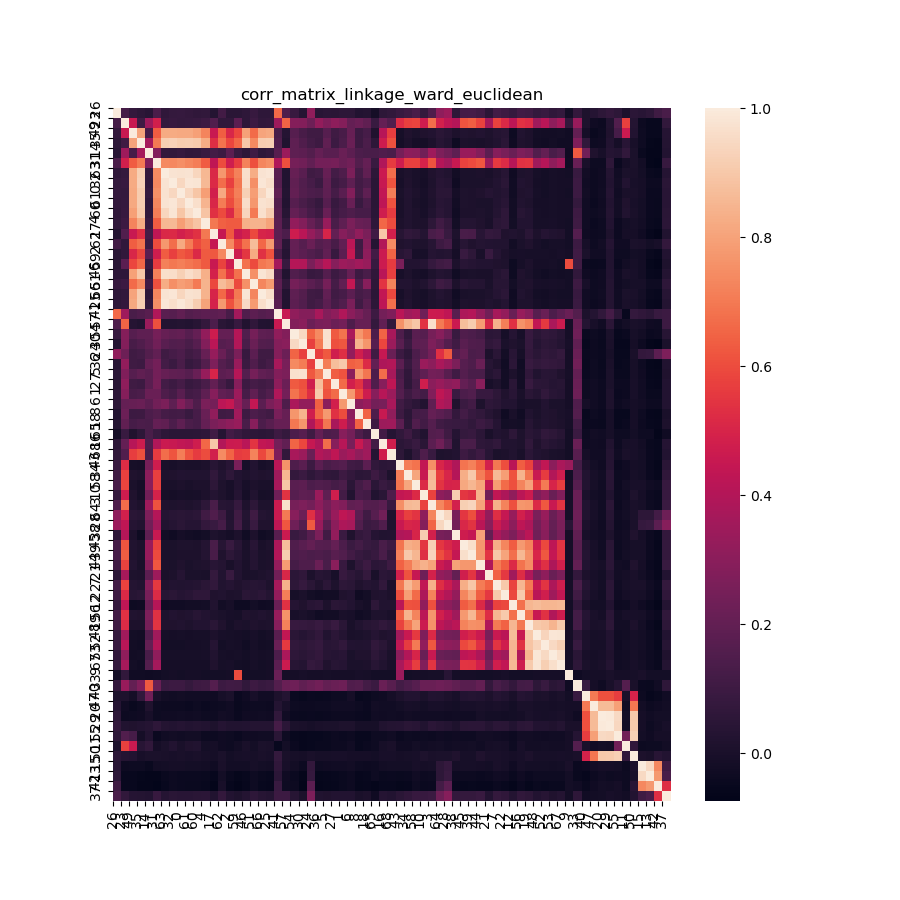

In [220]:
mean_per_gene_per_cluster_arr = np.zeros((len(df_marker_log_and_std_col.index),len(unique_labels)))
for idx, c in enumerate(zip(linkage_cluster_order,cluster_indices)):
    #compute mean expression for each cluster in linkage cluster order
    #print (idx)
    #print (c[0])
    cluster_mean_expr = np.mean(df_marker.loc[:,meta_data_df_post_linkage_intra_sorted.loc['cluster_label',:] == c[0]], axis = 1)
    #print (cluster_mean_expr)
    mean_per_gene_per_cluster_arr[:,idx] = cluster_mean_expr

mean_per_gene_per_cluster_df = pd.DataFrame(data = mean_per_gene_per_cluster_arr)
fig,ax = plt.subplots()
#plt.figure(figsize=(10,10))
ax.set_title('Optimal Leaf Ordered Linkage: ' + linkage_alg + '_' + dist_metric)
dn = dendrogram(Z_ordered)
plt.show()

fig,ax = plt.subplots(figsize = (9,9))
ax = sns.heatmap(mean_per_gene_per_cluster_df.corr())
ax.set_title('corr_matrix_linkage_'+linkage_alg+'_'+dist_metric)
ax.set_xticks(ticks = np.arange(0,len(linkage_cluster_order)), labels = linkage_cluster_order)
ax.set_yticks(ticks = np.arange(0,len(linkage_cluster_order)), labels = linkage_cluster_order)
#plt.savefig('corr_matrix_linkage_intra_sort_w_hr'+linkage_alg+'_'+dist_metric)
plt.show()

Check Distribution of 4 main groups of interest: M/F, Breeder/Naive

In [221]:
meta_data_df_mm.shape

(29, 40249)

In [222]:
meta_data_df_post_linkage_intra_sorted.shape

(28, 40249)

In [223]:
meta_data_df_mm.tail()

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,TGAGGGATCCTTACCG-1_10X37_2,CTCATCGGTAGTGATA-1_10X35_1,GATCATGTCGCTGACG-1_10X52_3,GTTACAGGTCCCTGTT-1_10X51_1,TGATTCTTCTTAATCC-1_10X52_3,GACATCACATAGGTTC-1_10X52_2,GTGAGGATCCCGAATA-1_10X51_3,...,TGGGATTTCGAACTCA-1_10X36_1,TGCATCCCACCTGATA-1_10X35_2,GAGTGAGAGGCTCCCA-1_10X52_3,TGTGGCGAGCCTCTGG-1_10X35_2,AGATGCTCAAAGGTTA-1_10X51_2,TTGATGGGTCCAGAAG-1_10X35_2,ACCTGTCAGTATTCCG-1_10X52_3,GCTTTCGTCACACGAT-1_10X51_3,GCGGAAAAGGTAGACC-1_10X36_2,ACATTTCGTACGAAAT-1_10X52_2
ngperul_seqlib,16.0,16.0,16.0,16.0,13.6,20.4(second prep),19.2,20.4(second prep),17.5,22.0,...,11.4,17.6,20.4(second prep),17.6,22.2,17.6,20.4(second prep),22.0,12.1,17.5
lengthbp_seqlib,460.0,460.0,460.0,460.0,416.0,507.0,478.0,507.0,440.0,487.0,...,476.0,461.0,507.0,461.0,474.0,461.0,507.0,487.0,486.0,440.0
Sample_Index,F9,F9,F9,F9,D9,F12,G1,F12,E12,B2,...,H8,G8,F12,G8,A2,G8,F12,B2,A9,E12
cluster_label,26,26,26,26,26,26,26,26,26,26,...,37,37,37,37,37,37,37,37,37,37
cell_class,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal


In [224]:
meta_data_df_post_linkage_intra_sorted.tail()

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,TGAGGGATCCTTACCG-1_10X37_2,CTCATCGGTAGTGATA-1_10X35_1,GATCATGTCGCTGACG-1_10X52_3,GTTACAGGTCCCTGTT-1_10X51_1,TGATTCTTCTTAATCC-1_10X52_3,GACATCACATAGGTTC-1_10X52_2,GTGAGGATCCCGAATA-1_10X51_3,...,TGGGATTTCGAACTCA-1_10X36_1,TGCATCCCACCTGATA-1_10X35_2,GAGTGAGAGGCTCCCA-1_10X52_3,TGTGGCGAGCCTCTGG-1_10X35_2,AGATGCTCAAAGGTTA-1_10X51_2,TTGATGGGTCCAGAAG-1_10X35_2,ACCTGTCAGTATTCCG-1_10X52_3,GCTTTCGTCACACGAT-1_10X51_3,GCGGAAAAGGTAGACC-1_10X36_2,ACATTTCGTACGAAAT-1_10X52_2
LIbConstructionComment,,,,,,,,,,,...,,,,,,,,,,
ngperul_seqlib,16.0,16.0,16.0,16.0,13.6,20.4(second prep),19.2,20.4(second prep),17.5,22.0,...,11.4,17.6,20.4(second prep),17.6,22.2,17.6,20.4(second prep),22.0,12.1,17.5
lengthbp_seqlib,460.0,460.0,460.0,460.0,416.0,507.0,478.0,507.0,440.0,487.0,...,476.0,461.0,507.0,461.0,474.0,461.0,507.0,487.0,486.0,440.0
Sample_Index,F9,F9,F9,F9,D9,F12,G1,F12,E12,B2,...,H8,G8,F12,G8,A2,G8,F12,B2,A9,E12
cluster_label,26,26,26,26,26,26,26,26,26,26,...,37,37,37,37,37,37,37,37,37,37


In [ ]:
arr_df_class,df_pre_linkage_ls.T

In [225]:
arr_df_class

,tsne-1,tsne-2,labels,cell_class
21705,12.032775,10.925328,0,Vglut1
27333,23.263556,14.461903,0,Vglut1
6566,19.542133,13.641470,0,Vglut1
36873,5.998463,-3.348662,0,Vglut1
27331,6.527515,1.948670,0,Vglut1
...,...,...,...,...
21955,1.456062,2.184921,68,Vglut1
30346,1.409461,1.859589,68,Vglut1
36224,2.130350,2.544449,68,Vglut1
5842,1.952635,1.886366,68,Vglut1


In [227]:
df_pre_linkage_ls.T

,GCGGATCTCTCTATGT-1_10X52_4,GCACGGTCACTCCACT-1_10X35_2,TTTGATCAGCGTTACT-1_10X51_1,CAGTGCGGTCGAGATG-1_10X36_2,GCACATATCCTATTTG-1_10X35_2,GCACATAAGAGAGCGG-1_10X35_2,CATACCCGTGAGTCAG-1_10X36_2,CTGAATGAGCAGATAT-1_10X51_4,CTGAGCGGTAGGTACG-1_10X51_4,GCAACCGAGGCTGTAG-1_10X35_2,...,CTTTCGGTCACGTAGT-1_10X52_4,GAGTTGTGTAACGCGA-1_10X35_2,TCTACCGAGCCGTTGC-1_10X36_2,GTCTAGAAGTATTGCC-1_10X51_3,CGAATTGTCACCATCC-1_10X35_1,GTCACTCTCCGGCAAC-1_10X52_4,GCGAGAATCCTACCGT-1_10X38_1,AAGACTCCAGTGTACT-1_10X36_2,TCAAGTGCATCTCCCA-1_10X51_1,TAACGACGTCTAACTG-1_10X37_2
gene,,,,,,,,,,,,,,,,,,,,,
Hbb-bs,-0.063512,-0.063512,-0.063512,-0.063512,-0.063512,-0.063512,-0.063512,-0.063512,-0.063512,-0.063512,...,-0.063512,-0.063512,-0.063512,-0.063512,-0.063512,-0.063512,-0.063512,-0.063512,-0.063512,-0.063512
Oxt,-0.098764,-0.098764,-0.098764,-0.098764,-0.098764,-0.098764,-0.098764,-0.098764,-0.098764,-0.098764,...,-0.098764,-0.098764,-0.098764,-0.098764,-0.098764,-0.098764,-0.098764,-0.098764,-0.098764,-0.098764
Avp,-0.182275,-0.182275,-0.182275,-0.182275,-0.182275,-0.182275,-0.182275,-0.182275,-0.182275,-0.182275,...,-0.182275,-0.182275,-0.182275,-0.182275,-0.182275,-0.182275,-0.182275,-0.182275,-0.182275,-0.182275
Plp1,-0.406017,2.230673,-0.406017,-0.406017,-0.406017,-0.406017,-0.406017,-0.406017,-0.406017,-0.406017,...,-0.406017,-0.406017,0.387706,0.387706,-0.406017,1.436950,-0.406017,-0.406017,0.387706,-0.406017
Hba-a1,-0.035357,-0.035357,-0.035357,-0.035357,-0.035357,-0.035357,-0.035357,-0.035357,-0.035357,-0.035357,...,-0.035357,-0.035357,-0.035357,-0.035357,-0.035357,-0.035357,-0.035357,-0.035357,-0.035357,-0.035357
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Rps27rt,-0.721071,-0.721071,0.767217,-0.721071,-0.721071,-0.721071,-0.721071,-0.721071,0.767217,-0.721071,...,-0.721071,-0.721071,-0.721071,-0.721071,0.767217,-0.721071,0.767217,0.767217,-0.721071,-0.721071
Prox1os,-0.226503,-0.226503,-0.226503,3.388269,-0.226503,-0.226503,-0.226503,-0.226503,-0.226503,-0.226503,...,-0.226503,-0.226503,-0.226503,-0.226503,-0.226503,-0.226503,-0.226503,-0.226503,-0.226503,-0.226503
Tmem47,0.718921,0.718921,-0.697193,-0.697193,-0.697193,-0.697193,-0.697193,-0.697193,-0.697193,-0.697193,...,-0.697193,-0.697193,-0.697193,2.135035,1.547294,1.547294,0.718921,-0.697193,0.718921,0.718921


In [228]:
meta_data_df_pre_linkage

,GCGGATCTCTCTATGT-1_10X52_4,GCACGGTCACTCCACT-1_10X35_2,TTTGATCAGCGTTACT-1_10X51_1,CAGTGCGGTCGAGATG-1_10X36_2,GCACATATCCTATTTG-1_10X35_2,GCACATAAGAGAGCGG-1_10X35_2,CATACCCGTGAGTCAG-1_10X36_2,CTGAATGAGCAGATAT-1_10X51_4,CTGAGCGGTAGGTACG-1_10X51_4,GCAACCGAGGCTGTAG-1_10X35_2,...,CTTTCGGTCACGTAGT-1_10X52_4,GAGTTGTGTAACGCGA-1_10X35_2,TCTACCGAGCCGTTGC-1_10X36_2,GTCTAGAAGTATTGCC-1_10X51_3,CGAATTGTCACCATCC-1_10X35_1,GTCACTCTCCGGCAAC-1_10X52_4,GCGAGAATCCTACCGT-1_10X38_1,AAGACTCCAGTGTACT-1_10X36_2,TCAAGTGCATCTCCCA-1_10X51_1,TAACGACGTCTAACTG-1_10X37_2
Serial_Number,104.0,64.0,97.0,66.0,64.0,64.0,66.0,100.0,100.0,64.0,...,104.0,64.0,66.0,99.0,63.0,104.0,69.0,66.0,97.0,68.0
Date_Captured,05/31/20,2019-11-20,05/31/20,2019-11-24,2019-11-20,2019-11-20,2019-11-24,05/31/20,05/31/20,2019-11-20,...,05/31/20,2019-11-20,2019-11-24,05/31/20,2019-11-20,05/31/20,2019-12-01,2019-11-24,05/31/20,2019-11-25
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,C57Bl/6,,C57Bl/6,,,,,C57Bl/6,C57Bl/6,,...,C57Bl/6,,,C57Bl/6,,C57Bl/6,,,C57Bl/6,
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Breeder-M,Naïve-F,Breeder-F,Naïve-M,Naïve-F,Naïve-F,Naïve-M,Breeder-M,Breeder-M,Naïve-F,...,Breeder-M,Naïve-F,Naïve-M,Breeder-M,Naïve-F,Breeder-M,Naïve-F,Naïve-M,Breeder-F,Naïve-M
ChipID,10X52,10X35,10X51,10X36,10X35,10X35,10X36,10X51,10X51,10X35,...,10X52,10X35,10X36,10X51,10X35,10X52,10X38,10X36,10X51,10X37
SampleID,10X52_4,10X35_2,10X51_1,10X36_2,10X35_2,10X35_2,10X36_2,10X51_4,10X51_4,10X35_2,...,10X52_4,10X35_2,10X36_2,10X51_3,10X35_1,10X52_4,10X38_1,10X36_2,10X51_1,10X37_2
DonorID,DI-B3-M,"DI1,DI2",DI-B1-F,DI3,"DI1,DI2","DI1,DI2",DI3,DI-B1-M,DI-B1-M,"DI1,DI2",...,DI-B3-M,"DI1,DI2",DI3,DI-B1-M,"DI1,DI2",DI-B3-M,DI6,DI3,DI-B1-F,"DI4,DI5"


<IPython.core.display.Javascript object>


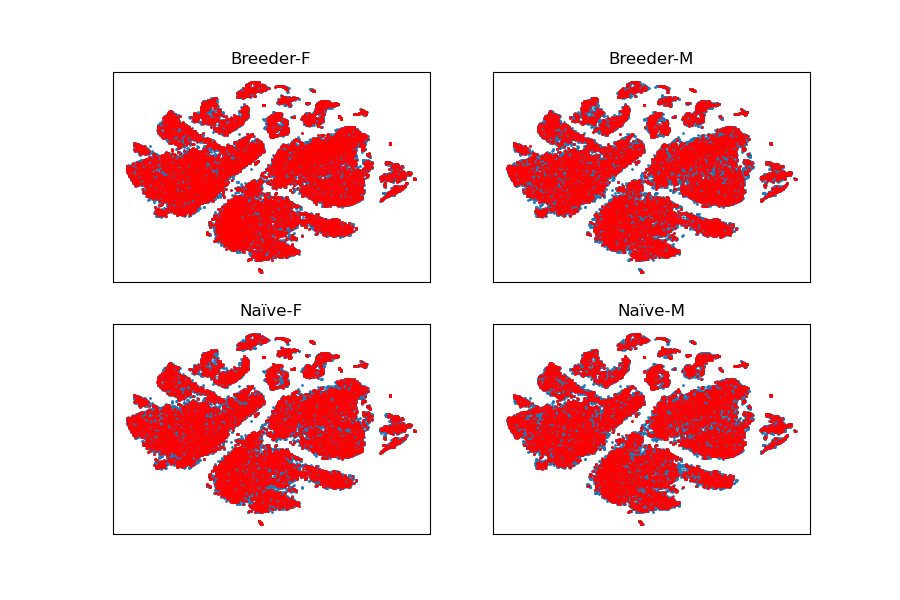

In [272]:
grps = list(set(np.array(meta_data_df_pre_linkage.loc['Group',:])))

fig,ax = plt.subplots(2,2, figsize = (9,6), sharex=True, sharey=True)

result_lst = []
for g in grps:
    fil = np.array(meta_data_df_pre_linkage.loc['Group',:] == g)
    result = np.vstack(list(compress(arr_tsne,fil)))
    result_lst.append(result)

    
ax[0,0].scatter(arr_tsne[:, 0], arr_tsne[:, 1], s = 1)
ax[0,0].scatter(result_lst[0][:,0], result_lst[0][:,1], s = 1, c = 'r')
ax[0,0].set_title(grps[0])

ax[0,1].scatter(arr_tsne[:, 0], arr_tsne[:, 1], s = 1)
ax[0,1].scatter(result_lst[1][:,0], result_lst[1][:,1], s = 1, c = 'r')
ax[0,1].set_title(grps[1])

ax[-1,0].scatter(arr_tsne[:, 0], arr_tsne[:, 1], s = 1)
ax[-1,0].scatter(result_lst[2][:,0], result_lst[2][:,1], s = 1, c = 'r')
ax[-1,0].set_title(grps[2])

ax[-1,1].scatter(arr_tsne[:, 0], arr_tsne[:, 1], s = 1)
ax[-1,1].scatter(result_lst[3][:,0], result_lst[3][:,1], s = 1, c = 'r')
ax[-1,1].set_title(grps[3])

# Remove x and y ticks from all subplots
for ax_row in ax:
    for axis in ax_row:
        axis.set_xticks([])
        axis.set_yticks([])

Stacked Bar Plot for each cluster

In [276]:
linkage_cluster_order

array([26, 23, 49, 35, 14, 31, 63, 32,  0, 61, 60,  4, 17, 62,  2, 59, 46,
       51, 66, 25, 41, 57, 54, 30, 24, 36,  5, 27,  1,  6,  8, 18, 65, 16,
       68, 43, 34, 58, 10,  3, 64, 28, 38, 45, 39, 44, 21,  7, 22, 12, 56,
       19, 48, 52, 53, 67,  9, 33, 40, 47, 20, 29, 55, 11, 50, 15, 13, 42,
       37], dtype=int32)

In [282]:
meta_data_df_pre_linkage.loc['cluster_label'] == 26

GCGGATCTCTCTATGT-1_10X52_4    False
GCACGGTCACTCCACT-1_10X35_2    False
TTTGATCAGCGTTACT-1_10X51_1    False
CAGTGCGGTCGAGATG-1_10X36_2    False
GCACATATCCTATTTG-1_10X35_2    False
                              ...  
GTCACTCTCCGGCAAC-1_10X52_4    False
GCGAGAATCCTACCGT-1_10X38_1    False
AAGACTCCAGTGTACT-1_10X36_2    False
TCAAGTGCATCTCCCA-1_10X51_1    False
TAACGACGTCTAACTG-1_10X37_2    False
Name: cluster_label, Length: 40249, dtype: bool

In [283]:
np.where(meta_data_df_pre_linkage.loc['cluster_label'] == 26)[0]

array([34484, 34485, 34486, 34487, 34488, 34489, 34490, 34491, 34492,
       34493, 34494, 34495, 34496, 34497, 34498, 34499, 34500, 34501,
       34502, 34503, 34504, 34505, 34506, 34507, 34508, 34509, 34510,
       34511, 34512, 34513, 34514, 34515, 34516, 34517, 34518, 34519,
       34520, 34521, 34522, 34523, 34524, 34525, 34526, 34527, 34528,
       34529, 34530, 34531, 34532, 34533, 34534, 34535, 34536, 34537,
       34538, 34539, 34540, 34541, 34542, 34543, 34544, 34545, 34546,
       34547, 34548, 34549, 34550, 34551, 34552, 34553, 34554, 34555,
       34556, 34557, 34558, 34559, 34560, 34561, 34562, 34563, 34564,
       34565, 34566, 34567, 34568, 34569, 34570, 34571, 34572, 34573,
       34574, 34575, 34576, 34577, 34578, 34579, 34580, 34581, 34582,
       34583, 34584, 34585, 34586, 34587, 34588, 34589, 34590, 34591,
       34592, 34593, 34594, 34595, 34596, 34597, 34598, 34599, 34600,
       34601, 34602, 34603, 34604, 34605, 34606, 34607, 34608, 34609,
       34610, 34611,

In [296]:
x = meta_data_df_pre_linkage.iloc[:,np.where(meta_data_df_pre_linkage.loc['cluster_label'] == 26)[0]]

In [297]:
x

,TCTACCGTCGGCTTGG-1_10X37_1,TCAGGGCGTCTTGTCC-1_10X52_4,CACTGAACACATAACC-1_10X35_1,GTAGTACCAATCAAGA-1_10X37_2,GTCTGTCCAACGACAG-1_10X51_4,TAGACTGAGCTTGTGT-1_10X37_2,CCACGTTAGCCTGCCA-1_10X52_4,AGGTAGGCAAACTAGA-1_10X52_2,TCTTTGATCTACGGTA-1_10X36_1,GTTACAGGTCCCTGTT-1_10X51_1,...,TGGAGGACAGTGTATC-1_10X36_2,TGTAACGGTATTCTCT-1_10X36_1,CGGGTCACACACCTAA-1_10X37_2,TGTAGACTCATGTCTT-1_10X52_2,CAGGCCAGTGAGTAGC-1_10X37_1,TAACTTCTCCCAGTGG-1_10X37_1,GGTAGAGAGTCTAGCT-1_10X37_1,TGTCAGACACACGGTC-1_10X52_2,ACTTTCAAGGAATTAC-1_10X51_4,CGTAAGTGTAGATCGG-1_10X37_2
Serial_Number,67.0,104.0,63.0,68.0,100.0,68.0,104.0,102.0,65.0,97.0,...,66.0,65.0,68.0,102.0,67.0,67.0,67.0,102.0,100.0,68.0
Date_Captured,2019-11-25,05/31/20,2019-11-20,2019-11-25,05/31/20,2019-11-25,05/31/20,05/31/20,2019-11-24,05/31/20,...,2019-11-24,2019-11-24,2019-11-25,05/31/20,2019-11-25,2019-11-25,2019-11-25,05/31/20,05/31/20,2019-11-25
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,,C57Bl/6,,,C57Bl/6,,C57Bl/6,C57Bl/6,,C57Bl/6,...,,,,C57Bl/6,,,,C57Bl/6,C57Bl/6,
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Naïve-M,Breeder-M,Naïve-F,Naïve-M,Breeder-M,Naïve-M,Breeder-M,Breeder-F,Naïve-M,Breeder-F,...,Naïve-M,Naïve-M,Naïve-M,Breeder-F,Naïve-M,Naïve-M,Naïve-M,Breeder-F,Breeder-M,Naïve-M
ChipID,10X37,10X52,10X35,10X37,10X51,10X37,10X52,10X52,10X36,10X51,...,10X36,10X36,10X37,10X52,10X37,10X37,10X37,10X52,10X51,10X37
SampleID,10X37_1,10X52_4,10X35_1,10X37_2,10X51_4,10X37_2,10X52_4,10X52_2,10X36_1,10X51_1,...,10X36_2,10X36_1,10X37_2,10X52_2,10X37_1,10X37_1,10X37_1,10X52_2,10X51_4,10X37_2
DonorID,"DI4,DI5",DI-B3-M,"DI1,DI2","DI4,DI5",DI-B1-M,"DI4,DI5",DI-B3-M,DI-B3-F,DI3,DI-B1-F,...,DI3,DI3,"DI4,DI5",DI-B3-F,"DI4,DI5","DI4,DI5","DI4,DI5",DI-B3-F,DI-B1-M,"DI4,DI5"


In [300]:
len(np.where(x.loc['Group'] == grps[0])[0])

44

In [ ]:
#intialize dataframe to store number of cells corresponding to each group for each cluster

In [291]:
grps

['Breeder-F', 'Breeder-M', 'Naïve-F', 'Naïve-M']

In [292]:
grp_cts_per_cluster_df = pd.DataFrame(index = linkage_cluster_order, columns = grps)
grp_cts_per_cluster_df

,Breeder-F,Breeder-M,Naïve-F,Naïve-M
26,NaN,NaN,NaN,NaN
23,NaN,NaN,NaN,NaN
49,NaN,NaN,NaN,NaN
35,NaN,NaN,NaN,NaN
14,NaN,NaN,NaN,NaN
...,...,...,...,...
50,NaN,NaN,NaN,NaN
15,NaN,NaN,NaN,NaN
13,NaN,NaN,NaN,NaN
42,NaN,NaN,NaN,NaN


In [316]:
grp_cts_per_cluster_df.loc[26,'Breeder-F'] = 2

In [317]:
grp_cts_per_cluster_df

,Breeder-F,Breeder-M,Naïve-F,Naïve-M
26,2,1,1,1
23,NaN,NaN,NaN,NaN
49,NaN,NaN,NaN,NaN
35,NaN,NaN,NaN,NaN
14,NaN,NaN,NaN,NaN
...,...,...,...,...
50,NaN,NaN,NaN,NaN
15,NaN,NaN,NaN,NaN
13,NaN,NaN,NaN,NaN
42,NaN,NaN,NaN,NaN


In [310]:
grp_cts_per_cluster_df.iloc[26,:]

Breeder-F    1
Breeder-M    1
Naïve-F      1
Naïve-M      1
Name: 5, dtype: object

In [323]:
linkage_cluster_order

array([26, 23, 49, 35, 14, 31, 63, 32,  0, 61, 60,  4, 17, 62,  2, 59, 46,
       51, 66, 25, 41, 57, 54, 30, 24, 36,  5, 27,  1,  6,  8, 18, 65, 16,
       68, 43, 34, 58, 10,  3, 64, 28, 38, 45, 39, 44, 21,  7, 22, 12, 56,
       19, 48, 52, 53, 67,  9, 33, 40, 47, 20, 29, 55, 11, 50, 15, 13, 42,
       37], dtype=int32)

In [326]:
grps = list(set(np.array(meta_data_df_pre_linkage.loc['Group',:])))
grp_cts_per_cluster_df = pd.DataFrame(index = linkage_cluster_order, columns = grps)
for c in linkage_cluster_order:
    #get subset of cells of cluster c
    subset = meta_data_df_pre_linkage.iloc[:, np.where(meta_data_df_pre_linkage.loc['cluster_label']==c)[0]]
    #print (c)
    #print (subset.shape)
    #loop over each group within cluster subset, add number of cells to cts dataframe 
    for g in grps:
        #print (g)
        #print (len(np.where(subset.loc['Group'] == g)[0]))
        grp_cts_per_cluster_df.loc[c,g] = len(np.where(subset.loc['Group'] == g)[0])
        
    #if c == 49:
        #break
    
    

In [327]:
grp_cts_per_cluster_df

,Breeder-F,Breeder-M,Naïve-F,Naïve-M
26,44,45,44,68
23,155,58,88,86
49,24,31,28,26
35,11,15,10,9
14,104,31,179,82
...,...,...,...,...
50,12,9,13,21
15,105,68,144,133
13,165,132,130,155
42,32,27,28,29


<IPython.core.display.Javascript object>


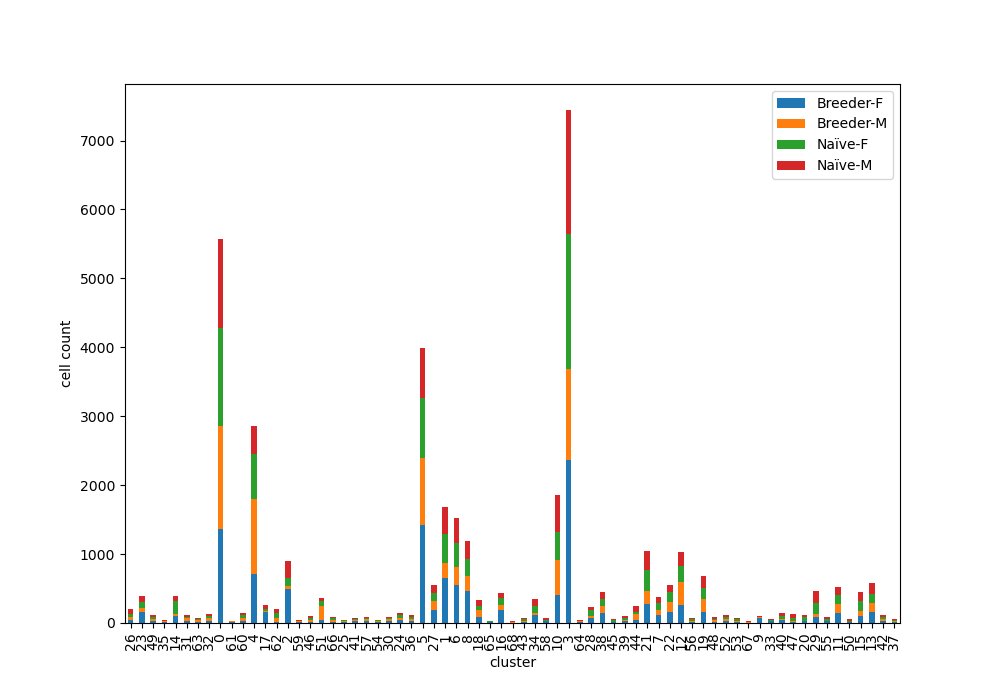

<Axes: xlabel='cluster', ylabel='cell count'>

In [333]:
grp_cts_per_cluster_df.plot(kind = 'bar', stacked = 'True', figsize = (10,7), xlabel = 'cluster', ylabel = 'cell count')

Min max normalize to 1 per cluster

In [369]:
grp_cts_per_cluster_df_norm = grp_cts_per_cluster_df.copy()

In [370]:
grp_cts_per_cluster_df_norm

,Breeder-F,Breeder-M,Naïve-F,Naïve-M
26,44,45,44,68
23,155,58,88,86
49,24,31,28,26
35,11,15,10,9
14,104,31,179,82
...,...,...,...,...
50,12,9,13,21
15,105,68,144,133
13,165,132,130,155
42,32,27,28,29


In [371]:
#normalize to 1 per cluster (divide each row value by sum of row)
for row in grp_cts_per_cluster_df_norm.index:
    #print (grp_cts_per_cluster_df_norm.loc[row])
    grp_cts_per_cluster_df_norm.loc[row] = (grp_cts_per_cluster_df_norm.loc[row])/ (grp_cts_per_cluster_df_norm.loc[row].sum()) 

In [372]:
grp_cts_per_cluster_df_norm

,Breeder-F,Breeder-M,Naïve-F,Naïve-M
26,0.218905,0.223881,0.218905,0.338308
23,0.400517,0.149871,0.22739,0.222222
49,0.220183,0.284404,0.256881,0.238532
35,0.244444,0.333333,0.222222,0.2
14,0.262626,0.078283,0.45202,0.207071
...,...,...,...,...
50,0.218182,0.163636,0.236364,0.381818
15,0.233333,0.151111,0.32,0.295556
13,0.283505,0.226804,0.223368,0.266323
42,0.275862,0.232759,0.241379,0.25


<IPython.core.display.Javascript object>


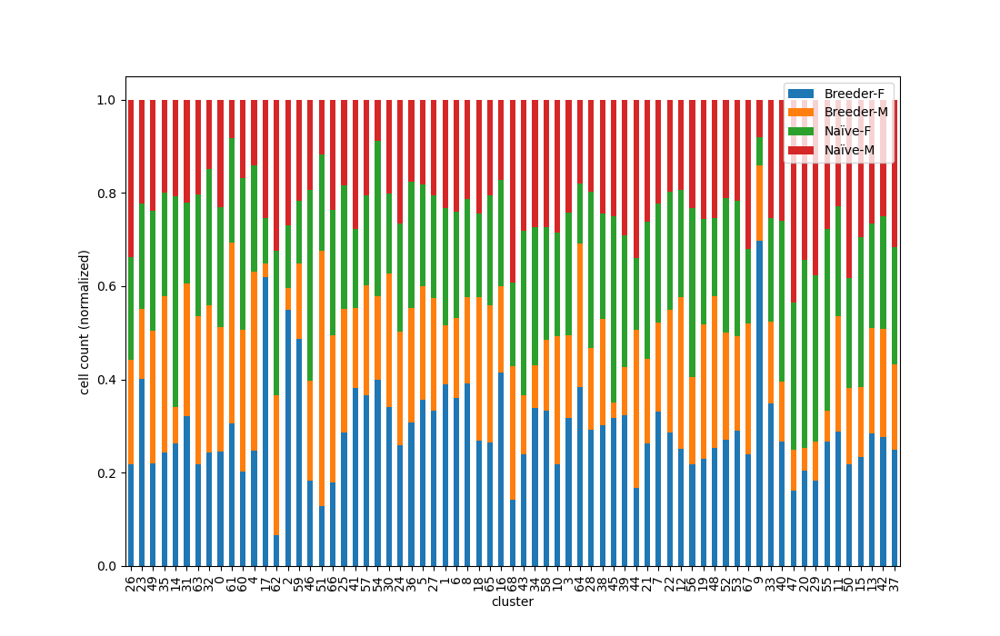

<Axes: xlabel='cluster', ylabel='cell count (normalized)'>

In [375]:
grp_cts_per_cluster_df_norm.plot(kind = 'bar', stacked = 'True', figsize = (11,7), xlabel = 'cluster', ylabel = 'cell count (normalized)')

In [ ]:
#replot with seq cluster labels

In [74]:
with open('/bigdata/isaac/combined_metadatadf_plis_filtered_markers.json') as json_data:
    sd_metadata = json.load(json_data)
sd_metadata = pd.DataFrame.from_dict(sd_metadata, orient='columns')

Total cells reduced from 79613 to 60256
num m cells: 27252 num f cells: 33004


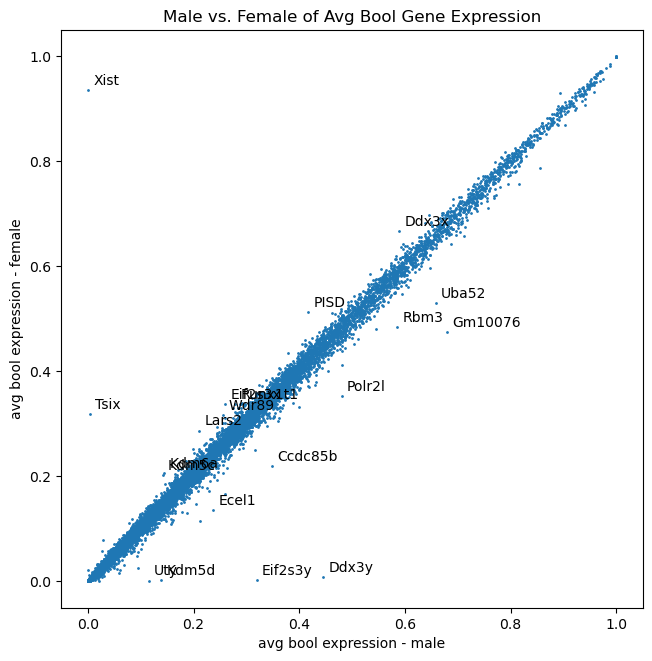

Total genes reduced from 27933 to 18131


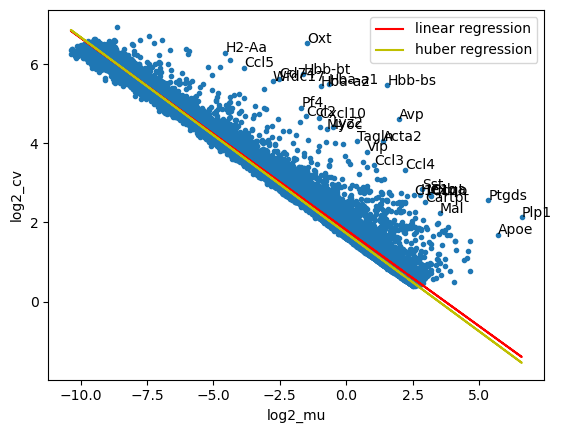

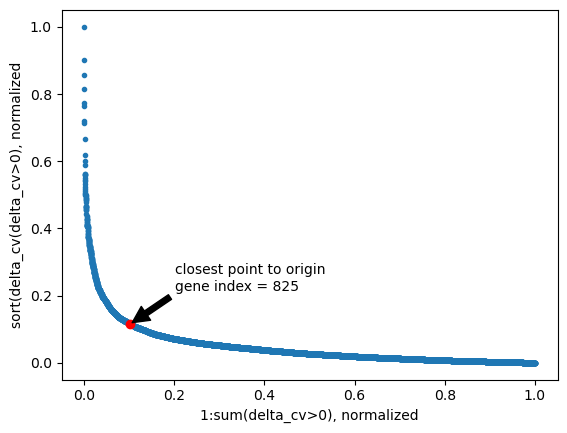

column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


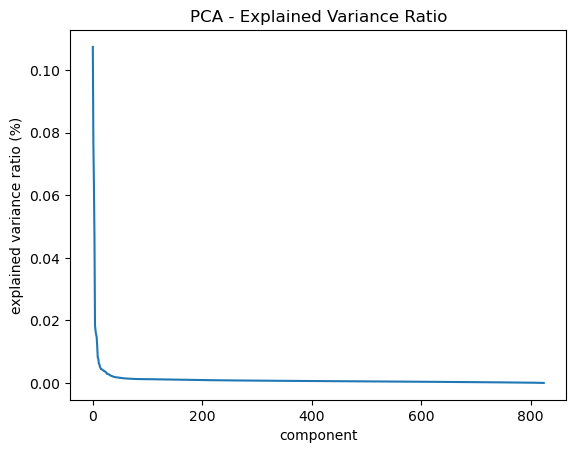

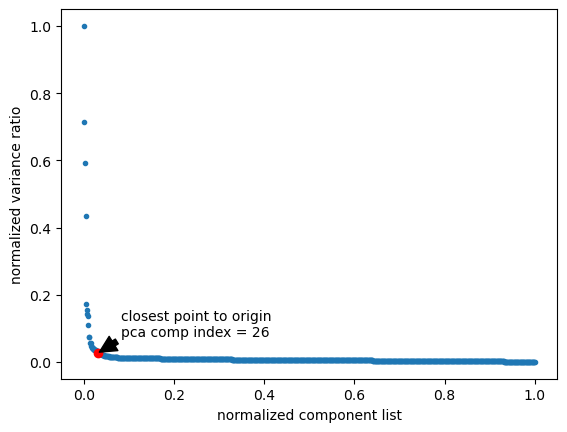

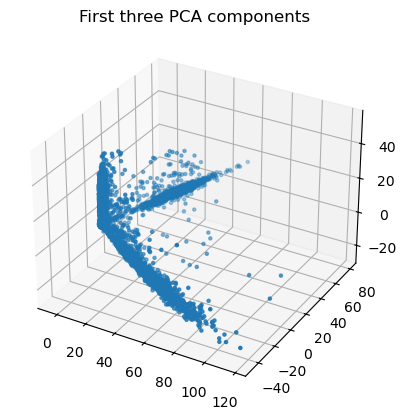

2025-04-14 14:24:27,604 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-04-14 14:24:32,014 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-04-14 14:24:32,403 - harmonypy - INFO - Iteration 1 of 10
2025-04-14 14:24:52,661 - harmonypy - INFO - Iteration 2 of 10
2025-04-14 14:25:17,196 - harmonypy - INFO - Iteration 3 of 10
2025-04-14 14:25:44,448 - harmonypy - INFO - Iteration 4 of 10
2025-04-14 14:26:05,675 - harmonypy - INFO - Iteration 5 of 10
2025-04-14 14:26:26,192 - harmonypy - INFO - Iteration 6 of 10
2025-04-14 14:26:46,328 - harmonypy - INFO - Iteration 7 of 10
2025-04-14 14:27:07,157 - harmonypy - INFO - Iteration 8 of 10
2025-04-14 14:27:26,122 - harmonypy - INFO - Iteration 9 of 10
2025-04-14 14:27:44,996 - harmonypy - INFO - Converged after 9 iterations


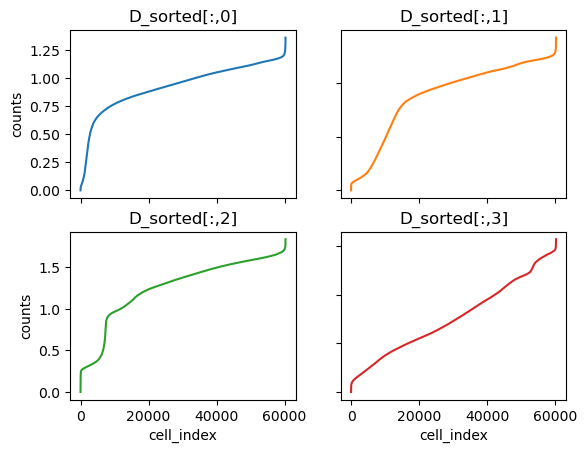

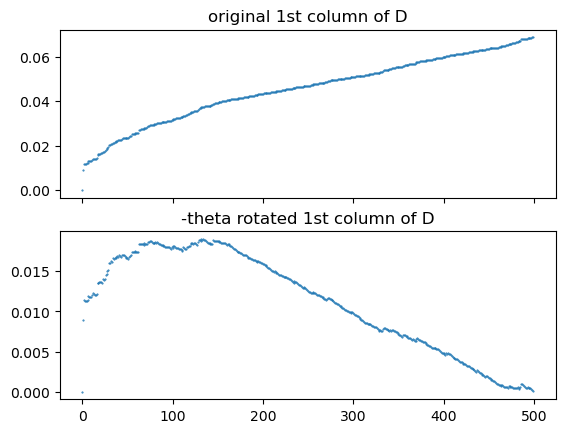

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 5021
early_exaggeration: 20
init: pca
perplexity: 57.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


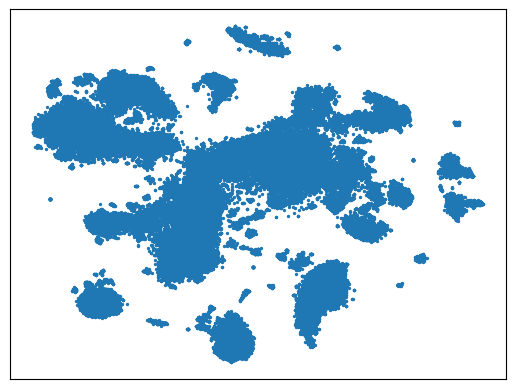

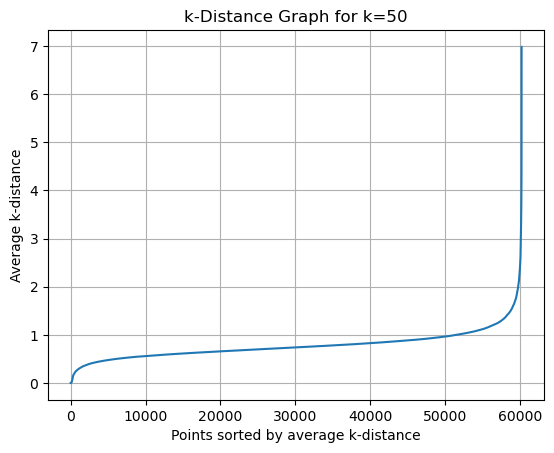

The knee is at x = 58671, y = 1.4711413713091912


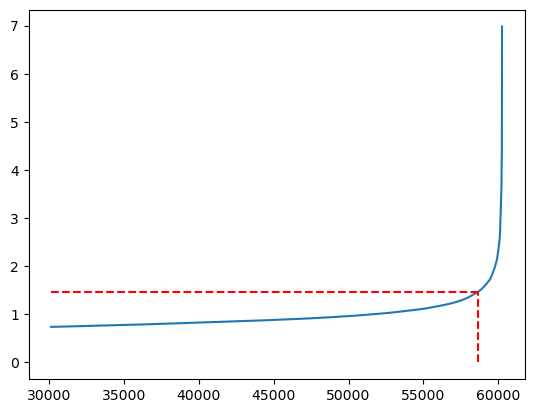

NameError: name 'minpts' is not defined

In [ ]:
%matplotlib inline

meta_data_df, df_orig, df_bool, status_df = dp.load_data(metadata_file = '/bigdata/isaac/meta_data_dict_040224.json', 
                                                         bigdata_file = '/bigdata/isaac/dimorph_df.feather')

df, df_bool, meta_data_df, status_df = dp.cell_exclusion(threshold_m = 2000, 
                                                      threshold_g = 1000,
                                                      meta_data_df = meta_data_df,
                                                      df_bool = df_bool,
                                                      df = df_orig,
                                                      status_df = status_df)

avg_bool_mf_df_sorted_l2 = dp.avg_bool_gene_expression_by_sex(df_bool = df_bool,
                                                              meta_data_df=meta_data_df,
                                                             num_top_genes=10,
                                                             plot_flag=1)

df_ge, df_bool, meta_data_df, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                      percent_cell_upper_bound=50,
                                                     df_bool=df_bool,
                                                     df = df,
                                                     meta_data_df = meta_data_df,
                                                     status_df = status_df)
cv_df,df_n = dp.analyze_cv(df = df_ge,
                      norm_scale_factor=20000,
                      num_top_genes=30,
                      plot_flag=1,
                     use_huber = True)

gene_index, df, status_df = dp.get_top_cv_genes(df = df_ge, cv_df=cv_df, plot_flag=1, status_df=status_df)

log_std_arr,status_df = dp.log_and_standerdize_df(df,status_df)

df_ls = pd.DataFrame(data = log_std_arr.T, index = df.index, columns=df.columns)

pca_index, arr_pca, status_df = dp.analyze_pca(arr = log_std_arr, #log_std_arr
                                               n_components=log_std_arr.shape[1], #log_std_arr.shape[1]
                                               optimize_n=True,
                                               plot_flag=1, 
                                               status_df=status_df)

meta_data_df_pca = meta_data_df.T.copy()
vars_use = ['SampleID']
ho = hm.run_harmony(arr_pca,meta_data_df_pca,vars_use)

hm_arr = ho.Z_corr.T

perplexity,status_df = dp.get_perplexity(pca_arr = hm_arr, cutoff=500, plot_flag=1, status_df = status_df)

#use parameters from FC paper/art of tsne paper
arr_tsne,status_df = dp.do_tsne(arr = hm_arr, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=hm_arr.shape[0]//12,
                               early_exaggeration=20,
                               init='pca', 
                               perplexity = perplexity,
                               metric='correlation',
                               status_df = status_df)

epsilon = dp.optimal_eps(arr_tsne, 20)
#epsilon, minpts, status_df = dp.compute_eps(minpts = 50, eps_prc=90, arr= arr_tsne, status_df = status_df)
minpts = 20
labels, n_clusters_, arr_df, status_df = dp.do_dbscan(epsilon = epsilon, minpts = minpts, arr = arr_tsne, status_df = status_df)

cluster_pts = dp.histogram_pts_per_cluster(labels, minpts=minpts)

df_pre_linkage_ls, meta_data_df_pre_linkage, unique_labels = dp.sort_by_cluster_label(df_ls,meta_data_df,arr_df,labels)

linkage_alg = 'ward'
dist_metric = 'euclidean'

df_pre_linkage_ls = df_pre_linkage_ls.T

df_post_linkage, meta_data_df_post_linkage, linkage_cluster_order, Z_ordered, mpg_pca, linkage_cluster_order_po = dp.inter_cluster_sort(df_pre_linkage_ls,
                                                 meta_data_df_pre_linkage, 
                                                 unique_labels,
                                                 n_components = 10, 
                                                 linkage_alg = linkage_alg,
                                                 dist_metric = dist_metric)

df_s = df.reindex(columns = df_post_linkage.columns)

df_post_linkage_intra_sorted, meta_data_df_post_linkage_intra_sorted, cluster_indices = dp.intra_cluster_sort(df_s, meta_data_df_post_linkage, linkage_cluster_order)

marker_genes_sorted, pos, ind, ind_s, mgs = dp.compute_marker_genes(df_post_linkage_intra_sorted,
                                                meta_data_df_post_linkage_intra_sorted,
                                                cluster_indices,
                                                linkage_cluster_order,
                                                '/bigdata/isaac/',
                                                n_markers=5,
                                                class_score_name='NN_level1')

tg, tgfs = dp.get_heatmap_labels(mgs, ind, ind_s)

df_marker = df_post_linkage_intra_sorted.loc[marker_genes_sorted,:]

marker_log_and_std_arr, status_df = dp.log_and_standerdize_df(df_marker,status_df, log = False)

df_marker_log_and_std = pd.DataFrame(index = df_marker.index, columns=df_post_linkage_intra_sorted.columns, data = marker_log_and_std_arr.T)

df_marker_log_and_std_col = pd.DataFrame(data = df_marker_log_and_std.to_numpy(), 
                                         index = df_marker_log_and_std.index,
                                        columns = list(meta_data_df_post_linkage_intra_sorted.loc['cluster_label',:]))

change_indices = dp.get_heatmap_cluster_borders(meta_data_df_post_linkage_intra_sorted)

fs_w = dp.compute_fs_waterfall(marker_genes_sorted)

dp.plot_marker_heatmap(df_marker_log_and_std_col, 
                       pos, 
                       linkage_cluster_order, 
                       change_indices, 
                       tg, 
                       tgfs, 
                       linkage_alg,
                       dist_metric,
                       folder = '/bigdata/isaac/',
                       fs_waterfall=fs_w,
                       cell_class = 'NN_L1',
                       savefig = True)


Vglut1_marker = 'Slc17a7'

Vglut2_marker = 'Slc17a6'

GABA_marker = 'Gad2'

exclude_markers = ['C1qc','C1qa','C1qb','Gja1','Cx3cr1','Acta2','Ly6c1',
                   'Mfge8','Plxnb3','Cldn11','Aqp4','Vtn','Cldn5',
                   'Pdgfrb','Flt1','Slc25a18','Pdgfra','Foxj1',
                   'Olig1','Olig2','Sox10','Hbb-bs','Hbb-bt',
                   'Hba-a2','Ttr']

m_factor = 2 

exclude_markers_updated = []
for g in exclude_markers:
    print (g, g in df_marker.index)
    if g in df_marker.index:
        exclude_markers_updated.append(g)

df_ex_marker = df_pre_linkage_ls.loc[exclude_markers_updated,:]
nonneuro = df_ex_marker.sum(axis = 0)

mu_g, mu_vg1, mu_vg2, mu_nn, std_g, std_vg1,std_vg2,std_nn, labels_to_class_map, meta_data_df_mm = dp.compute_marker_means(
                     GABA_marker,
                     Vglut1_marker,
                     Vglut2_marker,
                     exclude_markers_updated,
                     df_marker,
                     meta_data_df_post_linkage_intra_sorted,
                     linkage_cluster_order,
                     m_factor)

s_bool,bn_bool, gaba_bool, doublet_bool, vglut1_bool, vglut2_bool, nonneuronal_bool = dp.get_boolean_vecs(meta_data_df_mm)

arr_df_class, arr_xy = dp.plot_cell_class(arr_df,labels_to_class_map,labels)

running dbscan with epsilon: 1.4711413713091912  and minpts: 20
Estimated number of clusters: 88
Estimated number of noise points: 1991


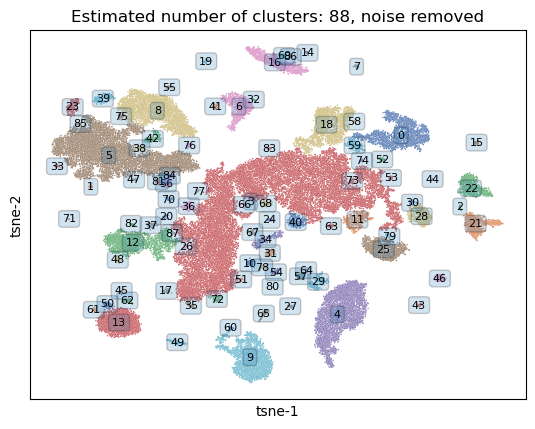

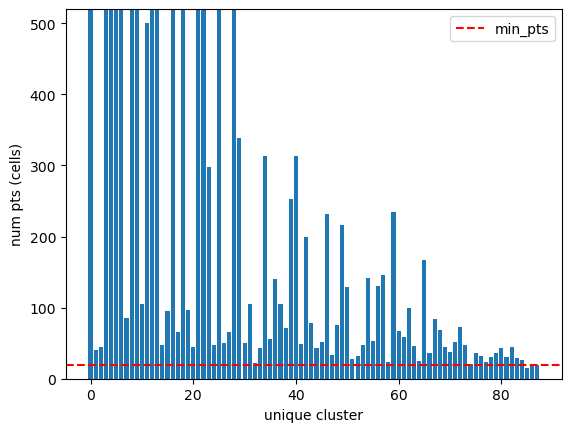

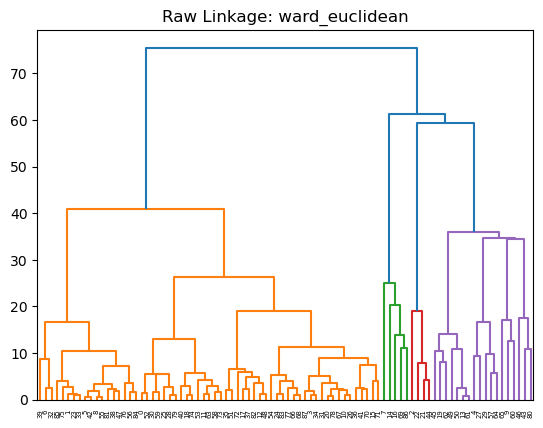

[28 79 25 30 59  0 52 74 18 40 11 63 73 58 53 72 48 12 82 37 17 51 35 31
 20 78 10 26 67 34  3 87 70 41 36 71 15 83 24 68 66 77 54 76 84 56 81 38
 47  5 42  8 55  1 33 23 75 85 39  6 32 49 13 61 50 19 62 45 27  4 29 57
 64 60  9 65 80 43 46 22 44 21  2 14 16 69 86  7]


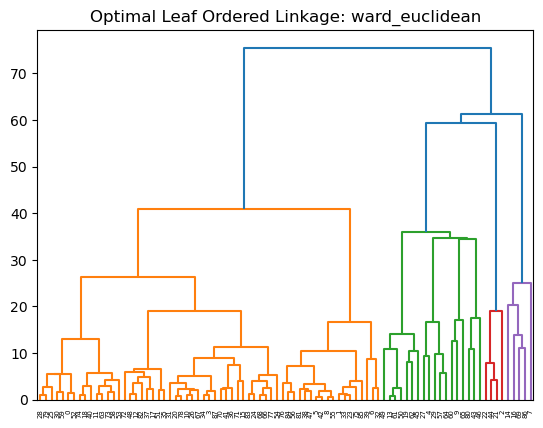

metadata df shape post inter cluster sort
(28, 58265)
len marker_Genes_sorted 280
len marker_genes_sorted_final 280
[0, 1, 2, 5, 6, 8, 10, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 31, 33, 35, 36, 42, 43, 45, 47, 51, 52, 54, 56, 57, 60, 61, 62, 63, 64, 65, 67, 68, 69, 72, 74, 75, 76, 77, 78, 80, 81, 82, 83, 84, 85, 86, 87]
53
[array([ 5, 26, 14, 27,  2,  4,  1, 16, 53]), array([15, 10, 18]), array([11,  8,  9, 12,  7, 13]), array([25, 17, 21, 23, 22, 20, 52]), array([19, 24]), array([33]), array([31, 48]), array([34, 58]), array([ 6, 37, 61, 56, 60, 59, 32]), array([95, 65]), array([70, 45, 29, 96, 67, 51, 69]), array([121,  28,  76,  35,  74,  73,  72,  64]), array([ 77, 102,  92]), array([80, 81, 49, 50, 82, 63]), array([36]), array([85, 86, 94]), array([66]), array([97, 99]), array([108, 101,  93, 109]), array([114, 113, 126, 111, 112, 115]), array([ 54,  55, 116, 117]), array([123,   3,  78]), array([125]), array([130]), array([134, 131, 136,   0]), array([141]), array([140]), array(

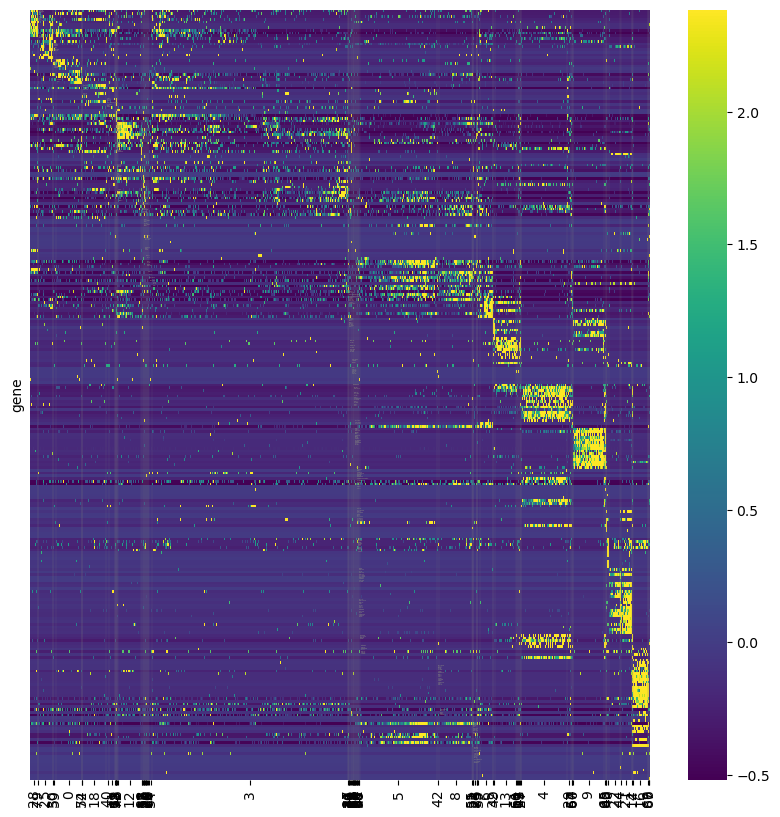

C1qc False
C1qa True
C1qb True
Gja1 True
Cx3cr1 True
Acta2 True
Ly6c1 True
Mfge8 True
Plxnb3 False
Cldn11 True
Aqp4 True
Vtn True
Cldn5 True
Pdgfrb False
Flt1 True
Slc25a18 True
Pdgfra True
Foxj1 False
Olig1 False
Olig2 True
Sox10 True
Hbb-bs True
Hbb-bt True
Hba-a2 True
Ttr False


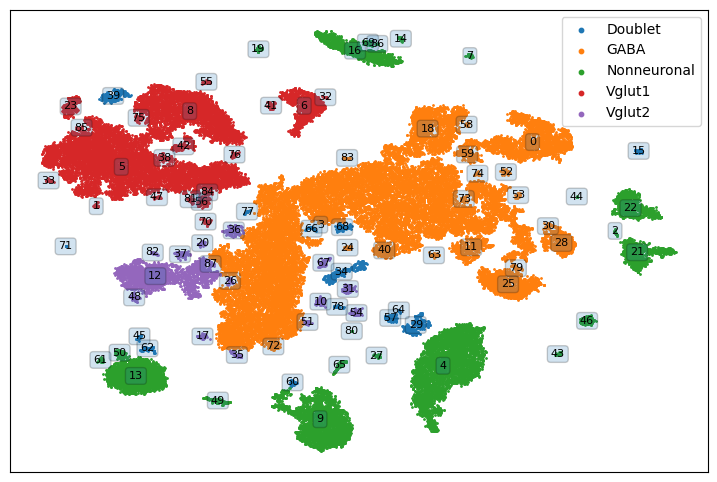

In [3]:
minpts = 20
labels, n_clusters_, arr_df, status_df = dp.do_dbscan(epsilon = epsilon, minpts = minpts, arr = arr_tsne, status_df = status_df)

cluster_pts = dp.histogram_pts_per_cluster(labels, minpts=minpts)

df_pre_linkage_ls, meta_data_df_pre_linkage, unique_labels = dp.sort_by_cluster_label(df_ls,meta_data_df,arr_df,labels)

linkage_alg = 'ward'
dist_metric = 'euclidean'

df_pre_linkage_ls = df_pre_linkage_ls.T

df_post_linkage, meta_data_df_post_linkage, linkage_cluster_order, Z_ordered, mpg_pca, linkage_cluster_order_po = dp.inter_cluster_sort(df_pre_linkage_ls,
                                                 meta_data_df_pre_linkage, 
                                                 unique_labels,
                                                 n_components = 10, 
                                                 linkage_alg = linkage_alg,
                                                 dist_metric = dist_metric)

df_s = df.reindex(columns = df_post_linkage.columns)

df_post_linkage_intra_sorted, meta_data_df_post_linkage_intra_sorted, cluster_indices = dp.intra_cluster_sort(df_s, meta_data_df_post_linkage, linkage_cluster_order)

marker_genes_sorted, pos, ind, ind_s, mgs = dp.compute_marker_genes(df_post_linkage_intra_sorted,
                                                meta_data_df_post_linkage_intra_sorted,
                                                cluster_indices,
                                                linkage_cluster_order,
                                                '/bigdata/isaac/',
                                                n_markers=5,
                                                class_score_name='NN_level1')

tg, tgfs = dp.get_heatmap_labels(mgs, ind, ind_s)

df_marker = df_post_linkage_intra_sorted.loc[marker_genes_sorted,:]

marker_log_and_std_arr, status_df = dp.log_and_standerdize_df(df_marker,status_df, log = False)

df_marker_log_and_std = pd.DataFrame(index = df_marker.index, columns=df_post_linkage_intra_sorted.columns, data = marker_log_and_std_arr.T)

df_marker_log_and_std_col = pd.DataFrame(data = df_marker_log_and_std.to_numpy(), 
                                         index = df_marker_log_and_std.index,
                                        columns = list(meta_data_df_post_linkage_intra_sorted.loc['cluster_label',:]))

change_indices = dp.get_heatmap_cluster_borders(meta_data_df_post_linkage_intra_sorted)

fs_w = dp.compute_fs_waterfall(marker_genes_sorted)

dp.plot_marker_heatmap(df_marker_log_and_std_col, 
                       pos, 
                       linkage_cluster_order, 
                       change_indices, 
                       tg, 
                       tgfs, 
                       linkage_alg,
                       dist_metric,
                       folder = '/bigdata/isaac/',
                       fs_waterfall=fs_w,
                       cell_class = 'NN_L1',
                       savefig = True)


Vglut1_marker = 'Slc17a7'

Vglut2_marker = 'Slc17a6'

GABA_marker = 'Gad2'

exclude_markers = ['C1qc','C1qa','C1qb','Gja1','Cx3cr1','Acta2','Ly6c1',
                   'Mfge8','Plxnb3','Cldn11','Aqp4','Vtn','Cldn5',
                   'Pdgfrb','Flt1','Slc25a18','Pdgfra','Foxj1',
                   'Olig1','Olig2','Sox10','Hbb-bs','Hbb-bt',
                   'Hba-a2','Ttr']

m_factor = 2 

exclude_markers_updated = []
for g in exclude_markers:
    print (g, g in df_marker.index)
    if g in df_marker.index:
        exclude_markers_updated.append(g)

df_ex_marker = df_pre_linkage_ls.loc[exclude_markers_updated,:]
nonneuro = df_ex_marker.sum(axis = 0)

mu_g, mu_vg1, mu_vg2, mu_nn, std_g, std_vg1,std_vg2,std_nn, labels_to_class_map, meta_data_df_mm = dp.compute_marker_means(
                     GABA_marker,
                     Vglut1_marker,
                     Vglut2_marker,
                     exclude_markers_updated,
                     df_marker,
                     meta_data_df_post_linkage_intra_sorted,
                     linkage_cluster_order,
                     m_factor)

s_bool,bn_bool, gaba_bool, doublet_bool, vglut1_bool, vglut2_bool, nonneuronal_bool = dp.get_boolean_vecs(meta_data_df_mm)

arr_df_class, arr_xy = dp.plot_cell_class(arr_df,labels_to_class_map,labels)

In [4]:
#check loc of epenymal cells from 2_17 metadata
NN_metadata_df_plis_F_markers_feb17 = pd.read_json('/bigdata/isaac/Nonneuronal_files/filtered_merged/NNmeta_data_df_plis_f_markers_2025-02-17.json')
epend_columns = NN_metadata_df_plis_F_markers_feb17.loc[:,NN_metadata_df_plis_F_markers_feb17.loc['markers',:] == 'Epend'].columns

In [5]:
set(epend_columns).issubset(set(df_marker.columns))

True

In [6]:
today

'2025-04-14'

In [8]:
np.any(df_marker.columns==meta_data_df_mm.columns)

True

In [9]:
outfile_name = 'NN_l1_df_marker_' + today
df_marker.to_feather('/bigdata/isaac/'+outfile_name+'.feather')
outfile_name = 'NN_l1_meta_data_df_mm_' + today
meta_data_df_mm.to_json('/bigdata/isaac/'+outfile_name+'.json')

params for dbscan
minpts:  20
epsilon percentile 65
epsilon:  1.1862182479325711

running dbscan with epsilon: 1.1862182479325711  and minpts: 20
Estimated number of clusters: 179
Estimated number of noise points: 5939


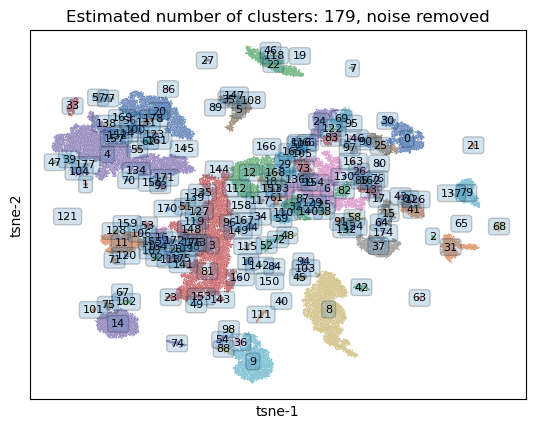

In [4]:
#debug to get back epend cells
epsilon, minpts, status_df = dp.compute_eps(minpts = 20, eps_prc=65, arr= arr_tsne, status_df = status_df)
labels, n_clusters_, arr_df, status_df = dp.do_dbscan(epsilon = epsilon, minpts = minpts, arr = arr_tsne, status_df = status_df)



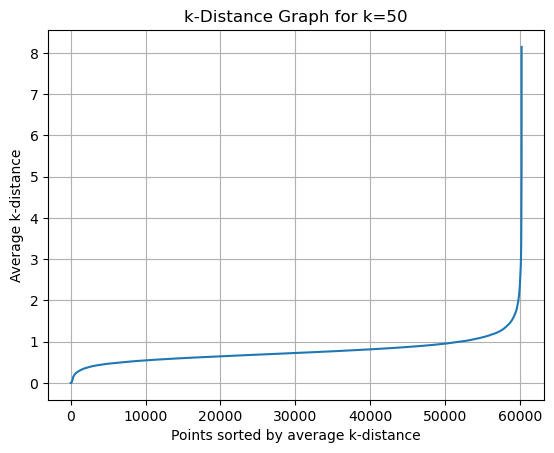

The knee is at x = 58936, y = 1.5100771707597722


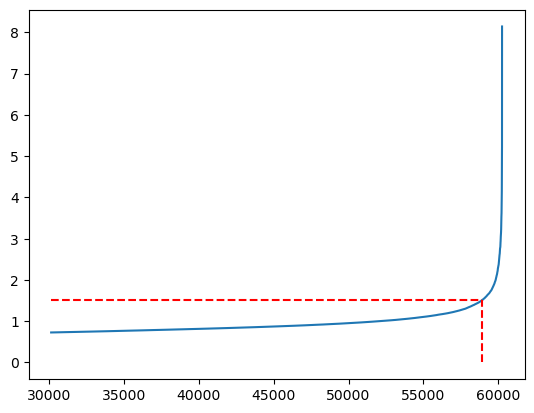

In [5]:
epsilon = dp.optimal_eps(arr_tsne, 20)

running dbscan with epsilon: 1.5100771707597722  and minpts: 20
Estimated number of clusters: 83
Estimated number of noise points: 1617


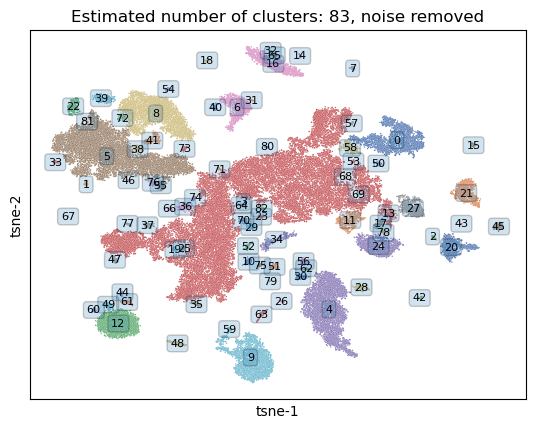

In [6]:
labels, n_clusters_, arr_df, status_df = dp.do_dbscan(epsilon = epsilon, minpts = minpts, arr = arr_tsne, status_df = status_df)